In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [5]:
# Read data
motion_08 = np.genfromtxt('../dataset2/motion_08.csv', delimiter=',')
print("Motion 0.8 data has a length of ", len(motion_08))

Motion 0.8 data has a length of  123421


## Visualizations

In [6]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FR)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FR)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FL)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FL)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RR)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RR)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RL)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RL)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FR)')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FR)', color='g')
          
    # FL plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FL)')
    ax3.set_xlabel('Time')
         
    # FL plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FL)', color='g')      
          
    # RR plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RR)')
    ax5.set_xlabel('Time')
         
    # RR plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RR)', color='g')   
          
    # RL plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RL)')
    ax7.set_xlabel('Time')
         
    # RL plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RL)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [7]:
"""
def get_specific_cmd(dataset, fwd, side, rot):
    return np.where(np.logical_and(dataset[:, 2] == fwd, 
                                   dataset[:, 3] == side, 
                                   dataset[:, 4] == rot))[0]
"""

def get_specific_cmd(dataset, fwd, side, rot):
    idxs = []
    for row_id, item in enumerate(dataset):
        if np.isclose(item[2], fwd, 0.01) and np.isclose(item[3], side, 0.01) and np.isclose(item[4], rot, 0.01):
            idxs.append(row_id)
    
    return idxs

In [8]:
def get_swinging_motions(dataset, height=-0.2):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 34] < height)[0]
    fl_min_height = np.where(dataset[:, 37] < height)[0]
    rr_min_height = np.where(dataset[:, 40] < height)[0]
    rl_min_height = np.where(dataset[:, 43] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## Motion_08

In [9]:
velocity = 0.809811

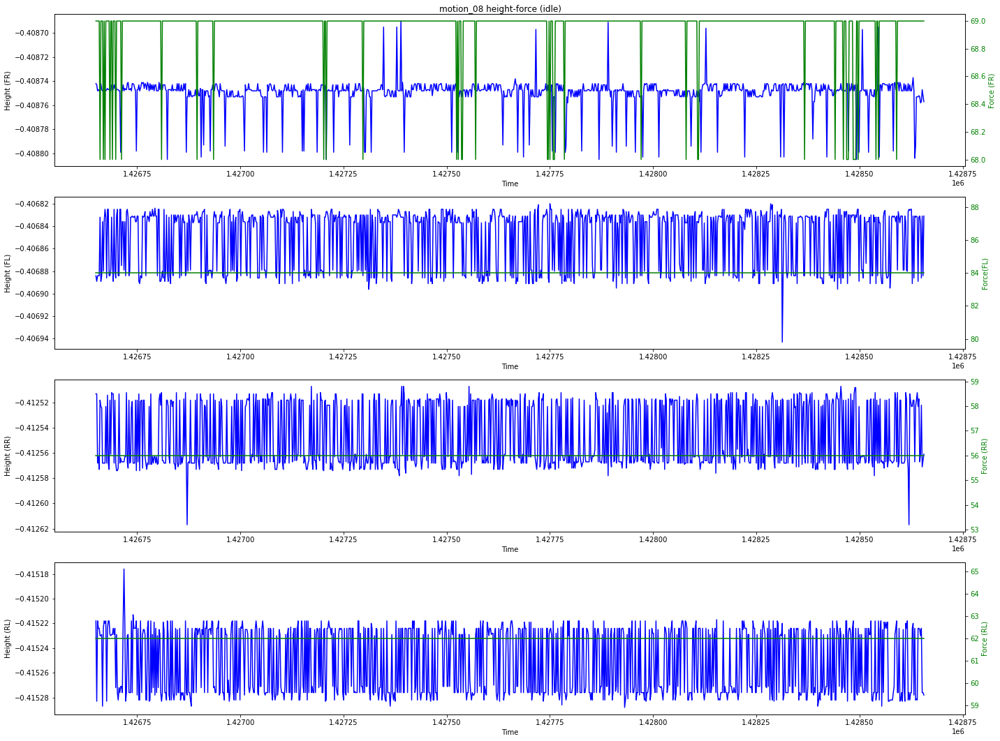

In [10]:
# Idle
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08)

sample_walking_fr_height = fr_min_height[:1000]
sample_walking_fl_height = fl_min_height[:1000]
sample_walking_rr_height = rr_min_height[:1000]
sample_walking_rl_height = rl_min_height[:1000]

plot_overlapping_data("motion_08 height-force (idle)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

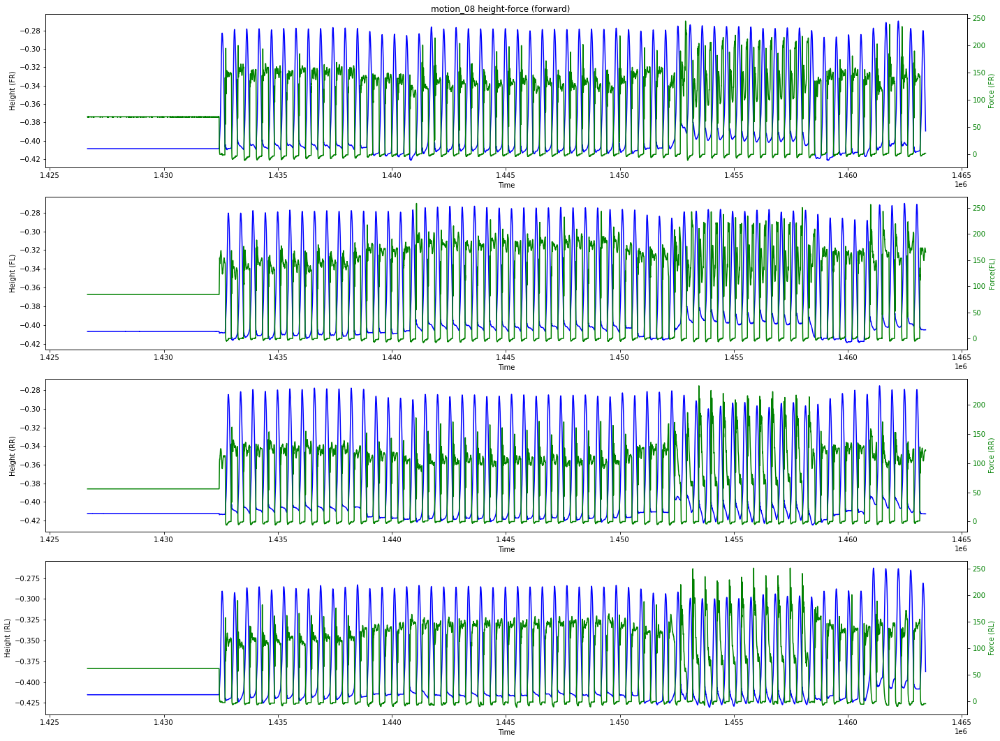

In [11]:
# Forward
fwd_cmds = get_specific_cmd(motion_08, velocity, 0, 0)
motion_08_fwd = motion_08[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_08 height-force (forward)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

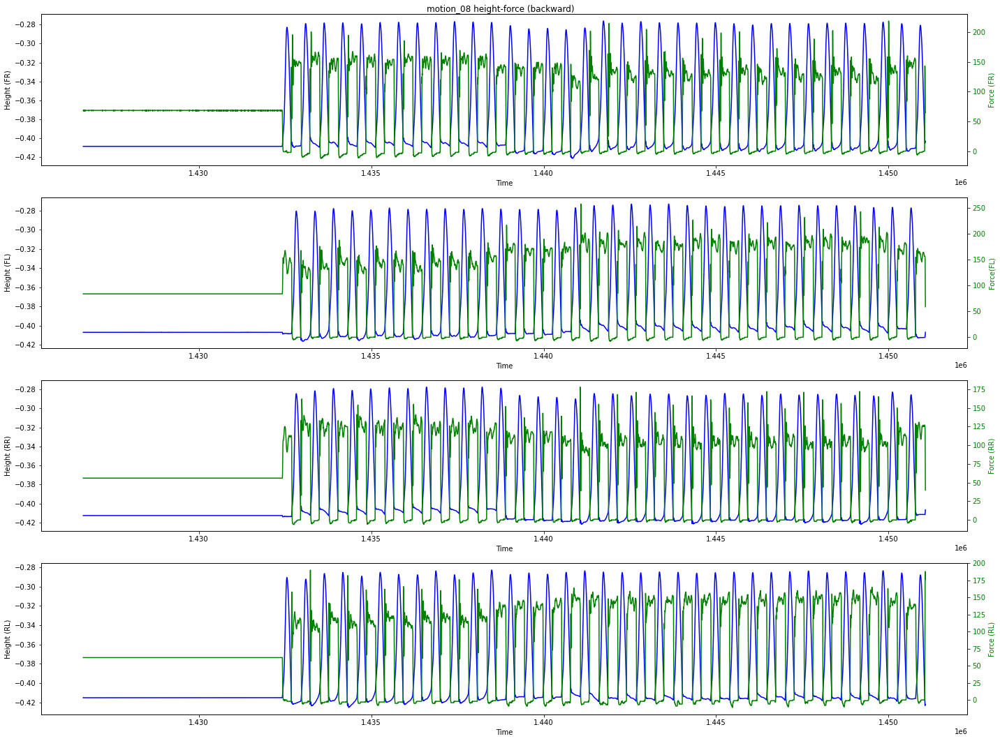

In [12]:
# Backwards
bwd_cmds = get_specific_cmd(motion_08, -velocity, 0, 0)
motion_08_bwd = motion_08[bwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08_bwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_08 height-force (backward)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

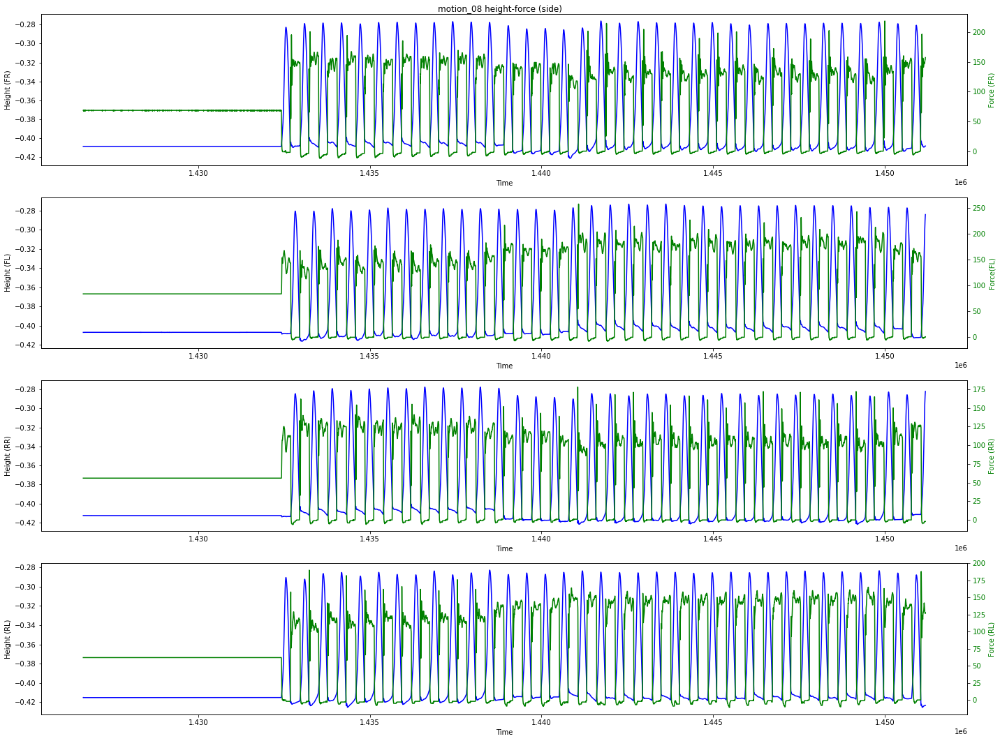

In [13]:
# Side (right)
side_cmds = get_specific_cmd(motion_08, 0, velocity, 0)
motion_08_side = motion_08[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_08 height-force (side)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

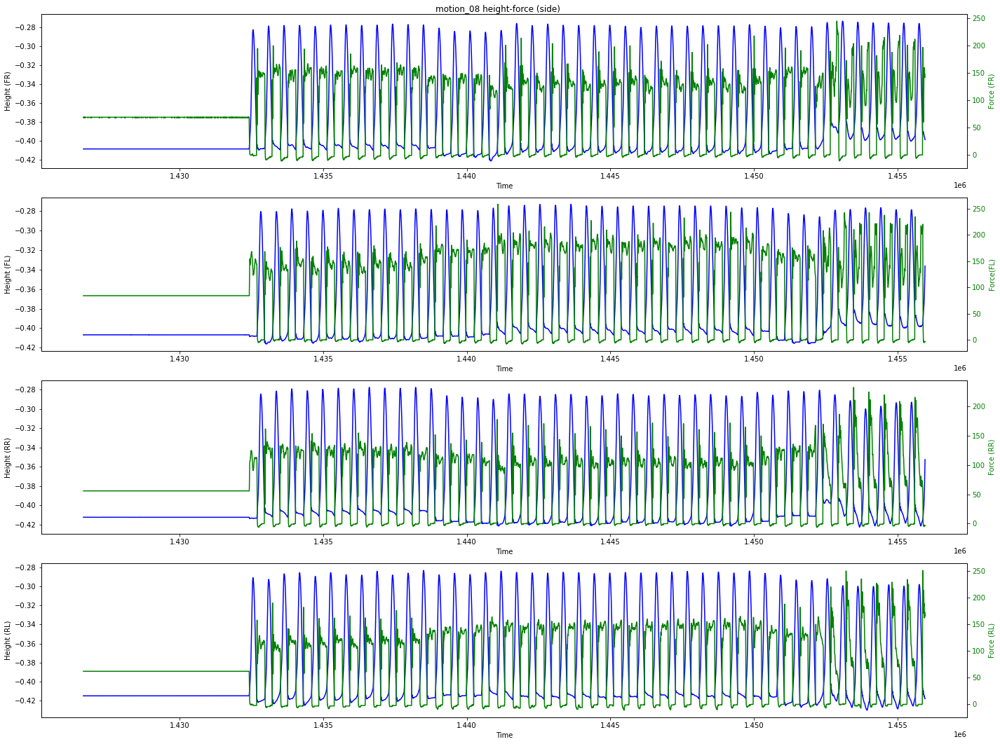

In [14]:
# Side (left)
side_cmds = get_specific_cmd(motion_08, 0, -velocity, 0)
motion_08_side = motion_08[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_08 height-force (side)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

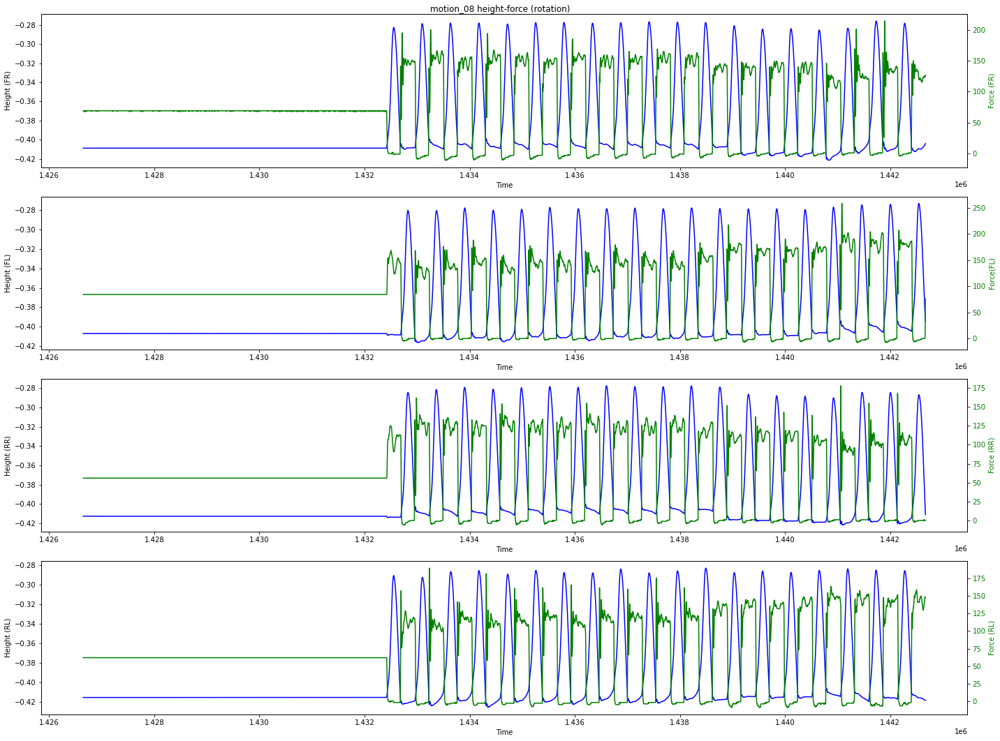

In [15]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion_08, 0, 0, velocity)
motion_08_rot = motion_08[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_08 height-force (rotation)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

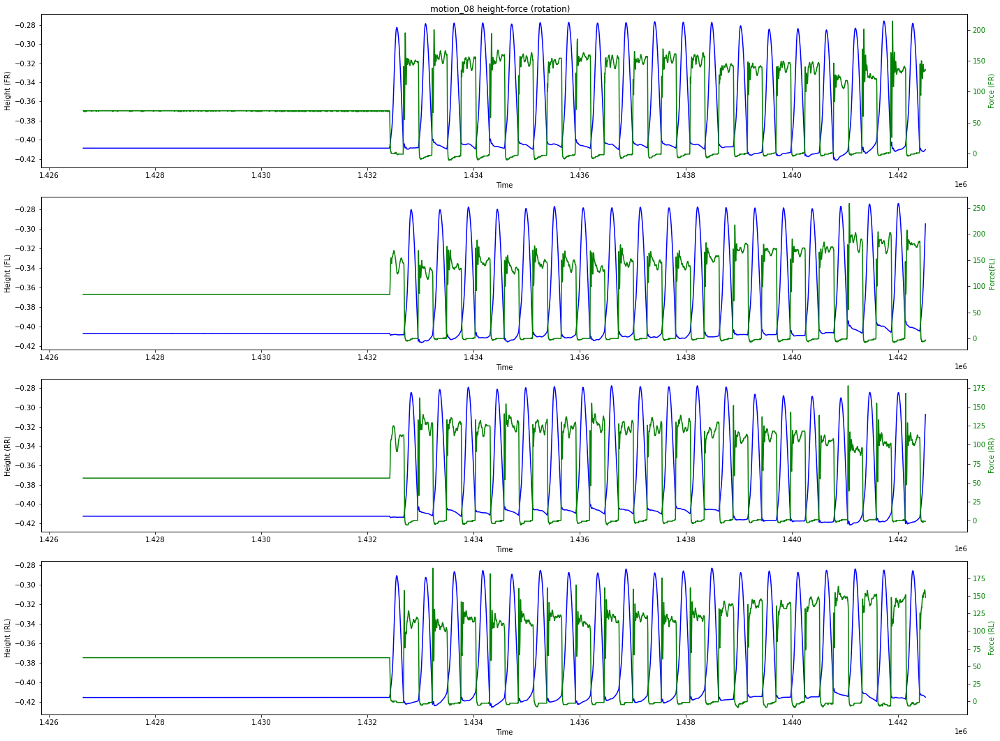

In [16]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion_08, 0, 0, -velocity)
motion_08_rot = motion_08[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_08_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_08 height-force (rotation)",
                      motion_08,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

## Footsteps Extraction (Height + Force)

In [17]:
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(np.abs(dataset[:, 34] - dataset[:, 37]), 9)

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(np.abs(dataset[:, 40] - dataset[:, 43]), 9)
    
    # Compute compound difference for all foots
    height_diff = fr_fl_diff + rr_rl_diff
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    #footsteps_height = np.where(height_diff < height_threshold)[0]
    footsteps_height = np.intersect1d(np.where(fr_fl_diff < height_threshold), np.where(rr_rl_diff < height_threshold))
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Footsteps that belong to motion commands
    footsteps_due_to_motion = len(np.intersect1d(np.where(np.any(dataset[:, 2:5], axis=1))[0], footsteps_height))
    print("Intersection with motion commands: ", footsteps_due_to_motion, "\n")
    
    # Footsteps that belong to idle mode
    footsteps_due_to_stationarity = len(np.intersect1d(np.where(~np.any(dataset[:, 2:5], axis=1))[0], footsteps_height))
    print("Intersection with no motion commands: ", footsteps_due_to_stationarity, "\n")
    
    # FR min height (i.e swining motion)
    rear_force_footsteps = np.where(np.logical_and(dataset[:, 58] > force_thresholds[0], 
                                                   dataset[:, 59] > force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_and(dataset[:, 56] > force_thresholds[2], 
                                                    dataset[:, 57] > force_thresholds[3]))[0]

    # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    # Footsteps (from force and height) that belong to motion commands
    footsteps_due_to_motion = len(np.intersect1d(np.where(np.any(dataset[:, 2:5], axis=1))[0], force_height_footsteps))
    print("Number of footsteps extracted with height-force due to motion: ", footsteps_due_to_motion, "\n")
    
    # Footsteps (from force and height) that belong to motion commands
    footsteps_due_to_stationarity = len(np.intersect1d(np.where(~np.any(dataset[:, 2:5], axis=1))[0], force_height_footsteps))
    print("Number of footsteps extracted with height-force due to no motion: ", footsteps_due_to_stationarity, "\n")
    
    return force_height_footsteps

def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    footsteps_sort, timestamps_sort = zip(*sorted(zip(footsteps, dataset[footsteps, 0])))

    for idx, footstep_sort in enumerate(footsteps_sort):
        if idx > 0:
            if abs(dataset[footstep_sort, 0] - dataset[footsteps_sort[idx-1], 0]) < 9:
                continue
            else:
                footsteps_nms.append(footstep_sort)
        else:
            footsteps_nms.append(footstep_sort)

    return np.asarray(footsteps_nms)

## Footsteps

In [18]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_08_cmds = motion_08[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_08_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_08_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_08_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_08_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height, 
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [34, 56, 37, 57, 40, 58, 43, 59],
                           True,
                           motion_08_cmds[footsteps_nms(motion_08_cmds, footsteps), 0])
    
    return motion_08_cmds, footsteps_after_nms

### Forward motion

Foot swinging motions lenghts:  18310 18310 18310 18310
Min and max diff between front and rear feet 7.6e-05 0.26565 

Amount of footsteps found with height criteria:  5151 

Intersection with motion commands:  5151 

Intersection with no motion commands:  0 

Number of force footsteps:  916 

Number of height-force footsteps:  916 

Number of footsteps extracted with height-force due to motion:  916 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  916
Footsteps after non-maximum-suppression:  137


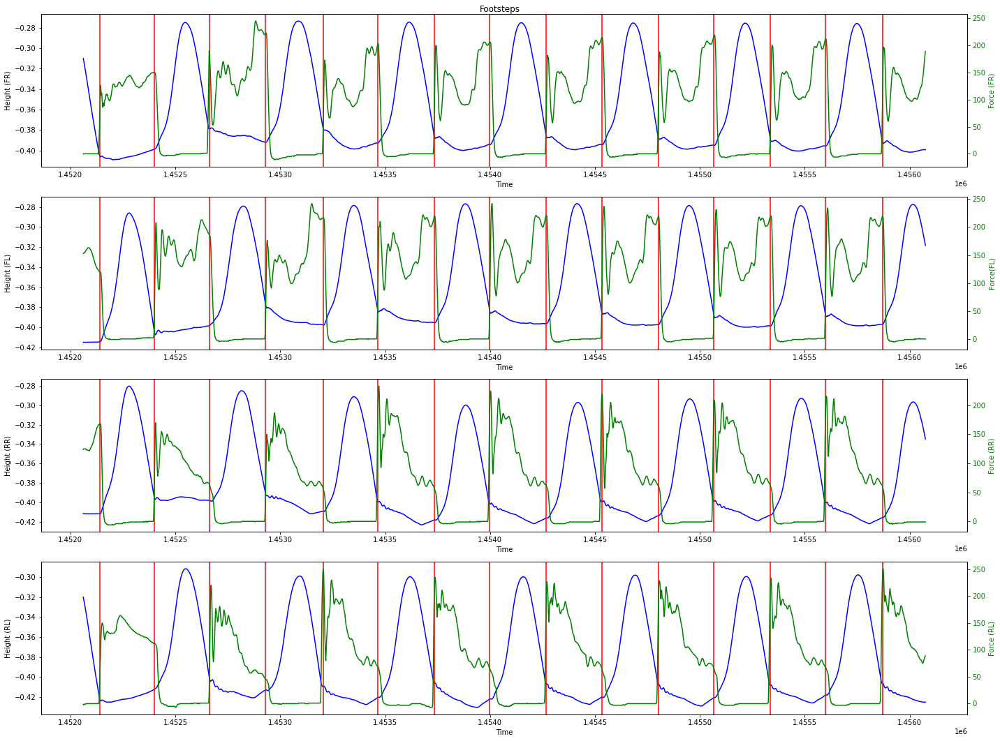

In [19]:
motion_08_fwd, footsteps_08_fwd = footstep_extraction_and_plotting(dataset=motion_08, velocities=[velocity, 0, 0], height_threshold=0.03, force_thresholds=[40,40,40,40], indexes=range(0, 2000))

### Backward motion

Foot swinging motions lenghts:  12162 12162 12162 12162
Min and max diff between front and rear feet 0.0012929999999999999 0.28227599999999997 

Amount of footsteps found with height criteria:  7657 

Intersection with motion commands:  7657 

Intersection with no motion commands:  0 

Number of force footsteps:  315 

Number of height-force footsteps:  315 

Number of footsteps extracted with height-force due to motion:  315 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  315
Footsteps after non-maximum-suppression:  88


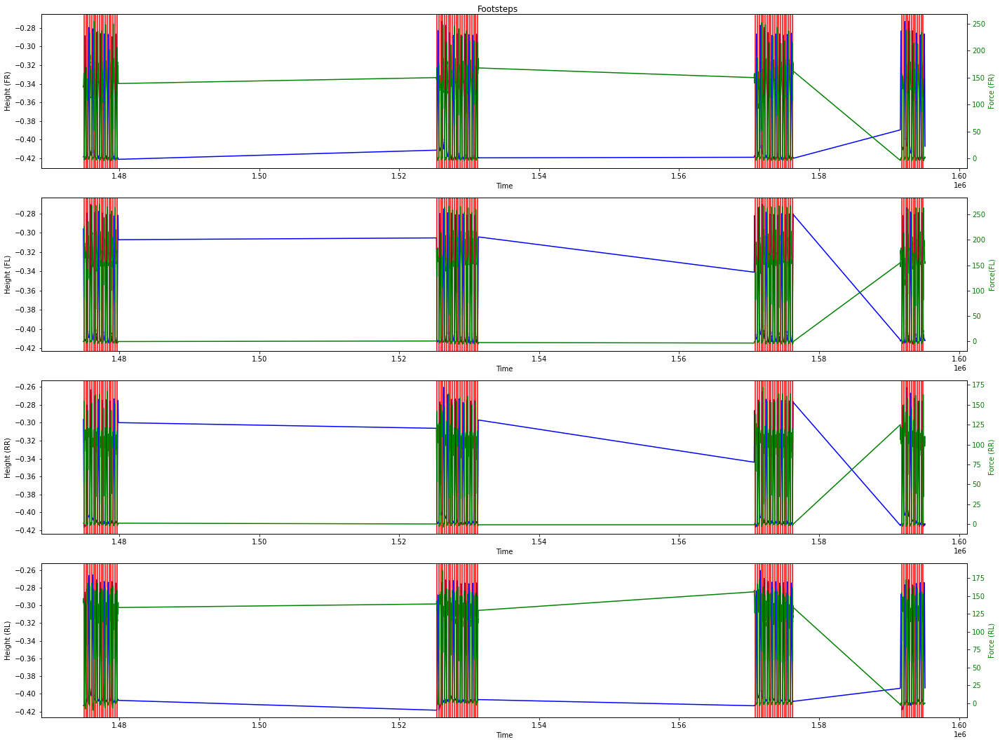

In [20]:
motion_08_bwd, footsteps_08_bwd = footstep_extraction_and_plotting(dataset=motion_08, velocities=[-velocity, 0, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 10000))

### Side motion (right)

Foot swinging motions lenghts:  12221 12221 12221 12221
Min and max diff between front and rear feet 0.00039099999999999996 0.268649 

Amount of footsteps found with height criteria:  7838 

Intersection with motion commands:  7838 

Intersection with no motion commands:  0 

Number of force footsteps:  330 

Number of height-force footsteps:  330 

Number of footsteps extracted with height-force due to motion:  330 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  330
Footsteps after non-maximum-suppression:  90


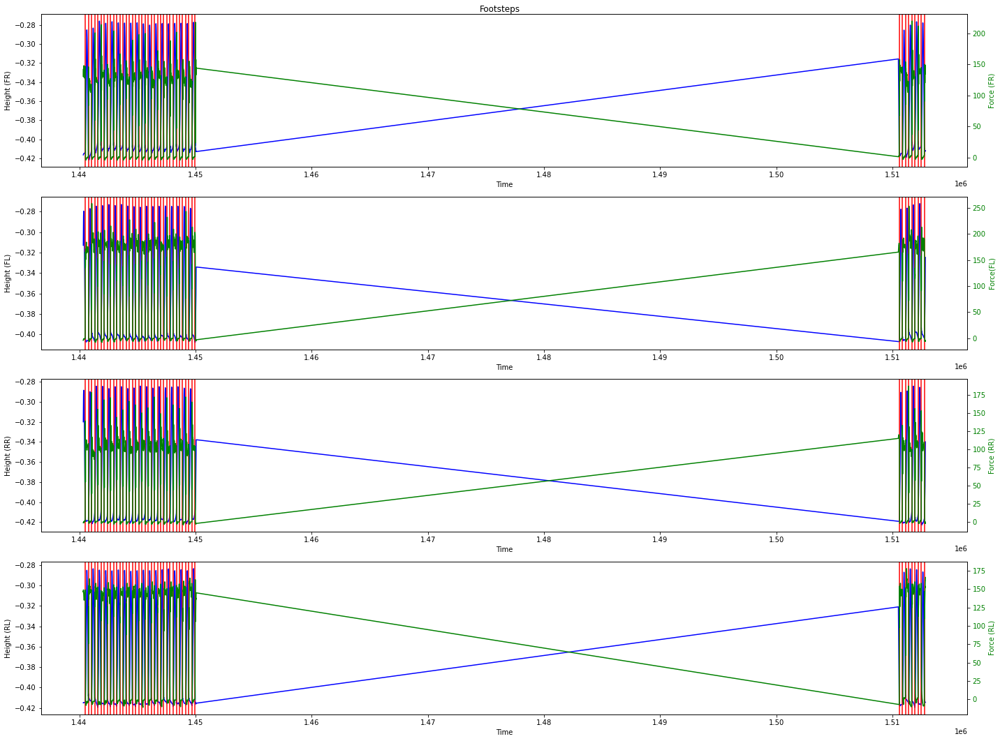

In [21]:
motion_08_side_right, footsteps_08_side_right = footstep_extraction_and_plotting(dataset=motion_08, velocities=[0, velocity, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 6000))

### Side (left)

Foot swinging motions lenghts:  14595 14595 14595 14595
Min and max diff between front and rear feet 0.00065 0.26831099999999997 

Amount of footsteps found with height criteria:  9225 

Intersection with motion commands:  9225 

Intersection with no motion commands:  0 

Number of force footsteps:  425 

Number of height-force footsteps:  425 

Number of footsteps extracted with height-force due to motion:  425 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  425
Footsteps after non-maximum-suppression:  108


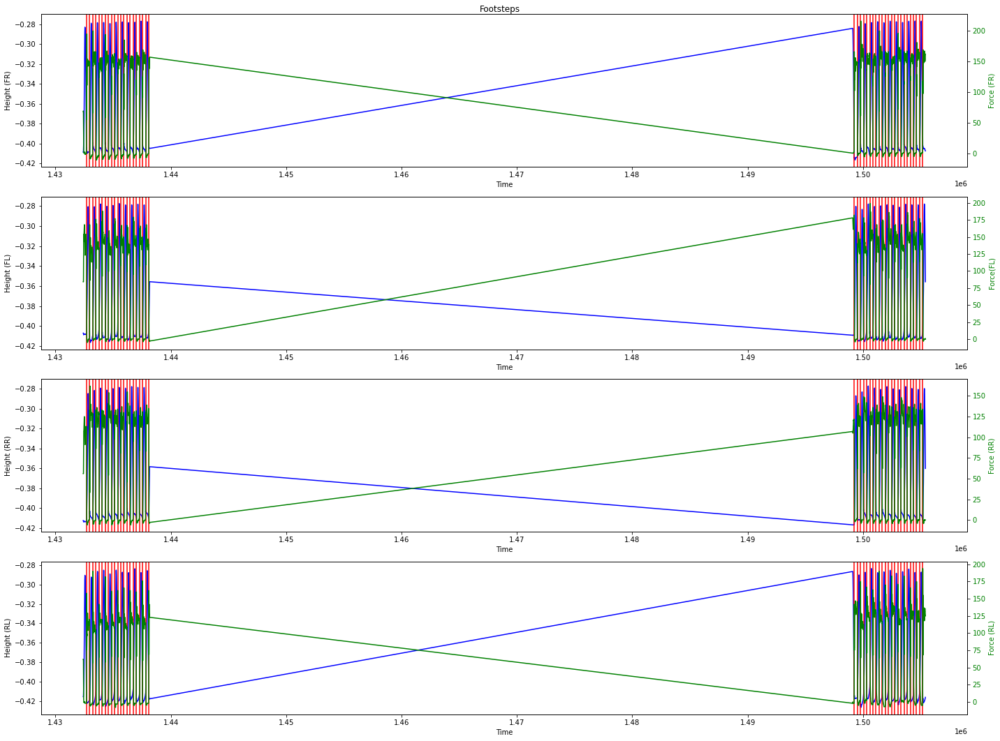

In [22]:
motion_08_side_left, footsteps_08_side_left = footstep_extraction_and_plotting(dataset=motion_08, velocities=[0, -velocity, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 6000))

### Rotation (clockwise)

Foot swinging motions lenghts:  7979 7979 7979 7979
Min and max diff between front and rear feet 0.000871 0.271089 

Amount of footsteps found with height criteria:  5137 

Intersection with motion commands:  5137 

Intersection with no motion commands:  0 

Number of force footsteps:  190 

Number of height-force footsteps:  190 

Number of footsteps extracted with height-force due to motion:  190 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  190
Footsteps after non-maximum-suppression:  60


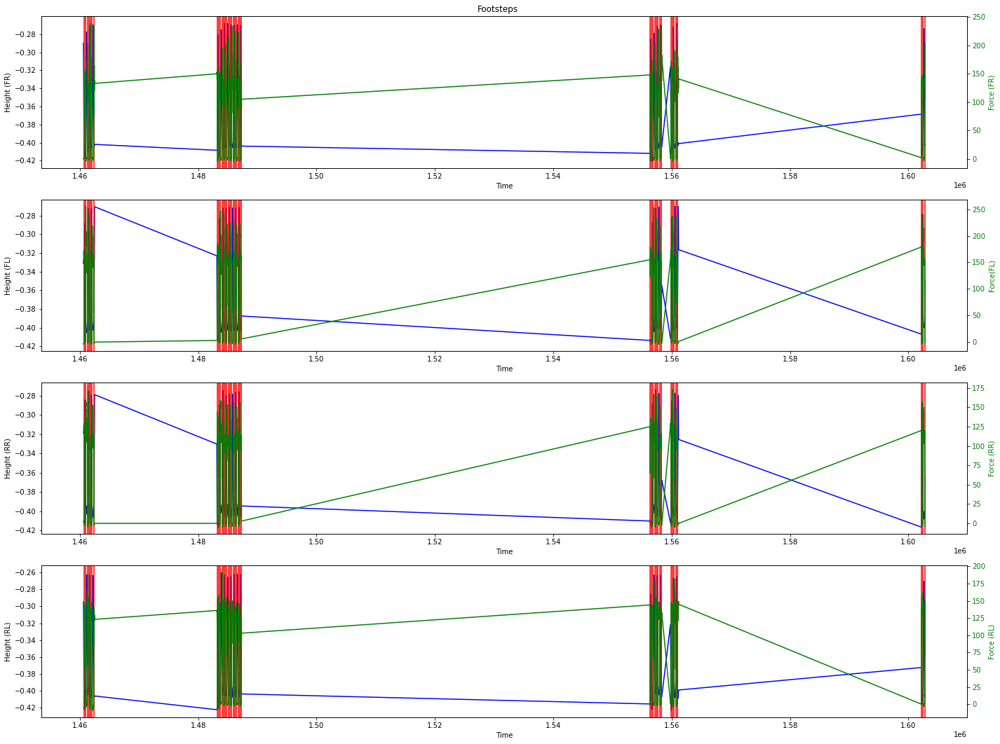

In [23]:
motion_08_clock, footsteps_08_clock = footstep_extraction_and_plotting(dataset=motion_08, velocities=[0, 0, velocity], height_threshold=0.1, force_thresholds=[90,90,90,90], indexes=range(0, 5000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  7902 7902 7902 7902
Min and max diff between front and rear feet 0.000439 0.28054 

Amount of footsteps found with height criteria:  5040 

Intersection with motion commands:  5040 

Intersection with no motion commands:  0 

Number of force footsteps:  250 

Number of height-force footsteps:  250 

Number of footsteps extracted with height-force due to motion:  250 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  250
Footsteps after non-maximum-suppression:  59


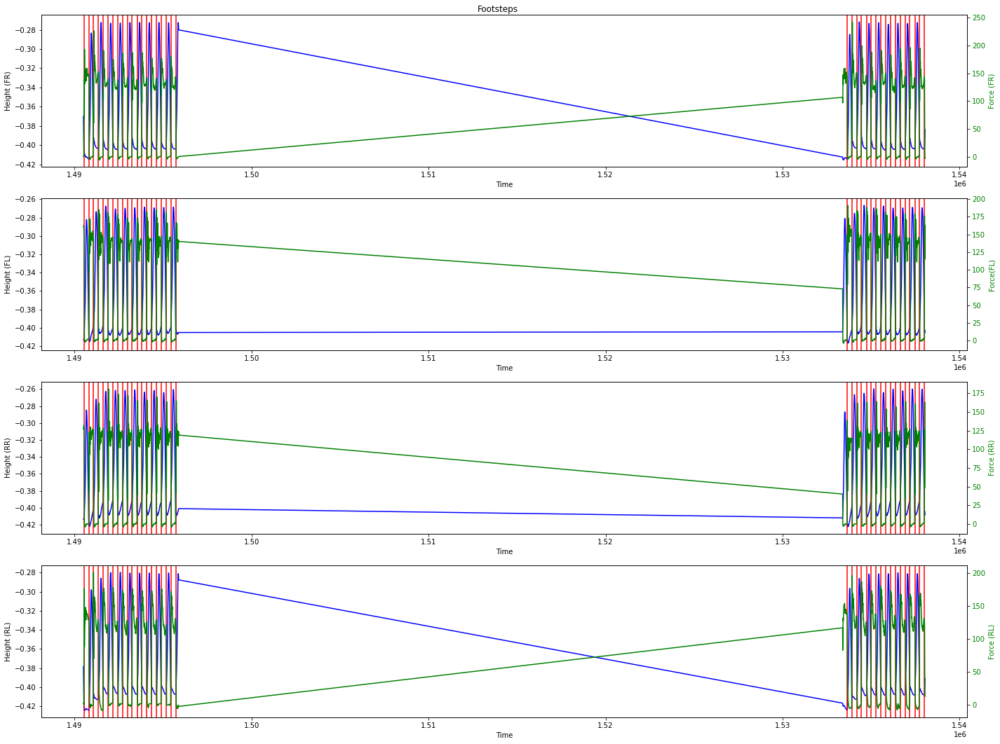

In [24]:
motion_08_count, footsteps_08_count = footstep_extraction_and_plotting(dataset=motion_08, velocities=[0, 0, -velocity], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 5000))

### Step size

In [25]:
def get_step_size(dataset, footsteps, idx_coord=[32,35,38,41]):
    # Footsteps sizes
    step_size_fr = []
    step_size_fl = []
    step_size_rr = []
    step_size_rl = []
    footstep_period = []
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 300:
                footstep_period.append(time_diff)
                step_size_fr.append(dataset[footsteps[idx], idx_coord[0]] - dataset[footsteps[idx-1], idx_coord[0]])
                step_size_fl.append(dataset[footsteps[idx], idx_coord[1]] - dataset[footsteps[idx-1], idx_coord[1]])
                step_size_rr.append(dataset[footsteps[idx], idx_coord[2]] - dataset[footsteps[idx-1], idx_coord[2]])
                step_size_rl.append(dataset[footsteps[idx], idx_coord[3]] - dataset[footsteps[idx-1], idx_coord[3]])
    
    # Convert to numpy array
    step_size_fr_numpy = np.array(step_size_fr)
    step_size_fl_numpy = np.array(step_size_fl)
    step_size_rr_numpy = np.array(step_size_rr)
    step_size_rl_numpy = np.array(step_size_rl)
    footstep_period_numpy = np.array(footstep_period)
    
    # Only keep positive footsteps
    step_size_fr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_fl_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rl_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    
    # Print average step-size
    print("Avg. step size time: ", np.mean(footstep_period_numpy))
    print("Avg. step size for FR foot: ", np.mean(step_size_fr_numpy))
    print("Avg. step size for FL foot: ", np.mean(step_size_fl_numpy))
    print("Avg. step size for RR foot: ", np.mean(step_size_rr_numpy))
    print("Avg. step size for RL foot: ", np.mean(step_size_rl_numpy), '\n')

    # Print std. dev. step-size
    print("Std. dev. step size for FR foot: ", np.std(step_size_fr_numpy))
    print("Std. dev. step size for FL foot: ", np.std(step_size_fl_numpy))
    print("Std. dev. step size for RR foot: ", np.std(step_size_rr_numpy))
    print("Std. dev. step size for RL foot: ", np.std(step_size_rl_numpy), '\n')
    
    return step_size_fr_numpy, step_size_fl_numpy, step_size_rr_numpy, step_size_rl_numpy

#### Forward motion

In [26]:
# Step size and velocity along x axis 
step_size_fr_x_fwd,_,_,_ = get_step_size(motion_08_fwd, footsteps_08_fwd)

Avg. step size time:  266.12598425196853
Avg. step size for FR foot:  0.2703139163934426
Avg. step size for FL foot:  0.2703139163934426
Avg. step size for RR foot:  0.2703139163934426
Avg. step size for RL foot:  0.2703139163934426 

Std. dev. step size for FR foot:  0.05181556786108415
Std. dev. step size for FL foot:  0.05181556786108415
Std. dev. step size for RR foot:  0.05181556786108415
Std. dev. step size for RL foot:  0.05181556786108415 



In [27]:
step_size_fr_x_fwd

array([0.161953 , 0.3382384, 0.275457 , 0.273898 , 0.276203 , 0.276017 ,
       0.272545 , 0.275454 , 0.272725 , 0.273203 , 0.2815429, 0.28643  ,
       0.278761 , 0.273821 , 0.275545 , 0.275635 , 0.276276 , 0.270999 ,
       0.274415 , 0.275688 , 0.275508 , 0.026408 , 0.3513937, 0.273367 ,
       0.279169 , 0.280716 , 0.03929  , 0.3567562, 0.269951 , 0.274578 ,
       0.280899 , 0.277187 , 0.278808 , 0.3108883, 0.282122 , 0.280358 ,
       0.276019 , 0.277474 , 0.277084 , 0.272684 , 0.220244 , 0.3042708,
       0.282736 , 0.280222 , 0.3088877, 0.280815 , 0.277916 , 0.180692 ,
       0.3211023, 0.276095 , 0.27728  , 0.2602373, 0.2887183, 0.282963 ,
       0.281372 , 0.281019 , 0.277428 , 0.27678  , 0.27606  , 0.274576 ,
       0.274268 ])

In [28]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_08_fwd, footsteps_08_fwd, idx_coord=[33, 36, 39, 42])

Avg. step size time:  266.12598425196853
Avg. step size for FR foot:  0.01797644696969697
Avg. step size for FL foot:  0.01797644696969697
Avg. step size for RR foot:  0.01797644696969697
Avg. step size for RL foot:  0.01797644696969697 

Std. dev. step size for FR foot:  0.01928160081052479
Std. dev. step size for FL foot:  0.01928160081052479
Std. dev. step size for RR foot:  0.01928160081052479
Std. dev. step size for RL foot:  0.01928160081052479 



### Backward motion

In [29]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_08_bwd, footsteps_08_bwd)

Avg. step size time:  276.0120481927711
Avg. step size for FR foot:  0.1143944761904762
Avg. step size for FL foot:  0.1143944761904762
Avg. step size for RR foot:  0.1143944761904762
Avg. step size for RL foot:  0.1143944761904762 

Std. dev. step size for FR foot:  0.030831545282186693
Std. dev. step size for FL foot:  0.030831545282186693
Std. dev. step size for RR foot:  0.030831545282186693
Std. dev. step size for RL foot:  0.030831545282186693 



In [30]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_08_bwd, footsteps_08_bwd, idx_coord=[33, 36, 39, 42])

Avg. step size time:  276.0120481927711
Avg. step size for FR foot:  0.021242045454545454
Avg. step size for FL foot:  0.021242045454545454
Avg. step size for RR foot:  0.021242045454545454
Avg. step size for RL foot:  0.021242045454545454 

Std. dev. step size for FR foot:  0.011391107506524842
Std. dev. step size for FL foot:  0.011391107506524842
Std. dev. step size for RR foot:  0.011391107506524842
Std. dev. step size for RL foot:  0.011391107506524842 



### Side motion (right)

In [31]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_08_side_right, footsteps_08_side_right)

Avg. step size time:  270.08235294117645
Avg. step size for FR foot:  0.004339204545454547
Avg. step size for FL foot:  0.004339204545454547
Avg. step size for RR foot:  0.004339204545454547
Avg. step size for RL foot:  0.004339204545454547 

Std. dev. step size for FR foot:  0.0030625279930412306
Std. dev. step size for FL foot:  0.0030625279930412306
Std. dev. step size for RR foot:  0.0030625279930412306
Std. dev. step size for RL foot:  0.0030625279930412306 



In [32]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_08_side_right, footsteps_08_side_right, idx_coord=[33, 36, 39, 42])

Avg. step size time:  270.08235294117645
Avg. step size for FR foot:  0.04928686046511629
Avg. step size for FL foot:  0.04928686046511629
Avg. step size for RR foot:  0.04928686046511629
Avg. step size for RL foot:  0.04928686046511629 

Std. dev. step size for FR foot:  0.019478958774977528
Std. dev. step size for FL foot:  0.019478958774977528
Std. dev. step size for RR foot:  0.019478958774977528
Std. dev. step size for RL foot:  0.019478958774977528 



### Side motions (left)

In [33]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_08_side_left, footsteps_08_side_left)

Avg. step size time:  269.747572815534
Avg. step size for FR foot:  0.01941576
Avg. step size for FL foot:  0.01941576
Avg. step size for RR foot:  0.01941576
Avg. step size for RL foot:  0.01941576 

Std. dev. step size for FR foot:  0.0032653175500094935
Std. dev. step size for FL foot:  0.0032653175500094935
Std. dev. step size for RR foot:  0.0032653175500094935
Std. dev. step size for RL foot:  0.0032653175500094935 



In [34]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_08_side_left, footsteps_08_side_left, idx_coord=[33, 36, 39, 42])

Avg. step size time:  269.747572815534
Avg. step size for FR foot:  0.03915376481481481
Avg. step size for FL foot:  0.03915376481481481
Avg. step size for RR foot:  0.03915376481481481
Avg. step size for RL foot:  0.03915376481481481 

Std. dev. step size for FR foot:  0.016269567700978566
Std. dev. step size for FL foot:  0.016269567700978566
Std. dev. step size for RR foot:  0.016269567700978566
Std. dev. step size for RL foot:  0.016269567700978566 



### Rotation (clockwise)

In [35]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_08_clock, footsteps_08_clock)

Avg. step size time:  271.7169811320755
Avg. step size for FR foot:  0.06634070370370371
Avg. step size for FL foot:  0.06634070370370371
Avg. step size for RR foot:  0.06634070370370371
Avg. step size for RL foot:  0.06634070370370371 

Std. dev. step size for FR foot:  0.021212224961991474
Std. dev. step size for FL foot:  0.021212224961991474
Std. dev. step size for RR foot:  0.021212224961991474
Std. dev. step size for RL foot:  0.021212224961991474 



In [36]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_08_clock, footsteps_08_clock, idx_coord=[33, 36, 39, 42])

Avg. step size time:  271.7169811320755
Avg. step size for FR foot:  0.0973039
Avg. step size for FL foot:  0.0973039
Avg. step size for RR foot:  0.0973039
Avg. step size for RL foot:  0.0973039 

Std. dev. step size for FR foot:  0.027501757970777068
Std. dev. step size for FL foot:  0.027501757970777068
Std. dev. step size for RR foot:  0.027501757970777068
Std. dev. step size for RL foot:  0.027501757970777068 



### Rotation (counter clockwise)

In [37]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_08_count, footsteps_08_count)

Avg. step size time:  272.0943396226415
Avg. step size for FR foot:  0.03480832142857143
Avg. step size for FL foot:  0.03480832142857143
Avg. step size for RR foot:  0.03480832142857143
Avg. step size for RL foot:  0.03480832142857143 

Std. dev. step size for FR foot:  0.01000354453986033
Std. dev. step size for FL foot:  0.01000354453986033
Std. dev. step size for RR foot:  0.01000354453986033
Std. dev. step size for RL foot:  0.01000354453986033 



In [38]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_08_count, footsteps_08_count, idx_coord=[33, 36, 39, 42])

Avg. step size time:  272.0943396226415
Avg. step size for FR foot:  0.07896182500000001
Avg. step size for FL foot:  0.07896182500000001
Avg. step size for RR foot:  0.07896182500000001
Avg. step size for RL foot:  0.07896182500000001 

Std. dev. step size for FR foot:  0.018522919345900418
Std. dev. step size for FL foot:  0.018522919345900418
Std. dev. step size for RR foot:  0.018522919345900418
Std. dev. step size for RL foot:  0.018522919345900418 



### Footstep visualization

In [39]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        #if time_diff < 300:
        # 3D positions
        xs = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
        ys = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
        zs = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])    

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 2:5]}. State: {dataset[footstep, 25:28]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 2:5]}. State: {dataset[footstep, 25:28]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [40]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    new_y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    new_z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

In [41]:
def update_prediction_points(dataset, num, x, y, z, points):  
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    D[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    new_y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    new_z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_predicted_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    D[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, x, y, z, points))
    
    return anim   

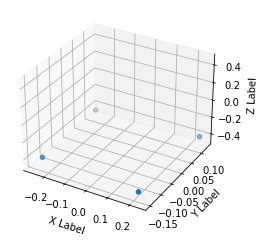

Time diff:  261.0
Footstep timestamp:  1452139.0
Height check index:  89
Height check timestamp:  1452239.0

FL moving: 0.09325699999999998. FR moving: 0.0030080000000000107
RL moving: 0.0007030000000000092. RR moving: 0.09709899999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.405073. FR later: -0.408081
RR moving: -0.414471. RL moving: -0.321214

Coord FR: [0.22, -0.149, -0.405]. Coord FL: [0.237, 0.129, -0.414]. Coord RR: [-0.248, -0.133, -0.412]. Coord RL: [-0.263, 0.117, -0.422]

FR step_size: 0.092972. FL step_size: 0. RR step size: 0. RL step_size: 0.087901.


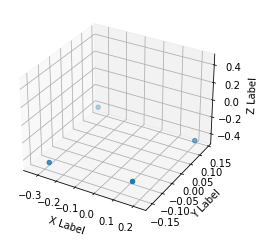

Time diff:  263.0
Footstep timestamp:  1452400.0
Height check index:  219
Height check timestamp:  1452500.0

FL moving: 0.0006450000000000067. FR moving: 0.084013
RL moving: 0.07801000000000002. RR moving: 6.700000000003925e-05

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398723. FR later: -0.31471
RR moving: -0.404536. RL moving: -0.403891

Coord FR: [0.142, -0.13, -0.399]. Coord FL: [0.222, 0.114, -0.405]. Coord RR: [-0.262, -0.16, -0.395]. Coord RL: [-0.337, 0.141, -0.412]

FR step_size: 0.32270750000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.341407.


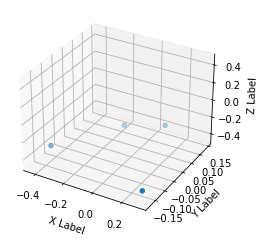

Time diff:  267.0
Footstep timestamp:  1452663.0
Height check index:  350
Height check timestamp:  1452763.0

FL moving: 0.07383800000000001. FR moving: 0.006958999999999993
RL moving: 0.012878. RR moving: 0.07225899999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.378626. FR later: -0.385585
RR moving: -0.398004. RL moving: -0.324166

Coord FR: [0.304, -0.177, -0.379]. Coord FL: [0.061, 0.141, -0.398]. Coord RR: [-0.432, -0.103, -0.398]. Coord RL: [-0.165, 0.088, -0.402]

FR step_size: 0.5580714. FL step_size: 0. RR step size: 0. RL step_size: 0.5642929999999999.


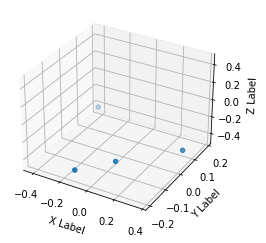

Time diff:  275.0
Footstep timestamp:  1452930.0
Height check index:  482
Height check timestamp:  1453029.0

FL moving: 0.015388000000000013. FR moving: 0.07683100000000004
RL moving: 0.06840400000000002. RR moving: 0.007058000000000009

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.391983. FR later: -0.315152
RR moving: -0.377552. RL moving: -0.39294

Coord FR: [0.05, -0.091, -0.392]. Coord FL: [0.366, 0.066, -0.378]. Coord RR: [-0.122, -0.198, -0.391]. Coord RL: [-0.419, 0.186, -0.413]

FR step_size: 0.6096347. FL step_size: 0. RR step size: 0. RL step_size: 0.589159.


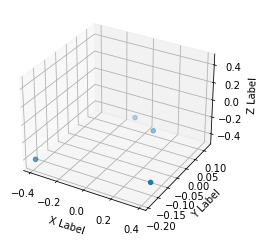

Time diff:  259.0
Footstep timestamp:  1453205.0
Height check index:  619
Height check timestamp:  1453304.0

FL moving: 0.08445399999999997. FR moving: 0.017006999999999994
RL moving: 0.01110899999999998. RR moving: 0.08532999999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.378441. FR later: -0.395448
RR moving: -0.397709. RL moving: -0.313255

Coord FR: [0.389, -0.148, -0.378]. Coord FL: [0.095, 0.077, -0.398]. Coord RR: [-0.395, -0.19, -0.409]. Coord RL: [-0.102, 0.117, -0.41]

FR step_size: 0.5660900000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5838094.


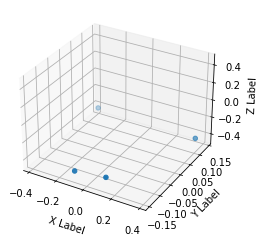

Time diff:  269.0
Footstep timestamp:  1453464.0
Height check index:  748
Height check timestamp:  1453563.0

FL moving: 0.007318999999999964. FR moving: 0.07611299999999999
RL moving: 0.076121. RR moving: 0.010939000000000032

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.392546. FR later: -0.316433
RR moving: -0.382738. RL moving: -0.390057

Coord FR: [0.114, -0.135, -0.393]. Coord FL: [0.386, 0.115, -0.383]. Coord RR: [-0.094, -0.146, -0.399]. Coord RL: [-0.385, 0.138, -0.421]

FR step_size: 0.5583309999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.5878454.


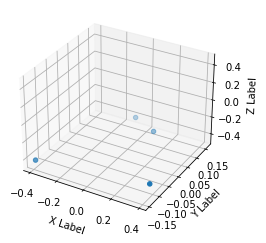

Time diff:  265.0
Footstep timestamp:  1453733.0
Height check index:  882
Height check timestamp:  1453832.0

FL moving: 0.07764299999999996. FR moving: 0.012463999999999975
RL moving: 0.016254999999999964. RR moving: 0.07832499999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385436. FR later: -0.3979
RR moving: -0.395184. RL moving: -0.317541

Coord FR: [0.389, -0.108, -0.385]. Coord FL: [0.103, 0.115, -0.395]. Coord RR: [-0.393, -0.145, -0.418]. Coord RL: [-0.096, 0.158, -0.406]

FR step_size: 0.562177. FL step_size: 0. RR step size: 0. RL step_size: 0.5711268.


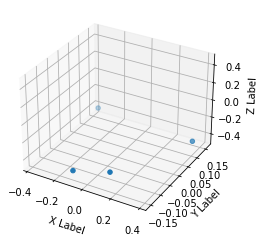

Time diff:  269.0
Footstep timestamp:  1453998.0
Height check index:  1014
Height check timestamp:  1454097.0

FL moving: 0.009896000000000016. FR moving: 0.07684600000000003
RL moving: 0.07049099999999997. RR moving: 0.009697999999999984

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394037. FR later: -0.317191
RR moving: -0.38319. RL moving: -0.393086

Coord FR: [0.11, -0.115, -0.394]. Coord FL: [0.386, 0.116, -0.383]. Coord RR: [-0.098, -0.153, -0.401]. Coord RL: [-0.372, 0.158, -0.422]

FR step_size: 0.554505. FL step_size: 0. RR step size: 0. RL step_size: 0.5644502.


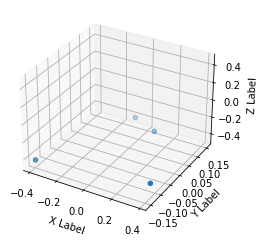

Time diff:  266.0
Footstep timestamp:  1454267.0
Height check index:  1148
Height check timestamp:  1454366.0

FL moving: 0.08064500000000002. FR moving: 0.012273999999999952
RL moving: 0.011907000000000001. RR moving: 0.07968699999999995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385406. FR later: -0.39768
RR moving: -0.396264. RL moving: -0.315619

Coord FR: [0.384, -0.113, -0.385]. Coord FL: [0.105, 0.11, -0.396]. Coord RR: [-0.39, -0.153, -0.416]. Coord RL: [-0.099, 0.152, -0.407]

FR step_size: 0.555798. FL step_size: 0. RR step size: 0. RL step_size: 0.5632490000000001.


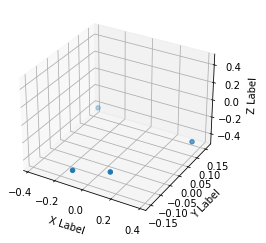

Time diff:  269.0
Footstep timestamp:  1454533.0
Height check index:  1281
Height check timestamp:  1454633.0

FL moving: 0.010577999999999976. FR moving: 0.08037
RL moving: 0.07486599999999999. RR moving: 0.009944000000000008

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39424. FR later: -0.31387
RR moving: -0.385062. RL moving: -0.39564

Coord FR: [0.108, -0.114, -0.394]. Coord FL: [0.384, 0.114, -0.385]. Coord RR: [-0.104, -0.153, -0.399]. Coord RL: [-0.376, 0.158, -0.42]

FR step_size: 0.554532. FL step_size: 0. RR step size: 0. RL step_size: 0.567659.


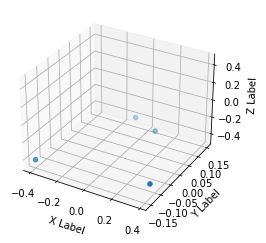

Time diff:  265.0
Footstep timestamp:  1454802.0
Height check index:  1415
Height check timestamp:  1454902.0

FL moving: 0.08346100000000001. FR moving: 0.009421000000000013
RL moving: 0.012838000000000016. RR moving: 0.08465499999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38777. FR later: -0.397191
RR moving: -0.397326. RL moving: -0.313865

Coord FR: [0.384, -0.115, -0.388]. Coord FL: [0.105, 0.111, -0.397]. Coord RR: [-0.395, -0.153, -0.413]. Coord RL: [-0.099, 0.15, -0.407]

FR step_size: 0.5551889999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.5655699999999999.


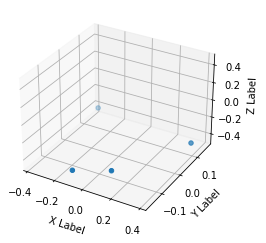

Time diff:  269.0
Footstep timestamp:  1455067.0
Height check index:  1547
Height check timestamp:  1455167.0

FL moving: 0.00998300000000002. FR moving: 0.08143599999999995
RL moving: 0.07991900000000002. RR moving: 0.009894999999999987

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394962. FR later: -0.313526
RR moving: -0.38781. RL moving: -0.397793

Coord FR: [0.107, -0.115, -0.395]. Coord FL: [0.383, 0.106, -0.388]. Coord RR: [-0.104, -0.162, -0.399]. Coord RL: [-0.373, 0.157, -0.421]

FR step_size: 0.551802. FL step_size: 0. RR step size: 0. RL step_size: 0.550643.


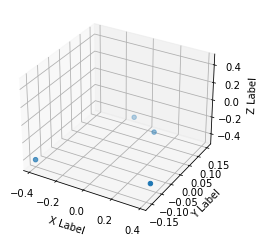

Time diff:  263.0
Footstep timestamp:  1455336.0
Height check index:  1681
Height check timestamp:  1455436.0

FL moving: 0.08473799999999998. FR moving: 0.010485999999999995
RL moving: 0.010477000000000014. RR moving: 0.08631699999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389055. FR later: -0.399541
RR moving: -0.398429. RL moving: -0.313691

Coord FR: [0.383, -0.117, -0.389]. Coord FL: [0.107, 0.105, -0.398]. Coord RR: [-0.387, -0.158, -0.413]. Coord RL: [-0.106, 0.15, -0.408]

FR step_size: 0.547423. FL step_size: 0. RR step size: 0. RL step_size: 0.5617160000000001.


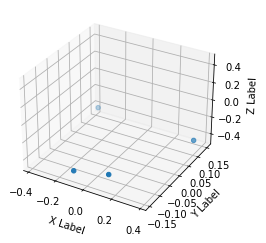

Time diff:  271.0
Footstep timestamp:  1455599.0
Height check index:  1812
Height check timestamp:  1455699.0

FL moving: 0.00812099999999999. FR moving: 0.08067200000000002
RL moving: 0.07761499999999999. RR moving: 0.010619000000000045

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395432. FR later: -0.31476
RR moving: -0.388201. RL moving: -0.396322

Coord FR: [0.11, -0.121, -0.395]. Coord FL: [0.381, 0.117, -0.388]. Coord RR: [-0.1, -0.147, -0.4]. Coord RL: [-0.381, 0.15, -0.418]

FR step_size: 0.549976. FL step_size: 0. RR step size: 0. RL step_size: 0.564973.


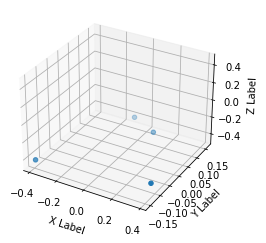

Time diff:  261.0
Footstep timestamp:  1455870.0
Height check index:  1947
Height check timestamp:  1455970.0

FL moving: 0.085926. FR moving: 0.008193999999999979
RL moving: 0.012450000000000017. RR moving: 0.08775000000000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392261. FR later: -0.400455
RR moving: -0.397043. RL moving: -0.311117

Coord FR: [0.382, -0.107, -0.392]. Coord FL: [0.103, 0.111, -0.397]. Coord RR: [-0.388, -0.151, -0.415]. Coord RL: [-0.104, 0.158, -0.407]

FR step_size: 0.554612. FL step_size: 0. RR step size: 0. RL step_size: 0.5564378000000001.


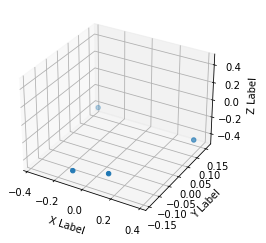

Time diff:  271.0
Footstep timestamp:  1456131.0
Height check index:  2077
Height check timestamp:  1456231.0

FL moving: 0.009465000000000001. FR moving: 0.07880399999999999
RL moving: 0.07743900000000004. RR moving: 0.011016999999999999

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396387. FR later: -0.317583
RR moving: -0.383626. RL moving: -0.393091

Coord FR: [0.109, -0.115, -0.396]. Coord FL: [0.384, 0.123, -0.384]. Coord RR: [-0.1, -0.145, -0.402]. Coord RL: [-0.372, 0.156, -0.417]

FR step_size: 0.551318. FL step_size: 0. RR step size: 0. RL step_size: 0.5582699999999999.


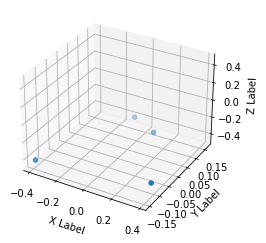

Time diff:  263.0
Footstep timestamp:  1456402.0
Height check index:  2212
Height check timestamp:  1456502.0

FL moving: 0.08448. FR moving: 0.00937300000000002
RL moving: 0.013330000000000009. RR moving: 0.08602000000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.391459. FR later: -0.400832
RR moving: -0.396237. RL moving: -0.311757

Coord FR: [0.384, -0.102, -0.391]. Coord FL: [0.108, 0.114, -0.396]. Coord RR: [-0.388, -0.147, -0.417]. Coord RL: [-0.102, 0.162, -0.405]

FR step_size: 0.547391. FL step_size: 0. RR step size: 0. RL step_size: 0.557269.


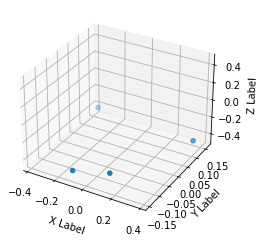

Time diff:  271.0
Footstep timestamp:  1456665.0
Height check index:  2343
Height check timestamp:  1456765.0

FL moving: 0.01058899999999996. FR moving: 0.08260700000000004
RL moving: 0.07656000000000002. RR moving: 0.006698999999999955

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396614. FR later: -0.314007
RR moving: -0.386228. RL moving: -0.396817

Coord FR: [0.11, -0.112, -0.397]. Coord FL: [0.382, 0.121, -0.386]. Coord RR: [-0.103, -0.146, -0.401]. Coord RL: [-0.374, 0.158, -0.416]

FR step_size: 0.552435. FL step_size: 0. RR step size: 0. RL step_size: 0.56518.


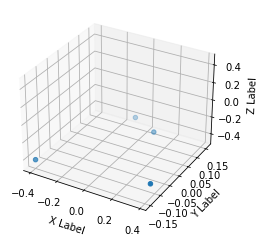

Time diff:  263.0
Footstep timestamp:  1456936.0
Height check index:  2477
Height check timestamp:  1457035.0

FL moving: 0.08399699999999999. FR moving: 0.007666000000000006
RL moving: 0.013537000000000021. RR moving: 0.086362

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392214. FR later: -0.39988
RR moving: -0.398179. RL moving: -0.314182

Coord FR: [0.383, -0.11, -0.392]. Coord FL: [0.102, 0.111, -0.398]. Coord RR: [-0.396, -0.151, -0.413]. Coord RL: [-0.102, 0.156, -0.407]

FR step_size: 0.55491. FL step_size: 0. RR step size: 0. RL step_size: 0.564181.


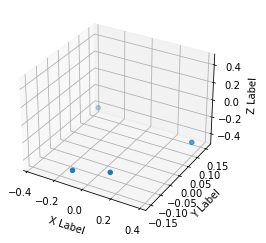

Time diff:  269.0
Footstep timestamp:  1457199.0
Height check index:  2608
Height check timestamp:  1457298.0

FL moving: 0.009236999999999995. FR moving: 0.07983000000000001
RL moving: 0.07935500000000001. RR moving: 0.009429999999999994

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396172. FR later: -0.316342
RR moving: -0.388564. RL moving: -0.397801

Coord FR: [0.11, -0.115, -0.396]. Coord FL: [0.384, 0.111, -0.389]. Coord RR: [-0.102, -0.153, -0.399]. Coord RL: [-0.372, 0.156, -0.419]

FR step_size: 0.548212. FL step_size: 0. RR step size: 0. RL step_size: 0.552763.


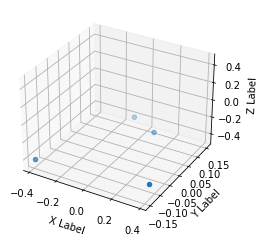

Time diff:  263.0
Footstep timestamp:  1457468.0
Height check index:  2742
Height check timestamp:  1457567.0

FL moving: 0.08352100000000001. FR moving: 0.009556999999999982
RL moving: 0.011809000000000014. RR moving: 0.08407399999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390216. FR later: -0.399773
RR moving: -0.398445. RL moving: -0.314924

Coord FR: [0.383, -0.114, -0.39]. Coord FL: [0.109, 0.107, -0.398]. Coord RR: [-0.387, -0.15, -0.412]. Coord RL: [-0.104, 0.153, -0.407]

FR step_size: 0.545079. FL step_size: 0. RR step size: 0. RL step_size: 0.555698.


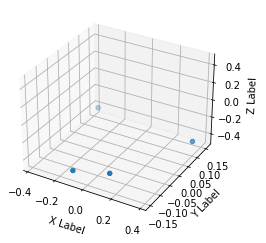

Time diff:  7876.0


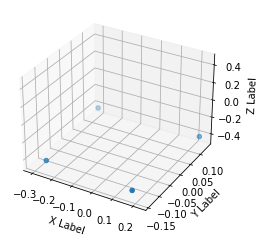

Time diff:  257.0
Footstep timestamp:  1465607.0
Height check index:  3072
Height check timestamp:  1465707.0

FL moving: 0.09183400000000003. FR moving: 0.0005950000000000122
RL moving: 0.0010789999999999966. RR moving: 0.09371499999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.410832. FR later: -0.411427
RR moving: -0.410625. RL moving: -0.318791

Coord FR: [0.174, -0.141, -0.411]. Coord FL: [0.222, 0.133, -0.411]. Coord RR: [-0.263, -0.132, -0.413]. Coord RL: [-0.307, 0.134, -0.421]

FR step_size: 0.1344207. FL step_size: 0. RR step size: 0. RL step_size: 0.15581400000000004.


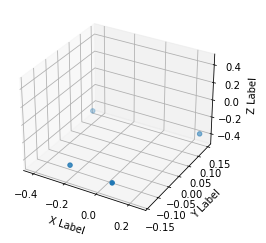

Time diff:  539.0


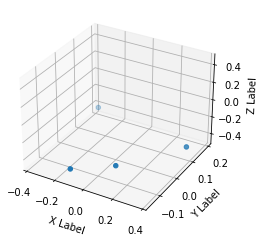

Time diff:  265.0
Footstep timestamp:  1466403.0
Height check index:  3469
Height check timestamp:  1466503.0

FL moving: 0.01451199999999997. FR moving: 0.08078400000000002
RL moving: 0.07487200000000005. RR moving: 0.011654999999999971

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390567. FR later: -0.309783
RR moving: -0.379568. RL moving: -0.39408

Coord FR: [0.096, -0.078, -0.391]. Coord FL: [0.369, 0.106, -0.38]. Coord RR: [-0.122, -0.155, -0.394]. Coord RL: [-0.369, 0.192, -0.418]

FR step_size: 0.541838. FL step_size: 0. RR step size: 0. RL step_size: 0.5437327000000001.


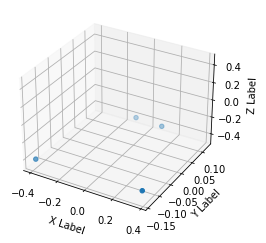

Time diff:  269.0
Footstep timestamp:  1466668.0
Height check index:  3601
Height check timestamp:  1466768.0

FL moving: 0.07991200000000004. FR moving: 0.015325000000000033
RL moving: 0.012809000000000015. RR moving: 0.07445600000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.377638. FR later: -0.392963
RR moving: -0.39595. RL moving: -0.316038

Coord FR: [0.377, -0.14, -0.378]. Coord FL: [0.109, 0.114, -0.396]. Coord RR: [-0.397, -0.139, -0.409]. Coord RL: [-0.1, 0.122, -0.406]

FR step_size: 0.552743. FL step_size: 0. RR step size: 0. RL step_size: 0.5701559999999999.


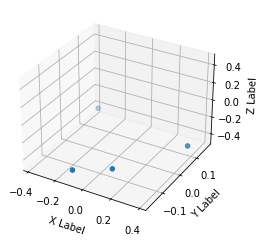

Time diff:  267.0
Footstep timestamp:  1466937.0
Height check index:  3734
Height check timestamp:  1467036.0

FL moving: 0.013398000000000021. FR moving: 0.07872799999999996
RL moving: 0.07495400000000002. RR moving: 0.011478999999999961

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.391526. FR later: -0.312798
RR moving: -0.381644. RL moving: -0.395042

Coord FR: [0.102, -0.111, -0.392]. Coord FL: [0.386, 0.09, -0.382]. Coord RR: [-0.106, -0.168, -0.396]. Coord RL: [-0.379, 0.164, -0.424]

FR step_size: 0.564466. FL step_size: 0. RR step size: 0. RL step_size: 0.5757447.


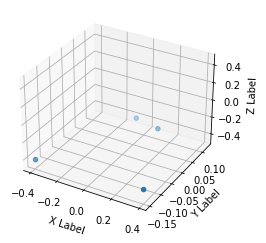

Time diff:  265.0
Footstep timestamp:  1467204.0
Height check index:  3867
Height check timestamp:  1467303.0

FL moving: 0.08180699999999996. FR moving: 0.014284999999999992
RL moving: 0.011116000000000015. RR moving: 0.07794000000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.379794. FR later: -0.394079
RR moving: -0.397887. RL moving: -0.31608

Coord FR: [0.388, -0.142, -0.38]. Coord FL: [0.108, 0.101, -0.398]. Coord RR: [-0.397, -0.148, -0.412]. Coord RL: [-0.094, 0.123, -0.411]

FR step_size: 0.5569649999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.576365.


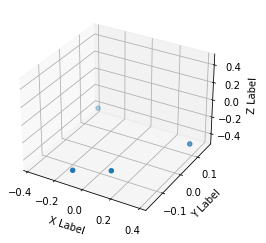

Time diff:  267.0
Footstep timestamp:  1467469.0
Height check index:  3999
Height check timestamp:  1467568.0

FL moving: 0.010527999999999982. FR moving: 0.077013
RL moving: 0.07110700000000003. RR moving: 0.010448999999999986

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.392177. FR later: -0.315164
RR moving: -0.383513. RL moving: -0.394041

Coord FR: [0.109, -0.12, -0.392]. Coord FL: [0.386, 0.097, -0.384]. Coord RR: [-0.102, -0.166, -0.398]. Coord RL: [-0.375, 0.156, -0.424]

FR step_size: 0.5608500000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5717574000000001.


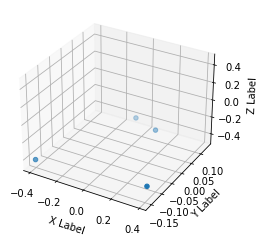

Time diff:  267.0
Footstep timestamp:  1467736.0
Height check index:  4132
Height check timestamp:  1467835.0

FL moving: 0.08003699999999997. FR moving: 0.01403099999999996
RL moving: 0.012436000000000003. RR moving: 0.07638299999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.380993. FR later: -0.395024
RR moving: -0.398066. RL moving: -0.318029

Coord FR: [0.388, -0.133, -0.381]. Coord FL: [0.104, 0.101, -0.398]. Coord RR: [-0.393, -0.155, -0.412]. Coord RL: [-0.094, 0.133, -0.41]

FR step_size: 0.560296. FL step_size: 0. RR step size: 0. RL step_size: 0.568003.


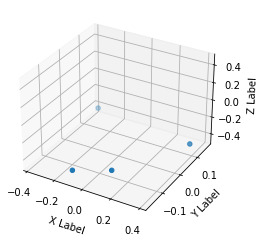

Time diff:  267.0
Footstep timestamp:  1468003.0
Height check index:  4265
Height check timestamp:  1468102.0

FL moving: 0.010007000000000044. FR moving: 0.079206
RL moving: 0.073739. RR moving: 0.010066999999999993

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393183. FR later: -0.313977
RR moving: -0.384663. RL moving: -0.39467

Coord FR: [0.109, -0.117, -0.393]. Coord FL: [0.385, 0.099, -0.385]. Coord RR: [-0.102, -0.166, -0.399]. Coord RL: [-0.371, 0.158, -0.423]

FR step_size: 0.549437. FL step_size: 0. RR step size: 0. RL step_size: 0.557486.


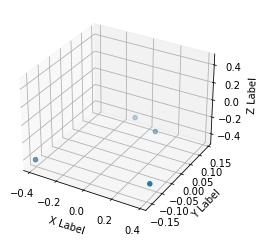

Time diff:  264.0
Footstep timestamp:  1468270.0
Height check index:  4398
Height check timestamp:  1468369.0

FL moving: 0.080949. FR moving: 0.011216000000000004
RL moving: 0.011656999999999973. RR moving: 0.07871300000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.384826. FR later: -0.396042
RR moving: -0.397173. RL moving: -0.316224

Coord FR: [0.383, -0.122, -0.385]. Coord FL: [0.11, 0.102, -0.397]. Coord RR: [-0.389, -0.159, -0.413]. Coord RL: [-0.1, 0.142, -0.409]

FR step_size: 0.549099. FL step_size: 0. RR step size: 0. RL step_size: 0.5636749000000001.


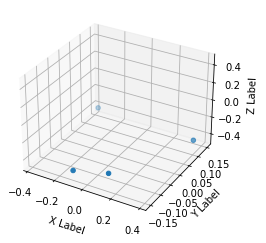

Time diff:  271.0
Footstep timestamp:  1468534.0
Height check index:  4530
Height check timestamp:  1468634.0

FL moving: 0.010331000000000035. FR moving: 0.077623
RL moving: 0.07448700000000003. RR moving: 0.011068000000000022

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393294. FR later: -0.315671
RR moving: -0.383175. RL moving: -0.393506

Coord FR: [0.109, -0.122, -0.393]. Coord FL: [0.385, 0.114, -0.383]. Coord RR: [-0.098, -0.152, -0.399]. Coord RL: [-0.373, 0.149, -0.42]

FR step_size: 0.557057. FL step_size: 0. RR step size: 0. RL step_size: 0.5651349999999999.


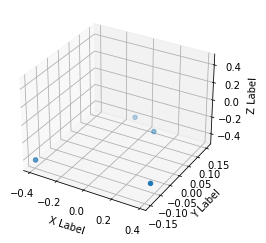

Time diff:  263.0
Footstep timestamp:  1468805.0
Height check index:  4665
Height check timestamp:  1468905.0

FL moving: 0.085013. FR moving: 0.009547000000000028
RL moving: 0.013741000000000003. RR moving: 0.084505

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388377. FR later: -0.397924
RR moving: -0.39555. RL moving: -0.310537

Coord FR: [0.385, -0.11, -0.388]. Coord FL: [0.103, 0.11, -0.396]. Coord RR: [-0.391, -0.151, -0.416]. Coord RL: [-0.101, 0.153, -0.406]

FR step_size: 0.5579160000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5647394.


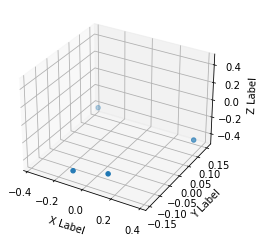

Time diff:  269.0
Footstep timestamp:  1469068.0
Height check index:  4796
Height check timestamp:  1469168.0

FL moving: 0.009398000000000017. FR moving: 0.079984
RL moving: 0.07292199999999999. RR moving: 0.00994299999999998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395342. FR later: -0.315358
RR moving: -0.384274. RL moving: -0.393672

Coord FR: [0.107, -0.119, -0.395]. Coord FL: [0.383, 0.118, -0.384]. Coord RR: [-0.099, -0.147, -0.402]. Coord RL: [-0.373, 0.151, -0.418]

FR step_size: 0.552732. FL step_size: 0. RR step size: 0. RL step_size: 0.559104.


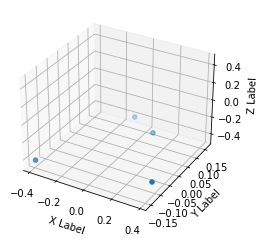

Time diff:  263.0
Footstep timestamp:  1469337.0
Height check index:  4930
Height check timestamp:  1469437.0

FL moving: 0.08153200000000005. FR moving: 0.011276999999999981
RL moving: 0.014077000000000006. RR moving: 0.082515

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389038. FR later: -0.400315
RR moving: -0.394759. RL moving: -0.313227

Coord FR: [0.383, -0.103, -0.389]. Coord FL: [0.106, 0.109, -0.395]. Coord RR: [-0.388, -0.153, -0.418]. Coord RL: [-0.102, 0.161, -0.403]

FR step_size: 0.554735. FL step_size: 0. RR step size: 0. RL step_size: 0.5619905000000001.


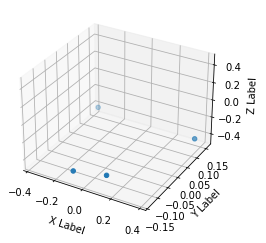

Time diff:  273.0
Footstep timestamp:  1469600.0
Height check index:  5061
Height check timestamp:  1469700.0

FL moving: 0.010838000000000014. FR moving: 0.07804299999999997
RL moving: 0.07276600000000005. RR moving: 0.009678999999999993

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397508. FR later: -0.319465
RR moving: -0.381361. RL moving: -0.392199

Coord FR: [0.107, -0.115, -0.398]. Coord FL: [0.385, 0.128, -0.381]. Coord RR: [-0.097, -0.136, -0.404]. Coord RL: [-0.373, 0.155, -0.414]

FR step_size: 0.5555760000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5605119999999999.


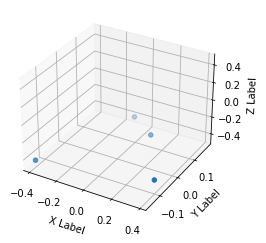

Time diff:  261.0
Footstep timestamp:  1469873.0
Height check index:  5197
Height check timestamp:  1469973.0

FL moving: 0.08590999999999999. FR moving: 0.010178999999999994
RL moving: 0.014216000000000006. RR moving: 0.08748799999999995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392664. FR later: -0.402843
RR moving: -0.395729. RL moving: -0.309819

Coord FR: [0.383, -0.088, -0.393]. Coord FL: [0.106, 0.108, -0.396]. Coord RR: [-0.389, -0.153, -0.419]. Coord RL: [-0.105, 0.175, -0.403]

FR step_size: 0.546311. FL step_size: 0. RR step size: 0. RL step_size: 0.5540240000000001.


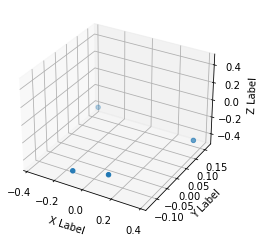

Time diff:  273.0
Footstep timestamp:  1470134.0
Height check index:  5327
Height check timestamp:  1470234.0

FL moving: 0.007877000000000023. FR moving: 0.081152
RL moving: 0.07303699999999996. RR moving: 0.008135000000000003

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398806. FR later: -0.317654
RR moving: -0.384688. RL moving: -0.392565

Coord FR: [0.111, -0.106, -0.399]. Coord FL: [0.38, 0.127, -0.385]. Coord RR: [-0.101, -0.132, -0.404]. Coord RL: [-0.371, 0.161, -0.413]

FR step_size: 0.54701. FL step_size: 0. RR step size: 0. RL step_size: 0.552313.


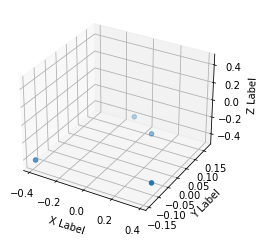

Time diff:  261.0
Footstep timestamp:  1470407.0
Height check index:  5463
Height check timestamp:  1470507.0

FL moving: 0.08698. FR moving: 0.00973099999999999
RL moving: 0.015291999999999972. RR moving: 0.090053

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394007. FR later: -0.403738
RR moving: -0.395388. RL moving: -0.308408

Coord FR: [0.382, -0.096, -0.394]. Coord FL: [0.104, 0.11, -0.395]. Coord RR: [-0.388, -0.143, -0.417]. Coord RL: [-0.106, 0.168, -0.402]

FR step_size: 0.552169. FL step_size: 0. RR step size: 0. RL step_size: 0.5547540000000001.


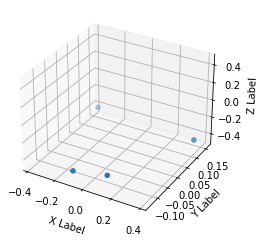

Time diff:  271.0
Footstep timestamp:  1470668.0
Height check index:  5593
Height check timestamp:  1470768.0

FL moving: 0.006938. FR moving: 0.08213399999999998
RL moving: 0.07753500000000002. RR moving: 0.009517999999999971

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.399146. FR later: -0.317012
RR moving: -0.385834. RL moving: -0.392772

Coord FR: [0.108, -0.113, -0.399]. Coord FL: [0.382, 0.125, -0.386]. Coord RR: [-0.1, -0.135, -0.404]. Coord RL: [-0.373, 0.156, -0.413]

FR step_size: 0.5525. FL step_size: 0. RR step size: 0. RL step_size: 0.55153.


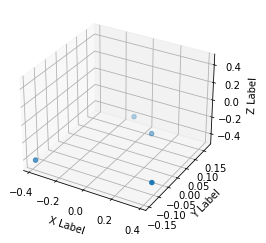

Time diff:  261.0
Footstep timestamp:  1470939.0
Height check index:  5727
Height check timestamp:  1471038.0

FL moving: 0.08421600000000001. FR moving: 0.01006499999999999
RL moving: 0.012282999999999988. RR moving: 0.08837599999999995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.393732. FR later: -0.403797
RR moving: -0.395334. RL moving: -0.311118

Coord FR: [0.382, -0.095, -0.394]. Coord FL: [0.104, 0.111, -0.395]. Coord RR: [-0.385, -0.144, -0.418]. Coord RL: [-0.106, 0.168, -0.402]

FR step_size: 0.552593. FL step_size: 0. RR step size: 0. RL step_size: 0.555188.


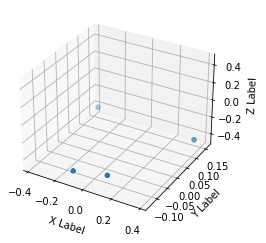

Time diff:  271.0
Footstep timestamp:  1471200.0
Height check index:  5857
Height check timestamp:  1471299.0

FL moving: 0.008274000000000004. FR moving: 0.07880199999999998
RL moving: 0.07436399999999999. RR moving: 0.009079999999999977

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.399349. FR later: -0.320547
RR moving: -0.384621. RL moving: -0.392895

Coord FR: [0.107, -0.11, -0.399]. Coord FL: [0.382, 0.127, -0.385]. Coord RR: [-0.101, -0.132, -0.403]. Coord RL: [-0.377, 0.157, -0.412]

FR step_size: 0.554555. FL step_size: 0. RR step size: 0. RL step_size: 0.559762.


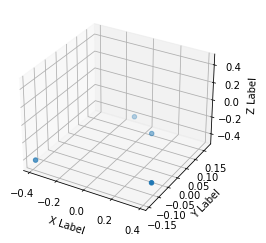

Time diff:  261.0
Footstep timestamp:  1471471.0
Height check index:  5992
Height check timestamp:  1471570.0

FL moving: 0.082785. FR moving: 0.009940000000000004
RL moving: 0.013884000000000007. RR moving: 0.085557

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392944. FR later: -0.402884
RR moving: -0.394828. RL moving: -0.312043

Coord FR: [0.383, -0.096, -0.393]. Coord FL: [0.103, 0.111, -0.395]. Coord RR: [-0.389, -0.143, -0.418]. Coord RL: [-0.105, 0.167, -0.401]

FR step_size: 0.555134. FL step_size: 0. RR step size: 0. RL step_size: 0.5580473.


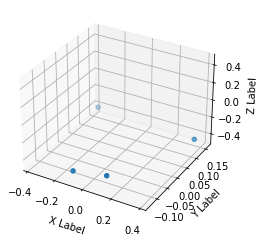

Time diff:  273.0
Footstep timestamp:  1471732.0
Height check index:  6122
Height check timestamp:  1471831.0

FL moving: 0.010355999999999976. FR moving: 0.07821800000000001
RL moving: 0.07086700000000001. RR moving: 0.008568999999999993

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398879. FR later: -0.320661
RR moving: -0.382402. RL moving: -0.392758

Coord FR: [0.108, -0.112, -0.399]. Coord FL: [0.383, 0.128, -0.382]. Coord RR: [-0.1, -0.132, -0.404]. Coord RL: [-0.374, 0.157, -0.412]

FR step_size: 0.556658. FL step_size: 0. RR step size: 0. RL step_size: 0.561195.


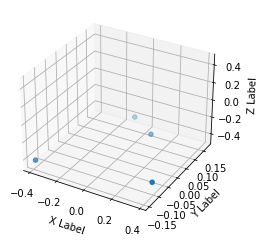

Time diff:  47492.0


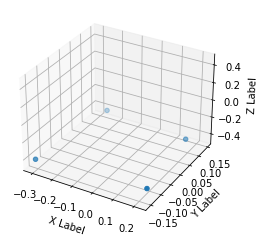

Time diff:  259.0
Footstep timestamp:  1519497.0
Height check index:  6444
Height check timestamp:  1519596.0

FL moving: 0.0007959999999999634. FR moving: 0.09212200000000004
RL moving: 0.08890399999999998. RR moving: 0.0006979999999999764

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.407073. FR later: -0.314951
RR moving: -0.410343. RL moving: -0.411139

Coord FR: [0.217, -0.13, -0.407]. Coord FL: [0.175, 0.116, -0.41]. Coord RR: [-0.308, -0.153, -0.408]. Coord RL: [-0.26, 0.146, -0.42]

FR step_size: 0.11045909999999998. FL step_size: 0. RR step size: 0. RL step_size: 0.14098500000000003.


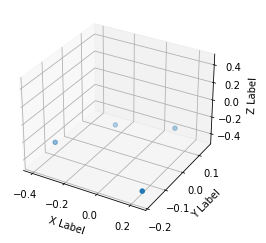

Time diff:  267.0
Footstep timestamp:  1519756.0
Height check index:  6573
Height check timestamp:  1519855.0

FL moving: 0.07525300000000001. FR moving: 0.0027530000000000054
RL moving: 0.0063349999999999795. RR moving: 0.07426899999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.382135. FR later: -0.384888
RR moving: -0.398067. RL moving: -0.322814

Coord FR: [0.243, -0.184, -0.382]. Coord FL: [0.09, 0.148, -0.398]. Coord RR: [-0.409, -0.085, -0.402]. Coord RL: [-0.22, 0.083, -0.407]

FR step_size: 0.4629867. FL step_size: 0. RR step size: 0. RL step_size: 0.484283.


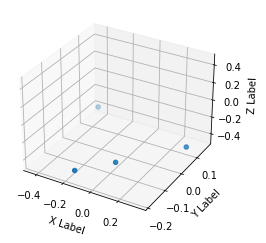

Time diff:  273.0
Footstep timestamp:  1520023.0
Height check index:  6706
Height check timestamp:  1520122.0

FL moving: 0.012745000000000006. FR moving: 0.07664399999999999
RL moving: 0.06675900000000001. RR moving: 0.005344999999999989

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.392088. FR later: -0.315444
RR moving: -0.379203. RL moving: -0.391948

Coord FR: [0.028, -0.092, -0.392]. Coord FL: [0.338, 0.078, -0.379]. Coord RR: [-0.147, -0.187, -0.393]. Coord RL: [-0.442, 0.165, -0.409]

FR step_size: 0.6109225. FL step_size: 0. RR step size: 0. RL step_size: 0.592105.


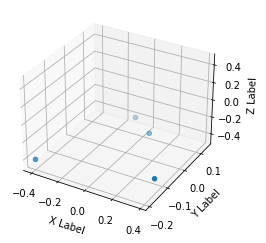

Time diff:  257.0
Footstep timestamp:  1520296.0
Height check index:  6842
Height check timestamp:  1520395.0

FL moving: 0.08427899999999999. FR moving: 0.015766000000000002
RL moving: 0.011936000000000002. RR moving: 0.08210099999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.381453. FR later: -0.397219
RR moving: -0.396022. RL moving: -0.311743

Coord FR: [0.38, -0.129, -0.381]. Coord FL: [0.079, 0.075, -0.396]. Coord RR: [-0.406, -0.196, -0.409]. Coord RL: [-0.109, 0.137, -0.407]

FR step_size: 0.5718719999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.5812158000000001.


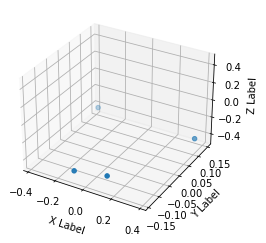

Time diff:  274.0
Footstep timestamp:  1520553.0
Height check index:  6970
Height check timestamp:  1520652.0

FL moving: 0.010477999999999987. FR moving: 0.07577700000000004
RL moving: 0.065807. RR moving: 0.012545999999999946

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394052. FR later: -0.318275
RR moving: -0.37872. RL moving: -0.389198

Coord FR: [0.112, -0.124, -0.394]. Coord FL: [0.383, 0.119, -0.379]. Coord RR: [-0.095, -0.142, -0.399]. Coord RL: [-0.379, 0.146, -0.417]

FR step_size: 0.553199. FL step_size: 0. RR step size: 0. RL step_size: 0.5724334.


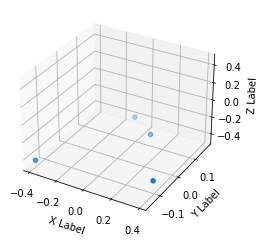

Time diff:  261.0
Footstep timestamp:  1520827.0
Height check index:  7107
Height check timestamp:  1520927.0

FL moving: 0.08393099999999998. FR moving: 0.011218999999999979
RL moving: 0.014058999999999988. RR moving: 0.08491599999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38826. FR later: -0.399479
RR moving: -0.394595. RL moving: -0.310664

Coord FR: [0.386, -0.095, -0.388]. Coord FL: [0.104, 0.105, -0.395]. Coord RR: [-0.388, -0.152, -0.42]. Coord RL: [-0.1, 0.169, -0.404]

FR step_size: 0.558578. FL step_size: 0. RR step size: 0. RL step_size: 0.5622408.


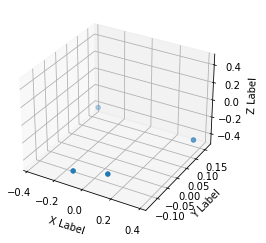

Time diff:  273.0
Footstep timestamp:  1521088.0
Height check index:  7237
Height check timestamp:  1521188.0

FL moving: 0.009659000000000029. FR moving: 0.080841
RL moving: 0.07095099999999999. RR moving: 0.007501999999999953

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396357. FR later: -0.315516
RR moving: -0.380559. RL moving: -0.390218

Coord FR: [0.107, -0.108, -0.396]. Coord FL: [0.383, 0.127, -0.381]. Coord RR: [-0.097, -0.135, -0.404]. Coord RL: [-0.371, 0.161, -0.416]

FR step_size: 0.5581389999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.56776.


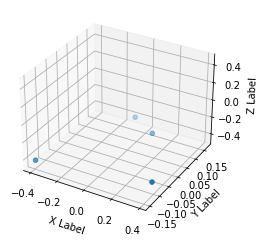

Time diff:  263.0
Footstep timestamp:  1521361.0
Height check index:  7373
Height check timestamp:  1521461.0

FL moving: 0.08524999999999999. FR moving: 0.01086999999999999
RL moving: 0.01375599999999999. RR moving: 0.08829500000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39048. FR later: -0.40135
RR moving: -0.394958. RL moving: -0.309708

Coord FR: [0.386, -0.098, -0.39]. Coord FL: [0.104, 0.111, -0.395]. Coord RR: [-0.397, -0.148, -0.419]. Coord RL: [-0.103, 0.166, -0.404]

FR step_size: 0.562162. FL step_size: 0. RR step size: 0. RL step_size: 0.5729.


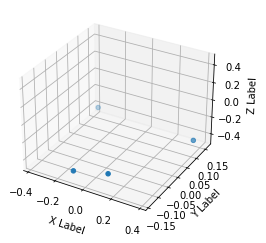

Time diff:  269.0
Footstep timestamp:  1521624.0
Height check index:  7504
Height check timestamp:  1521724.0

FL moving: 0.010122999999999993. FR moving: 0.08272800000000002
RL moving: 0.07658099999999995. RR moving: 0.007651999999999992

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39727. FR later: -0.314542
RR moving: -0.384469. RL moving: -0.394592

Coord FR: [0.104, -0.111, -0.397]. Coord FL: [0.384, 0.124, -0.384]. Coord RR: [-0.1, -0.14, -0.402]. Coord RL: [-0.379, 0.159, -0.416]

FR step_size: 0.561159. FL step_size: 0. RR step size: 0. RL step_size: 0.5728010000000001.


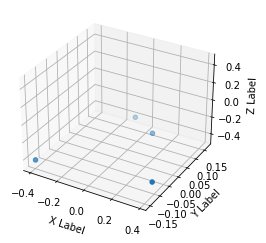

Time diff:  28019.0


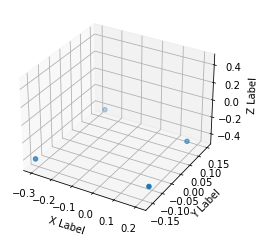

Time diff:  259.0
Footstep timestamp:  1549912.0
Height check index:  7784
Height check timestamp:  1550012.0

FL moving: 0.00023899999999998922. FR moving: 0.09272599999999998
RL moving: 0.089306. RR moving: 2.199999999996649e-05

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.405684. FR later: -0.312958
RR moving: -0.409576. RL moving: -0.409815

Coord FR: [0.21, -0.128, -0.406]. Coord FL: [0.182, 0.11, -0.41]. Coord RR: [-0.302, -0.162, -0.404]. Coord RL: [-0.266, 0.149, -0.418]

FR step_size: 0.1318407. FL step_size: 0. RR step size: 0. RL step_size: 0.16132200000000002.


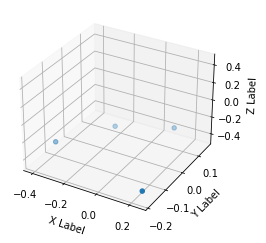

Time diff:  269.0
Footstep timestamp:  1550171.0
Height check index:  7913
Height check timestamp:  1550271.0

FL moving: 0.076019. FR moving: 0.0028859999999999997
RL moving: 0.008423999999999987. RR moving: 0.075023

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.382263. FR later: -0.385149
RR moving: -0.397179. RL moving: -0.32116

Coord FR: [0.249, -0.187, -0.382]. Coord FL: [0.089, 0.153, -0.397]. Coord RR: [-0.411, -0.083, -0.401]. Coord RL: [-0.213, 0.079, -0.406]

FR step_size: 0.4747942. FL step_size: 0. RR step size: 0. RL step_size: 0.499031.


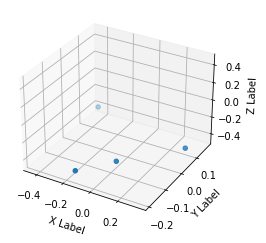

Time diff:  271.0
Footstep timestamp:  1550440.0
Height check index:  8047
Height check timestamp:  1550540.0

FL moving: 0.01119500000000001. FR moving: 0.08127400000000001
RL moving: 0.07334500000000005. RR moving: 0.00450600000000001

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.392627. FR later: -0.311353
RR moving: -0.380865. RL moving: -0.39206

Coord FR: [0.026, -0.089, -0.393]. Coord FL: [0.341, 0.073, -0.381]. Coord RR: [-0.143, -0.193, -0.394]. Coord RL: [-0.444, 0.169, -0.409]

FR step_size: 0.617105. FL step_size: 0. RR step size: 0. RL step_size: 0.592912.


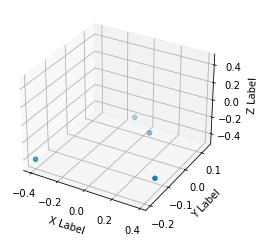

Time diff:  259.0
Footstep timestamp:  1550711.0
Height check index:  8182
Height check timestamp:  1550811.0

FL moving: 0.084615. FR moving: 0.016627000000000003
RL moving: 0.011504000000000014. RR moving: 0.085613

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.379754. FR later: -0.396381
RR moving: -0.396574. RL moving: -0.311959

Coord FR: [0.383, -0.131, -0.38]. Coord FL: [0.081, 0.073, -0.397]. Coord RR: [-0.401, -0.2, -0.408]. Coord RL: [-0.11, 0.132, -0.407]

FR step_size: 0.568997. FL step_size: 0. RR step size: 0. RL step_size: 0.5794628.


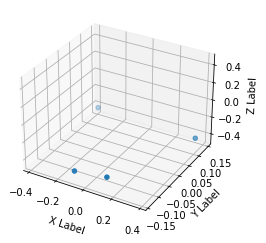

Time diff:  273.0
Footstep timestamp:  1550970.0
Height check index:  8311
Height check timestamp:  1551070.0

FL moving: 0.009279000000000037. FR moving: 0.078764
RL moving: 0.07480400000000004. RR moving: 0.010409000000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393996. FR later: -0.315232
RR moving: -0.381225. RL moving: -0.390504

Coord FR: [0.116, -0.126, -0.394]. Coord FL: [0.383, 0.12, -0.381]. Coord RR: [-0.096, -0.139, -0.4]. Coord RL: [-0.384, 0.143, -0.418]

FR step_size: 0.549335. FL step_size: 0. RR step size: 0. RL step_size: 0.576845.


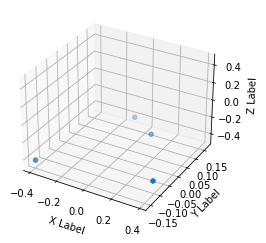

Time diff:  259.0
Footstep timestamp:  1551243.0
Height check index:  8446
Height check timestamp:  1551342.0

FL moving: 0.084594. FR moving: 0.010593999999999992
RL moving: 0.012658000000000003. RR moving: 0.083876

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38899. FR later: -0.399584
RR moving: -0.395976. RL moving: -0.311382

Coord FR: [0.386, -0.096, -0.389]. Coord FL: [0.104, 0.105, -0.396]. Coord RR: [-0.392, -0.152, -0.418]. Coord RL: [-0.103, 0.166, -0.405]

FR step_size: 0.5563670000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5658219.


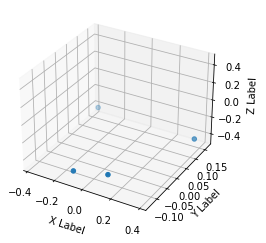

Time diff:  271.0
Footstep timestamp:  1551502.0
Height check index:  8575
Height check timestamp:  1551601.0

FL moving: 0.011453999999999964. FR moving: 0.07519399999999998
RL moving: 0.07078700000000004. RR moving: 0.009003999999999956

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396549. FR later: -0.321355
RR moving: -0.379404. RL moving: -0.390858

Coord FR: [0.111, -0.107, -0.397]. Coord FL: [0.385, 0.132, -0.379]. Coord RR: [-0.096, -0.132, -0.403]. Coord RL: [-0.373, 0.161, -0.416]

FR step_size: 0.551459. FL step_size: 0. RR step size: 0. RL step_size: 0.5637420000000001.


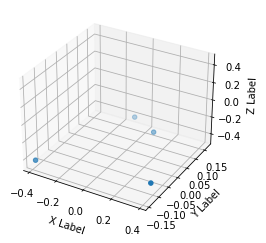

Time diff:  263.0
Footstep timestamp:  1551773.0
Height check index:  8710
Height check timestamp:  1551872.0

FL moving: 0.07872399999999996. FR moving: 0.010521000000000003
RL moving: 0.014853000000000005. RR moving: 0.08190199999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.387588. FR later: -0.398109
RR moving: -0.394192. RL moving: -0.315468

Coord FR: [0.385, -0.1, -0.388]. Coord FL: [0.108, 0.117, -0.394]. Coord RR: [-0.387, -0.143, -0.419]. Coord RL: [-0.101, 0.164, -0.404]

FR step_size: 0.555079. FL step_size: 0. RR step size: 0. RL step_size: 0.5597487.


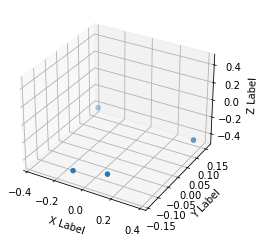

Time diff:  273.0
Footstep timestamp:  1552036.0
Height check index:  8841
Height check timestamp:  1552135.0

FL moving: 0.010531000000000013. FR moving: 0.07660499999999998
RL moving: 0.07389200000000001. RR moving: 0.00849500000000003

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394976. FR later: -0.318371
RR moving: -0.381741. RL moving: -0.392272

Coord FR: [0.105, -0.113, -0.395]. Coord FL: [0.383, 0.123, -0.382]. Coord RR: [-0.099, -0.139, -0.401]. Coord RL: [-0.373, 0.157, -0.418]

FR step_size: 0.5603530000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.564641.


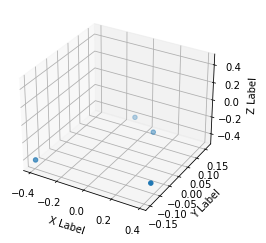

Time diff:  263.0
Footstep timestamp:  1552309.0
Height check index:  8977
Height check timestamp:  1552408.0

FL moving: 0.08249799999999996. FR moving: 0.011677999999999966
RL moving: 0.01282500000000003. RR moving: 0.08402100000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388363. FR later: -0.400041
RR moving: -0.396076. RL moving: -0.313578

Coord FR: [0.386, -0.106, -0.388]. Coord FL: [0.103, 0.112, -0.396]. Coord RR: [-0.394, -0.149, -0.416]. Coord RL: [-0.103, 0.159, -0.406]

FR step_size: 0.558495. FL step_size: 0. RR step size: 0. RL step_size: 0.5657840000000001.


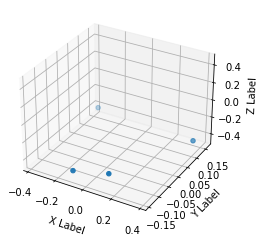

Time diff:  270.0
Footstep timestamp:  1552572.0
Height check index:  9108
Height check timestamp:  1552671.0

FL moving: 0.009036999999999962. FR moving: 0.08146800000000004
RL moving: 0.07937099999999997. RR moving: 0.007882999999999973

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395745. FR later: -0.314277
RR moving: -0.385074. RL moving: -0.394111

Coord FR: [0.108, -0.113, -0.396]. Coord FL: [0.383, 0.121, -0.385]. Coord RR: [-0.102, -0.143, -0.401]. Coord RL: [-0.377, 0.158, -0.418]

FR step_size: 0.556265. FL step_size: 0. RR step size: 0. RL step_size: 0.5673030000000001.


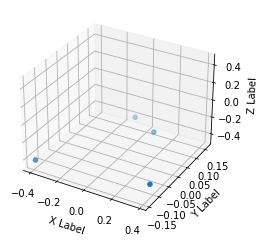

Time diff:  263.0
Footstep timestamp:  1552842.0
Height check index:  9243
Height check timestamp:  1552942.0

FL moving: 0.08370499999999997. FR moving: 0.01132099999999997
RL moving: 0.012862999999999958. RR moving: 0.08680099999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.391346. FR later: -0.402667
RR moving: -0.396759. RL moving: -0.313054

Coord FR: [0.385, -0.106, -0.391]. Coord FL: [0.104, 0.115, -0.397]. Coord RR: [-0.396, -0.144, -0.416]. Coord RL: [-0.103, 0.16, -0.405]

FR step_size: 0.558933. FL step_size: 0. RR step size: 0. RL step_size: 0.568133.


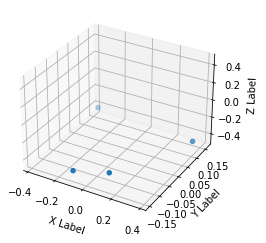

Time diff:  271.0
Footstep timestamp:  1553105.0
Height check index:  9374
Height check timestamp:  1553205.0

FL moving: 0.009479999999999988. FR moving: 0.082181
RL moving: 0.08133200000000002. RR moving: 0.007503000000000037

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397295. FR later: -0.315114
RR moving: -0.386839. RL moving: -0.396319

Coord FR: [0.105, -0.112, -0.397]. Coord FL: [0.383, 0.119, -0.387]. Coord RR: [-0.101, -0.147, -0.401]. Coord RL: [-0.376, 0.159, -0.417]

FR step_size: 0.556632. FL step_size: 0. RR step size: 0. RL step_size: 0.562363.


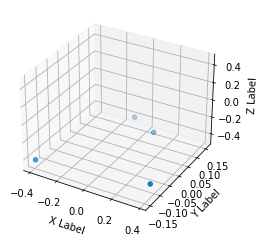

Time diff:  261.0
Footstep timestamp:  1553376.0
Height check index:  9509
Height check timestamp:  1553476.0

FL moving: 0.08588400000000002. FR moving: 0.01069500000000001
RL moving: 0.010384999999999978. RR moving: 0.08717000000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392209. FR later: -0.402904
RR moving: -0.39776. RL moving: -0.311876

Coord FR: [0.384, -0.11, -0.392]. Coord FL: [0.105, 0.11, -0.398]. Coord RR: [-0.392, -0.15, -0.414]. Coord RL: [-0.105, 0.157, -0.406]

FR step_size: 0.554079. FL step_size: 0. RR step size: 0. RL step_size: 0.5615730000000001.


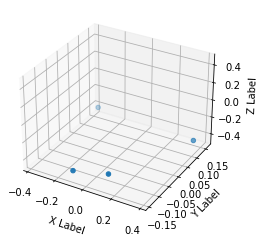

Time diff:  9763.0


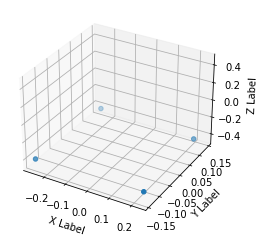

Time diff:  267.0
Footstep timestamp:  1563400.0
Height check index:  9781
Height check timestamp:  1563500.0

FL moving: 0.0007940000000000169. FR moving: 0.09471199999999996
RL moving: 0.09348300000000004. RR moving: 0.0025099999999999567

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.406585. FR later: -0.311873
RR moving: -0.412193. RL moving: -0.412987

Coord FR: [0.227, -0.135, -0.407]. Coord FL: [0.215, 0.123, -0.412]. Coord RR: [-0.263, -0.142, -0.405]. Coord RL: [-0.249, 0.14, -0.419]

FR step_size: 0.069132. FL step_size: 0. RR step size: 0. RL step_size: 0.07669299999999996.


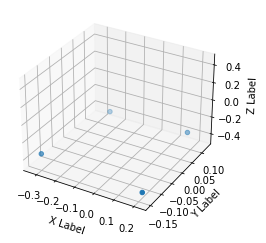

Time diff:  255.0
Footstep timestamp:  1563667.0
Height check index:  9914
Height check timestamp:  1563767.0

FL moving: 0.092839. FR moving: 0.0007269999999999777
RL moving: 0.0020749999999999935. RR moving: 0.090814

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.398101. FR later: -0.397374
RR moving: -0.405795. RL moving: -0.312956

Coord FR: [0.218, -0.151, -0.398]. Coord FL: [0.155, 0.127, -0.406]. Coord RR: [-0.33, -0.127, -0.401]. Coord RL: [-0.259, 0.123, -0.413]

FR step_size: 0.3113313. FL step_size: 0. RR step size: 0. RL step_size: 0.314519.


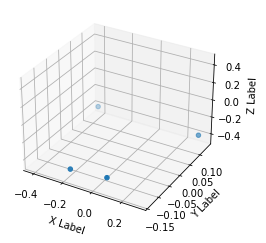

Time diff:  275.0
Footstep timestamp:  1563922.0
Height check index:  10041
Height check timestamp:  1564022.0

FL moving: 0.0030870000000000064. FR moving: 0.07496200000000003
RL moving: 0.071183. RR moving: 0.007095999999999991

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390612. FR later: -0.31565
RR moving: -0.382968. RL moving: -0.386055

Coord FR: [0.058, -0.127, -0.391]. Coord FL: [0.306, 0.13, -0.383]. Coord RR: [-0.175, -0.137, -0.393]. Coord RL: [-0.419, 0.136, -0.405]

FR step_size: 0.5639201. FL step_size: 0. RR step size: 0. RL step_size: 0.565868.


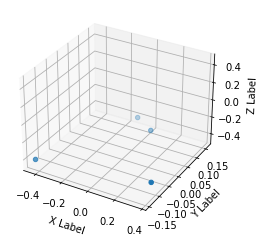

Time diff:  265.0
Footstep timestamp:  1564197.0
Height check index:  10178
Height check timestamp:  1564297.0

FL moving: 0.08074399999999998. FR moving: 0.012087000000000014
RL moving: 0.017572000000000032. RR moving: 0.08276300000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385026. FR later: -0.397113
RR moving: -0.393422. RL moving: -0.312678

Coord FR: [0.369, -0.101, -0.385]. Coord FL: [0.053, 0.114, -0.393]. Coord RR: [-0.436, -0.145, -0.411]. Coord RL: [-0.114, 0.157, -0.4]

FR step_size: 0.595962. FL step_size: 0. RR step size: 0. RL step_size: 0.588493.


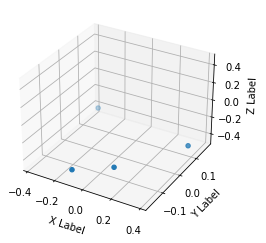

Time diff:  269.0
Footstep timestamp:  1564462.0
Height check index:  10310
Height check timestamp:  1564562.0

FL moving: 0.01109300000000002. FR moving: 0.08195100000000005
RL moving: 0.08179200000000003. RR moving: 0.011021000000000003

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.391929. FR later: -0.309978
RR moving: -0.385644. RL moving: -0.396737

Coord FR: [0.101, -0.103, -0.392]. Coord FL: [0.381, 0.095, -0.386]. Coord RR: [-0.108, -0.17, -0.394]. Coord RL: [-0.374, 0.167, -0.422]

FR step_size: 0.555123. FL step_size: 0. RR step size: 0. RL step_size: 0.549911.


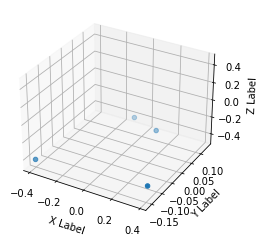

Time diff:  263.0
Footstep timestamp:  1564731.0
Height check index:  10444
Height check timestamp:  1564831.0

FL moving: 0.08494999999999997. FR moving: 0.014117000000000046
RL moving: 0.009252999999999956. RR moving: 0.083735

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.383582. FR later: -0.397699
RR moving: -0.399149. RL moving: -0.314199

Coord FR: [0.383, -0.132, -0.384]. Coord FL: [0.108, 0.1, -0.399]. Coord RR: [-0.39, -0.157, -0.41]. Coord RL: [-0.106, 0.133, -0.411]

FR step_size: 0.550703. FL step_size: 0. RR step size: 0. RL step_size: 0.563955.


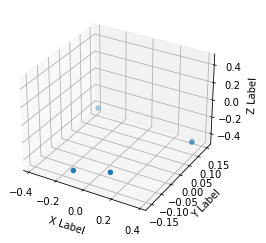

Time diff:  267.0
Footstep timestamp:  1564994.0
Height check index:  10574
Height check timestamp:  1565093.0

FL moving: 0.00794499999999998. FR moving: 0.07863999999999999
RL moving: 0.08128100000000005. RR moving: 0.009436

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39346. FR later: -0.31482
RR moving: -0.386925. RL moving: -0.39487

Coord FR: [0.107, -0.12, -0.393]. Coord FL: [0.383, 0.106, -0.387]. Coord RR: [-0.104, -0.157, -0.398]. Coord RL: [-0.384, 0.15, -0.422]

FR step_size: 0.5589790000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5759979.


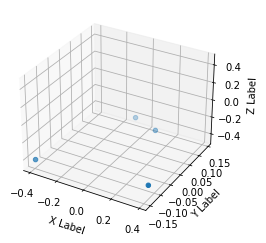

Time diff:  265.0
Footstep timestamp:  1565261.0
Height check index:  10707
Height check timestamp:  1565360.0

FL moving: 0.08020499999999997. FR moving: 0.013492999999999977
RL moving: 0.010658. RR moving: 0.08044200000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.384759. FR later: -0.398252
RR moving: -0.397703. RL moving: -0.317498

Coord FR: [0.388, -0.121, -0.385]. Coord FL: [0.105, 0.109, -0.398]. Coord RR: [-0.393, -0.15, -0.412]. Coord RL: [-0.097, 0.143, -0.408]

FR step_size: 0.559329. FL step_size: 0. RR step size: 0. RL step_size: 0.572275.


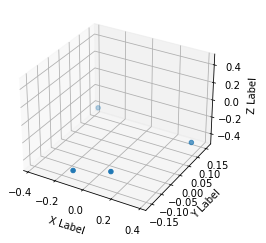

Time diff:  269.0
Footstep timestamp:  1565526.0
Height check index:  10839
Height check timestamp:  1565625.0

FL moving: 0.007900999999999991. FR moving: 0.07982999999999996
RL moving: 0.08141100000000001. RR moving: 0.010377999999999998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394765. FR later: -0.314935
RR moving: -0.386231. RL moving: -0.394132

Coord FR: [0.107, -0.116, -0.395]. Coord FL: [0.383, 0.107, -0.386]. Coord RR: [-0.102, -0.158, -0.399]. Coord RL: [-0.378, 0.155, -0.42]

FR step_size: 0.5543960000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.563086.


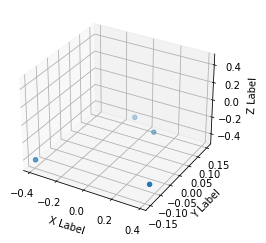

Time diff:  263.0
Footstep timestamp:  1565795.0
Height check index:  10973
Height check timestamp:  1565894.0

FL moving: 0.08325900000000003. FR moving: 0.010842000000000018
RL moving: 0.010023000000000004. RR moving: 0.08420500000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38816. FR later: -0.399002
RR moving: -0.396612. RL moving: -0.313353

Coord FR: [0.383, -0.115, -0.388]. Coord FL: [0.105, 0.106, -0.397]. Coord RR: [-0.39, -0.151, -0.414]. Coord RL: [-0.103, 0.151, -0.407]

FR step_size: 0.554894. FL step_size: 0. RR step size: 0. RL step_size: 0.5691930000000001.


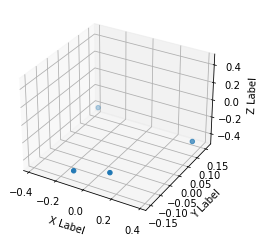

Time diff:  273.0
Footstep timestamp:  1566058.0
Height check index:  11104
Height check timestamp:  1566157.0

FL moving: 0.010277000000000036. FR moving: 0.07694099999999998
RL moving: 0.07437500000000002. RR moving: 0.010751999999999984

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395343. FR later: -0.318402
RR moving: -0.384634. RL moving: -0.394911

Coord FR: [0.106, -0.116, -0.395]. Coord FL: [0.383, 0.115, -0.385]. Coord RR: [-0.101, -0.152, -0.4]. Coord RL: [-0.383, 0.157, -0.418]

FR step_size: 0.556805. FL step_size: 0. RR step size: 0. RL step_size: 0.5679.


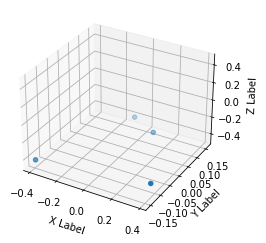

Time diff:  262.0
Footstep timestamp:  1566331.0
Height check index:  11240
Height check timestamp:  1566430.0

FL moving: 0.08447200000000005. FR moving: 0.011290999999999995
RL moving: 0.010171000000000041. RR moving: 0.085503

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.391604. FR later: -0.402895
RR moving: -0.396639. RL moving: -0.312167

Coord FR: [0.384, -0.109, -0.392]. Coord FL: [0.104, 0.109, -0.397]. Coord RR: [-0.39, -0.152, -0.415]. Coord RL: [-0.104, 0.157, -0.405]

FR step_size: 0.557069. FL step_size: 0. RR step size: 0. RL step_size: 0.5650570000000001.


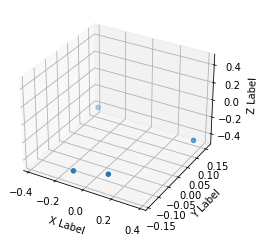

Time diff:  271.0
Footstep timestamp:  1566593.0
Height check index:  11371
Height check timestamp:  1566693.0

FL moving: 0.00869700000000001. FR moving: 0.08080999999999999
RL moving: 0.077824. RR moving: 0.00925400000000004

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398081. FR later: -0.317271
RR moving: -0.386276. RL moving: -0.394973

Coord FR: [0.106, -0.113, -0.398]. Coord FL: [0.383, 0.123, -0.386]. Coord RR: [-0.101, -0.141, -0.402]. Coord RL: [-0.38, 0.157, -0.414]

FR step_size: 0.55305. FL step_size: 0. RR step size: 0. RL step_size: 0.562181.


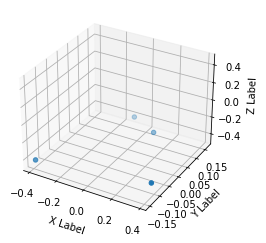

Time diff:  261.0
Footstep timestamp:  1566864.0
Height check index:  11506
Height check timestamp:  1566964.0

FL moving: 0.08615800000000001. FR moving: 0.009324999999999972
RL moving: 0.012224000000000013. RR moving: 0.08779000000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.393357. FR later: -0.402682
RR moving: -0.396472. RL moving: -0.310314

Coord FR: [0.383, -0.102, -0.393]. Coord FL: [0.107, 0.113, -0.396]. Coord RR: [-0.388, -0.148, -0.416]. Coord RL: [-0.105, 0.161, -0.404]

FR step_size: 0.549415. FL step_size: 0. RR step size: 0. RL step_size: 0.557053.


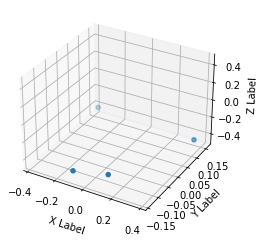

Time diff:  273.0
Footstep timestamp:  1567125.0
Height check index:  11636
Height check timestamp:  1567225.0

FL moving: 0.009519. FR moving: 0.07970300000000002
RL moving: 0.07789200000000002. RR moving: 0.008417000000000008

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398243. FR later: -0.31854
RR moving: -0.385135. RL moving: -0.394654

Coord FR: [0.109, -0.113, -0.398]. Coord FL: [0.382, 0.125, -0.385]. Coord RR: [-0.101, -0.139, -0.403]. Coord RL: [-0.375, 0.156, -0.415]

FR step_size: 0.5493790000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.553053.


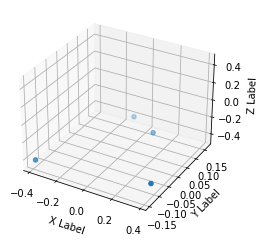

Time diff:  259.0
Footstep timestamp:  1567398.0
Height check index:  11772
Height check timestamp:  1567498.0

FL moving: 0.08751899999999996. FR moving: 0.00824999999999998
RL moving: 0.011928999999999967. RR moving: 0.08858300000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394643. FR later: -0.402893
RR moving: -0.396211. RL moving: -0.308692

Coord FR: [0.381, -0.102, -0.395]. Coord FL: [0.105, 0.113, -0.396]. Coord RR: [-0.387, -0.146, -0.416]. Coord RL: [-0.108, 0.163, -0.403]

FR step_size: 0.550961. FL step_size: 0. RR step size: 0. RL step_size: 0.5563424000000001.


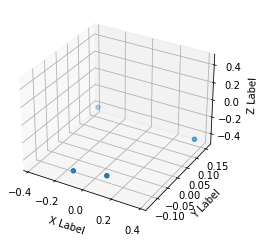

Time diff:  18272.0


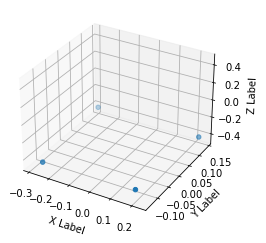

Time diff:  261.0
Footstep timestamp:  1585929.0
Height check index:  11998
Height check timestamp:  1586029.0

FL moving: 0.09278900000000001. FR moving: 0.0023740000000000427
RL moving: 0.0002770000000000272. RR moving: 0.09587200000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.414421. FR later: -0.416795
RR moving: -0.408658. RL moving: -0.315869

Coord FR: [0.188, -0.126, -0.414]. Coord FL: [0.227, 0.135, -0.409]. Coord RR: [-0.254, -0.133, -0.415]. Coord RL: [-0.29, 0.139, -0.413]

FR step_size: 0.08422899999999998. FL step_size: 0. RR step size: 0. RL step_size: 0.09384100000000001.


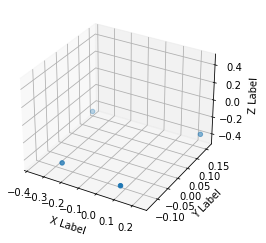

Time diff:  269.0
Footstep timestamp:  1586190.0
Height check index:  12128
Height check timestamp:  1586290.0

FL moving: 4.499999999996174e-05. FR moving: 0.08204999999999996
RL moving: 0.077212. RR moving: 0.00048599999999998644

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.403429. FR later: -0.321379
RR moving: -0.385891. RL moving: -0.385846

Coord FR: [0.11, -0.131, -0.403]. Coord FL: [0.233, 0.158, -0.386]. Coord RR: [-0.241, -0.115, -0.405]. Coord RL: [-0.371, 0.127, -0.4]

FR step_size: 0.4137744. FL step_size: 0. RR step size: 0. RL step_size: 0.42200400000000005.


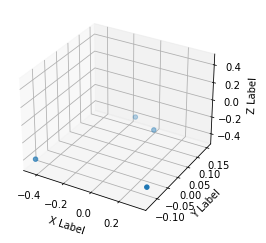

Time diff:  265.0
Footstep timestamp:  1586459.0
Height check index:  12262
Height check timestamp:  1586559.0

FL moving: 0.07902999999999999. FR moving: 0.0068010000000000015
RL moving: 0.01151000000000002. RR moving: 0.08121700000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388515. FR later: -0.395316
RR moving: -0.39387. RL moving: -0.31484

Coord FR: [0.33, -0.111, -0.389]. Coord FL: [0.04, 0.116, -0.394]. Coord RR: [-0.444, -0.132, -0.407]. Coord RL: [-0.152, 0.15, -0.401]

FR step_size: 0.5803678. FL step_size: 0. RR step size: 0. RL step_size: 0.55979.


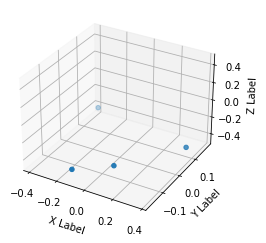

Time diff:  267.0
Footstep timestamp:  1586724.0
Height check index:  12394
Height check timestamp:  1586824.0

FL moving: 0.01433000000000001. FR moving: 0.08084799999999998
RL moving: 0.08085300000000001. RR moving: 0.01252700000000001

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390096. FR later: -0.309248
RR moving: -0.381864. RL moving: -0.396194

Coord FR: [0.081, -0.098, -0.39]. Coord FL: [0.371, 0.088, -0.382]. Coord RR: [-0.121, -0.173, -0.391]. Coord RL: [-0.388, 0.175, -0.419]

FR step_size: 0.569709. FL step_size: 0. RR step size: 0. RL step_size: 0.562384.


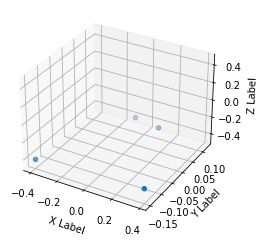

Time diff:  265.0
Footstep timestamp:  1586991.0
Height check index:  12527
Height check timestamp:  1587091.0

FL moving: 0.08209500000000003. FR moving: 0.01624500000000001
RL moving: 0.010058999999999985. RR moving: 0.080903

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.378262. FR later: -0.394507
RR moving: -0.396957. RL moving: -0.314862

Coord FR: [0.385, -0.141, -0.378]. Coord FL: [0.105, 0.103, -0.397]. Coord RR: [-0.397, -0.15, -0.41]. Coord RL: [-0.101, 0.121, -0.408]

FR step_size: 0.5577350000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.578041.


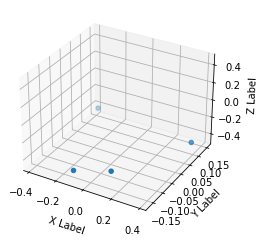

Time diff:  267.0
Footstep timestamp:  1587256.0
Height check index:  12658
Height check timestamp:  1587355.0

FL moving: 0.010744999999999949. FR moving: 0.077098
RL moving: 0.07777699999999999. RR moving: 0.011133999999999977

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.392004. FR later: -0.314906
RR moving: -0.384462. RL moving: -0.395207

Coord FR: [0.107, -0.122, -0.392]. Coord FL: [0.385, 0.101, -0.384]. Coord RR: [-0.102, -0.165, -0.397]. Coord RL: [-0.384, 0.15, -0.423]

FR step_size: 0.5646180000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5786533.


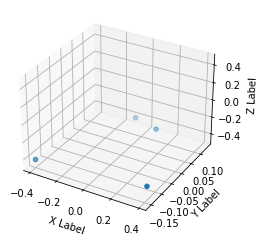

Time diff:  267.0
Footstep timestamp:  1587523.0
Height check index:  12791
Height check timestamp:  1587622.0

FL moving: 0.08023999999999998. FR moving: 0.015766999999999975
RL moving: 0.008740999999999999. RR moving: 0.079648

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38129. FR later: -0.397057
RR moving: -0.397958. RL moving: -0.317718

Coord FR: [0.39, -0.132, -0.381]. Coord FL: [0.103, 0.107, -0.398]. Coord RR: [-0.392, -0.154, -0.411]. Coord RL: [-0.095, 0.134, -0.409]

FR step_size: 0.5667220000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5764260000000001.


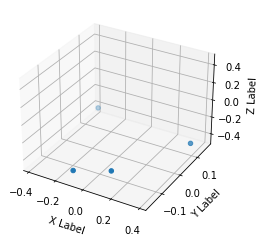

Time diff:  269.0
Footstep timestamp:  1587790.0
Height check index:  12924
Height check timestamp:  1587889.0

FL moving: 0.010400999999999994. FR moving: 0.07963800000000004
RL moving: 0.07938800000000001. RR moving: 0.009196000000000037

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394921. FR later: -0.315283
RR moving: -0.386276. RL moving: -0.396677

Coord FR: [0.106, -0.116, -0.395]. Coord FL: [0.386, 0.103, -0.386]. Coord RR: [-0.103, -0.162, -0.399]. Coord RL: [-0.382, 0.157, -0.421]

FR step_size: 0.562764. FL step_size: 0. RR step size: 0. RL step_size: 0.56824.


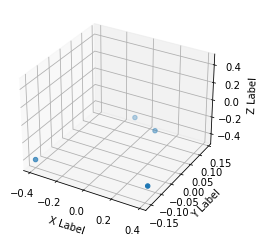

Time diff:  263.0
Footstep timestamp:  1588059.0
Height check index:  13058
Height check timestamp:  1588158.0

FL moving: 0.08268399999999998. FR moving: 0.011560999999999988
RL moving: 0.009286000000000016. RR moving: 0.08247500000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.386494. FR later: -0.398055
RR moving: -0.397669. RL moving: -0.314985

Coord FR: [0.386, -0.128, -0.386]. Coord FL: [0.104, 0.104, -0.398]. Coord RR: [-0.392, -0.154, -0.412]. Coord RL: [-0.102, 0.14, -0.409]

FR step_size: 0.5581020000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5738717.


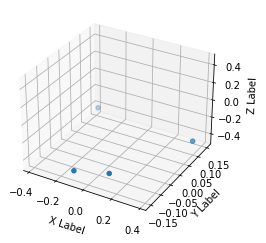

Time diff:  17935.0


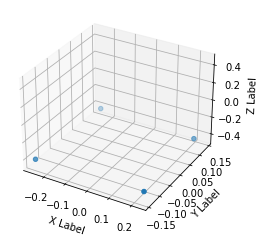

Time diff:  265.0
Footstep timestamp:  1606257.0
Height check index:  13298
Height check timestamp:  1606358.0

FL moving: 0.00010799999999999699. FR moving: 0.097669
RL moving: 0.09791. RR moving: 0.002448999999999979

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.406969. FR later: -0.3093
RR moving: -0.411472. RL moving: -0.41158

Coord FR: [0.227, -0.135, -0.407]. Coord FL: [0.215, 0.123, -0.411]. Coord RR: [-0.261, -0.143, -0.408]. Coord RL: [-0.248, 0.139, -0.42]

FR step_size: 0.06868600000000002. FL step_size: 0. RR step size: 0. RL step_size: 0.07602199999999998.


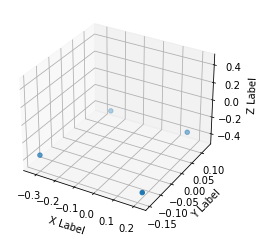

Time diff:  255.0
Footstep timestamp:  1606522.0
Height check index:  13429
Height check timestamp:  1606621.0

FL moving: 0.08986900000000003. FR moving: 0.0016800000000000148
RL moving: 0.0010600000000000054. RR moving: 0.08832600000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39932. FR later: -0.39764
RR moving: -0.404183. RL moving: -0.314314

Coord FR: [0.219, -0.147, -0.399]. Coord FL: [0.155, 0.127, -0.404]. Coord RR: [-0.328, -0.129, -0.403]. Coord RL: [-0.257, 0.127, -0.412]

FR step_size: 0.31109770000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.313839.


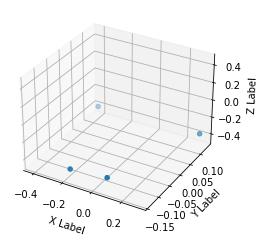

Time diff:  275.0
Footstep timestamp:  1606777.0
Height check index:  13556
Height check timestamp:  1606876.0

FL moving: 0.0038599999999999746. FR moving: 0.07170599999999999
RL moving: 0.06766. RR moving: 0.006855

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390522. FR later: -0.318816
RR moving: -0.379771. RL moving: -0.383631

Coord FR: [0.06, -0.127, -0.391]. Coord FL: [0.307, 0.133, -0.38]. Coord RR: [-0.175, -0.137, -0.393]. Coord RL: [-0.418, 0.133, -0.403]

FR step_size: 0.5604198. FL step_size: 0. RR step size: 0. RL step_size: 0.562587.


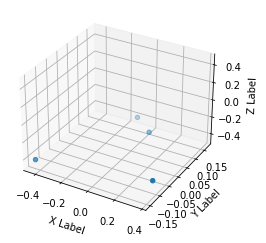

Time diff:  267.0
Footstep timestamp:  1607052.0
Height check index:  13693
Height check timestamp:  1607151.0

FL moving: 0.07724900000000001. FR moving: 0.013496999999999981
RL moving: 0.018550999999999984. RR moving: 0.078953

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.383087. FR later: -0.396584
RR moving: -0.392293. RL moving: -0.315044

Coord FR: [0.369, -0.096, -0.383]. Coord FL: [0.056, 0.11, -0.392]. Coord RR: [-0.435, -0.15, -0.413]. Coord RL: [-0.115, 0.166, -0.399]

FR step_size: 0.591448. FL step_size: 0. RR step size: 0. RL step_size: 0.586009.


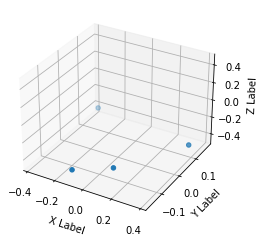

Time diff:  267.0
Footstep timestamp:  1607319.0
Height check index:  13826
Height check timestamp:  1607418.0

FL moving: 0.011517. FR moving: 0.08241100000000001
RL moving: 0.08228199999999997. RR moving: 0.011624000000000023

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.391446. FR later: -0.309035
RR moving: -0.384348. RL moving: -0.395865

Coord FR: [0.101, -0.101, -0.391]. Coord FL: [0.38, 0.101, -0.384]. Coord RR: [-0.108, -0.163, -0.395]. Coord RL: [-0.374, 0.168, -0.421]

FR step_size: 0.551846. FL step_size: 0. RR step size: 0. RL step_size: 0.552729.


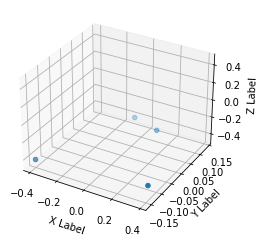

Time diff:  263.0
Footstep timestamp:  1607586.0
Height check index:  13959
Height check timestamp:  1607685.0

FL moving: 0.08454400000000001. FR moving: 0.013341000000000047
RL moving: 0.008326. RR moving: 0.08348

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.383688. FR later: -0.397029
RR moving: -0.397921. RL moving: -0.313377

Coord FR: [0.382, -0.128, -0.384]. Coord FL: [0.109, 0.105, -0.398]. Coord RR: [-0.392, -0.155, -0.411]. Coord RL: [-0.105, 0.137, -0.41]

FR step_size: 0.5477609999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.569175.


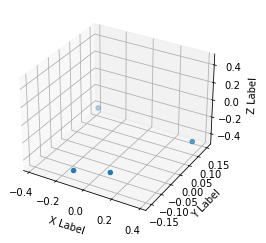

Time diff:  268.0
Footstep timestamp:  1607849.0
Height check index:  14090
Height check timestamp:  1607948.0

FL moving: 0.008744999999999947. FR moving: 0.07939400000000002
RL moving: 0.08093299999999998. RR moving: 0.00961200000000001

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393422. FR later: -0.314028
RR moving: -0.38596. RL moving: -0.394705

Coord FR: [0.107, -0.12, -0.393]. Coord FL: [0.382, 0.108, -0.386]. Coord RR: [-0.103, -0.156, -0.398]. Coord RL: [-0.385, 0.15, -0.421]

FR step_size: 0.55731. FL step_size: 0. RR step size: 0. RL step_size: 0.5766310000000001.


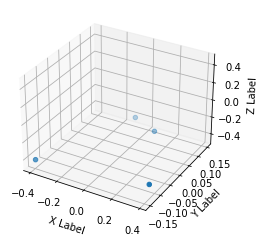

Time diff:  18369.0


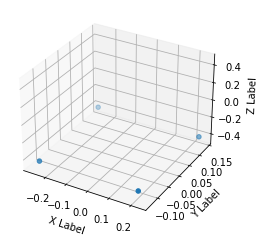

Time diff:  261.0
Footstep timestamp:  1626486.0
Height check index:  14285
Height check timestamp:  1626586.0

FL moving: 0.09636500000000003. FR moving: 0.00014700000000000824
RL moving: 0.0009260000000000379. RR moving: 0.09824099999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.415882. FR later: -0.416029
RR moving: -0.409088. RL moving: -0.312723

Coord FR: [0.206, -0.127, -0.416]. Coord FL: [0.23, 0.135, -0.409]. Coord RR: [-0.251, -0.133, -0.415]. Coord RL: [-0.27, 0.138, -0.412]

FR step_size: 0.07253299999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.07219199999999995.


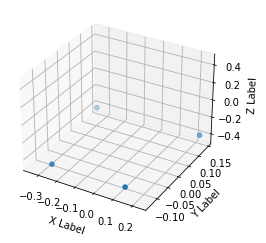

Time diff:  265.0
Footstep timestamp:  1626747.0
Height check index:  14415
Height check timestamp:  1626847.0

FL moving: 0.002931000000000017. FR moving: 0.08646100000000001
RL moving: 0.082509. RR moving: 0.00036000000000002697

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.405138. FR later: -0.318677
RR moving: -0.396422. RL moving: -0.393491

Coord FR: [0.137, -0.129, -0.405]. Coord FL: [0.227, 0.142, -0.396]. Coord RR: [-0.25, -0.131, -0.404]. Coord RL: [-0.341, 0.136, -0.404]

FR step_size: 0.3562014. FL step_size: 0. RR step size: 0. RL step_size: 0.360162.


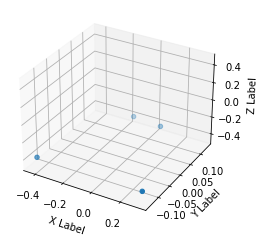

Time diff:  267.0
Footstep timestamp:  1627012.0
Height check index:  14547
Height check timestamp:  1627112.0

FL moving: 0.079434. FR moving: 0.00696800000000003
RL moving: 0.01058899999999996. RR moving: 0.077129

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385254. FR later: -0.392222
RR moving: -0.395784. RL moving: -0.31635

Coord FR: [0.317, -0.136, -0.385]. Coord FL: [0.051, 0.122, -0.396]. Coord RR: [-0.431, -0.13, -0.4]. Coord RL: [-0.162, 0.132, -0.402]

FR step_size: 0.5684093000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.54403.


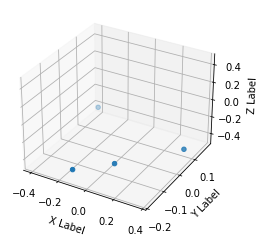

Time diff:  269.0
Footstep timestamp:  1627279.0
Height check index:  14679
Height check timestamp:  1627378.0

FL moving: 0.014122999999999997. FR moving: 0.07861800000000002
RL moving: 0.07819300000000001. RR moving: 0.010942000000000007

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.391623. FR later: -0.313005
RR moving: -0.380939. RL moving: -0.395062

Coord FR: [0.065, -0.093, -0.392]. Coord FL: [0.367, 0.076, -0.381]. Coord RR: [-0.126, -0.182, -0.393]. Coord RL: [-0.401, 0.181, -0.416]

FR step_size: 0.585151. FL step_size: 0. RR step size: 0. RL step_size: 0.569903.


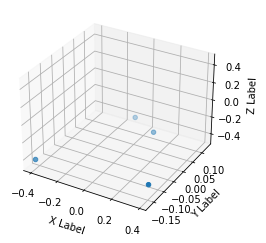

Time diff:  261.0
Footstep timestamp:  1627548.0
Height check index:  14813
Height check timestamp:  1627647.0

FL moving: 0.08175700000000002. FR moving: 0.016359000000000012
RL moving: 0.010097999999999996. RR moving: 0.082598

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.379917. FR later: -0.396276
RR moving: -0.396048. RL moving: -0.314291

Coord FR: [0.386, -0.137, -0.38]. Coord FL: [0.103, 0.083, -0.396]. Coord RR: [-0.4, -0.167, -0.411]. Coord RL: [-0.105, 0.128, -0.407]

FR step_size: 0.556192. FL step_size: 0. RR step size: 0. RL step_size: 0.5872174000000001.


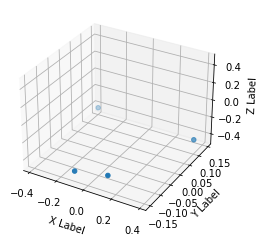

Time diff:  271.0
Footstep timestamp:  1627809.0
Height check index:  14943
Height check timestamp:  1627908.0

FL moving: 0.00986699999999996. FR moving: 0.075459
RL moving: 0.07633099999999998. RR moving: 0.011859000000000008

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394122. FR later: -0.318663
RR moving: -0.382188. RL moving: -0.392055

Coord FR: [0.111, -0.129, -0.394]. Coord FL: [0.385, 0.112, -0.382]. Coord RR: [-0.097, -0.15, -0.4]. Coord RL: [-0.389, 0.144, -0.419]

FR step_size: 0.556921. FL step_size: 0. RR step size: 0. RL step_size: 0.582414.


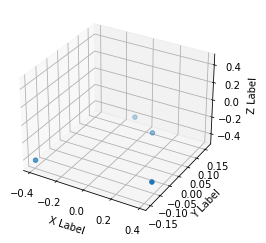

Time diff:  261.0
Footstep timestamp:  1628080.0
Height check index:  15078
Height check timestamp:  1628179.0

FL moving: 0.08121099999999998. FR moving: 0.011052000000000006
RL moving: 0.01170899999999997. RR moving: 0.08174399999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388413. FR later: -0.399465
RR moving: -0.394727. RL moving: -0.313516

Coord FR: [0.387, -0.102, -0.388]. Coord FL: [0.105, 0.108, -0.395]. Coord RR: [-0.391, -0.151, -0.419]. Coord RL: [-0.101, 0.16, -0.404]

FR step_size: 0.557191. FL step_size: 0. RR step size: 0. RL step_size: 0.5730656000000001.


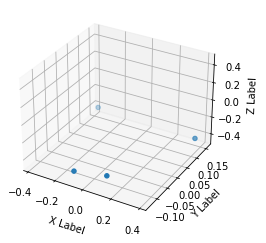

Time diff:  273.0
Footstep timestamp:  1628341.0
Height check index:  15208
Height check timestamp:  1628440.0

FL moving: 0.009838999999999987. FR moving: 0.07642199999999999
RL moving: 0.07244899999999999. RR moving: 0.008521

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397077. FR later: -0.320655
RR moving: -0.380313. RL moving: -0.390152

Coord FR: [0.11, -0.113, -0.397]. Coord FL: [0.385, 0.13, -0.38]. Coord RR: [-0.095, -0.132, -0.403]. Coord RL: [-0.378, 0.155, -0.415]

FR step_size: 0.5582940000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5730550000000001.


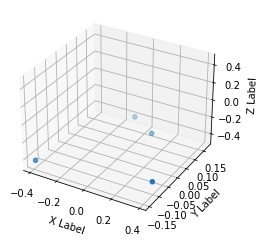

Time diff:  260.0
Footstep timestamp:  1628614.0
Height check index:  15344
Height check timestamp:  1628713.0

FL moving: 0.08090799999999998. FR moving: 0.011579000000000006
RL moving: 0.014110999999999985. RR moving: 0.08338299999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390274. FR later: -0.401853
RR moving: -0.394429. RL moving: -0.313521

Coord FR: [0.387, -0.094, -0.39]. Coord FL: [0.104, 0.113, -0.394]. Coord RR: [-0.393, -0.146, -0.42]. Coord RL: [-0.103, 0.17, -0.402]

FR step_size: 0.5556840000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5693751.


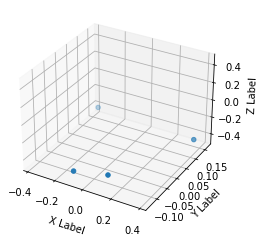

Time diff:  22974.0


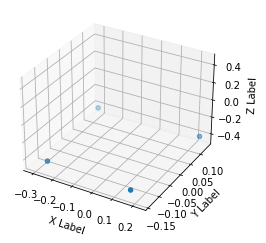

Time diff:  255.0
Footstep timestamp:  1651848.0
Height check index:  15683
Height check timestamp:  1651947.0

FL moving: 0.09493000000000001. FR moving: 0.0006369999999999987
RL moving: 0.003797999999999968. RR moving: 0.09748000000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.41198. FR later: -0.411343
RR moving: -0.411178. RL moving: -0.316248

Coord FR: [0.168, -0.14, -0.412]. Coord FL: [0.224, 0.133, -0.411]. Coord RR: [-0.26, -0.132, -0.412]. Coord RL: [-0.312, 0.133, -0.42]

FR step_size: 0.1143993. FL step_size: 0. RR step size: 0. RL step_size: 0.13918300000000003.


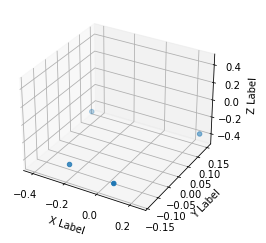

Time diff:  277.0
Footstep timestamp:  1652103.0
Height check index:  15810
Height check timestamp:  1652202.0

FL moving: 0.0006799999999999584. FR moving: 0.07424700000000001
RL moving: 0.068768. RR moving: 0.003273000000000026

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398708. FR later: -0.324461
RR moving: -0.381657. RL moving: -0.382337

Coord FR: [0.077, -0.137, -0.399]. Coord FL: [0.247, 0.149, -0.382]. Coord RR: [-0.222, -0.119, -0.4]. Coord RL: [-0.413, 0.118, -0.401]

FR step_size: 0.47509539999999995. FL step_size: 0. RR step size: 0. RL step_size: 0.49388699999999996.


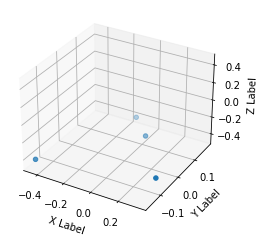

Time diff:  262.0
Footstep timestamp:  1652380.0
Height check index:  15948
Height check timestamp:  1652479.0

FL moving: 0.08124299999999995. FR moving: 0.008492999999999973
RL moving: 0.011460000000000026. RR moving: 0.083951

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38795. FR later: -0.396443
RR moving: -0.394933. RL moving: -0.31369

Coord FR: [0.337, -0.082, -0.388]. Coord FL: [0.032, 0.095, -0.395]. Coord RR: [-0.448, -0.156, -0.409]. Coord RL: [-0.145, 0.175, -0.401]

FR step_size: 0.5844343. FL step_size: 0. RR step size: 0. RL step_size: 0.5587719999999999.


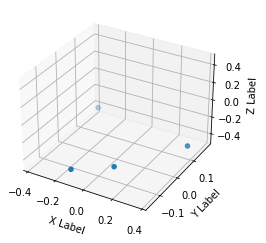

Time diff:  265.0
Footstep timestamp:  1652642.0
Height check index:  16079
Height check timestamp:  1652742.0

FL moving: 0.013423999999999991. FR moving: 0.08229599999999998
RL moving: 0.08247100000000002. RR moving: 0.01198100000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390538. FR later: -0.308242
RR moving: -0.381907. RL moving: -0.395331

Coord FR: [0.092, -0.086, -0.391]. Coord FL: [0.371, 0.107, -0.382]. Coord RR: [-0.12, -0.155, -0.394]. Coord RL: [-0.376, 0.183, -0.418]

FR step_size: 0.5502309999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.5500390000000001.


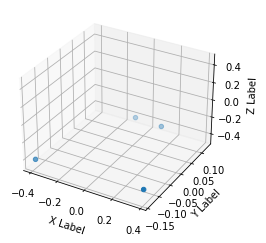

Time diff:  269.0
Footstep timestamp:  1652907.0
Height check index:  16211
Height check timestamp:  1653007.0

FL moving: 0.080241. FR moving: 0.015425999999999995
RL moving: 0.010548000000000002. RR moving: 0.07788900000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.379801. FR later: -0.395227
RR moving: -0.396623. RL moving: -0.316382

Coord FR: [0.38, -0.133, -0.38]. Coord FL: [0.109, 0.117, -0.397]. Coord RR: [-0.397, -0.139, -0.409]. Coord RL: [-0.103, 0.126, -0.408]

FR step_size: 0.548223. FL step_size: 0. RR step size: 0. RL step_size: 0.5669360000000001.


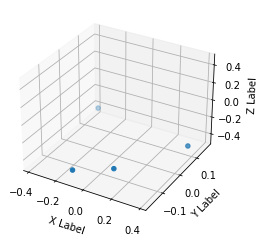

Time diff:  265.0
Footstep timestamp:  1653176.0
Height check index:  16345
Height check timestamp:  1653276.0

FL moving: 0.011078000000000032. FR moving: 0.08318900000000001
RL moving: 0.08442699999999997. RR moving: 0.010783000000000043

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393164. FR later: -0.309975
RR moving: -0.386298. RL moving: -0.397376

Coord FR: [0.105, -0.108, -0.393]. Coord FL: [0.382, 0.091, -0.386]. Coord RR: [-0.109, -0.168, -0.396]. Coord RL: [-0.382, 0.163, -0.423]

FR step_size: 0.5596639999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.5709010999999999.


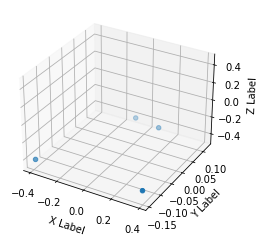

Time diff:  267.0
Footstep timestamp:  1653441.0
Height check index:  16477
Height check timestamp:  1653541.0

FL moving: 0.08191600000000004. FR moving: 0.01526999999999995
RL moving: 0.010393000000000041. RR moving: 0.08037099999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.380159. FR later: -0.395429
RR moving: -0.399643. RL moving: -0.317727

Coord FR: [0.388, -0.144, -0.38]. Coord FL: [0.106, 0.103, -0.4]. Coord RR: [-0.395, -0.145, -0.41]. Coord RL: [-0.097, 0.119, -0.411]

FR step_size: 0.561014. FL step_size: 0. RR step size: 0. RL step_size: 0.578415.


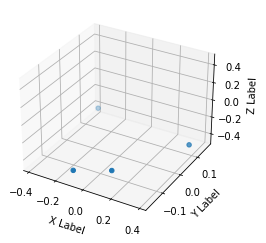

Time diff:  267.0
Footstep timestamp:  1653708.0
Height check index:  16610
Height check timestamp:  1653808.0

FL moving: 0.011185999999999974. FR moving: 0.08219199999999999
RL moving: 0.08402899999999996. RR moving: 0.010164000000000006

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393185. FR later: -0.310993
RR moving: -0.387251. RL moving: -0.398437

Coord FR: [0.107, -0.118, -0.393]. Coord FL: [0.386, 0.094, -0.387]. Coord RR: [-0.103, -0.166, -0.397]. Coord RL: [-0.383, 0.157, -0.424]

FR step_size: 0.561013. FL step_size: 0. RR step size: 0. RL step_size: 0.5761931.


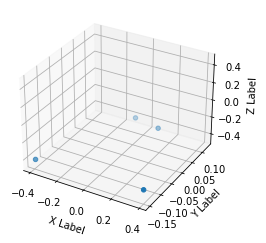

Time diff:  265.0
Footstep timestamp:  1653975.0
Height check index:  16743
Height check timestamp:  1654075.0

FL moving: 0.08371499999999998. FR moving: 0.012859999999999983
RL moving: 0.009926999999999964. RR moving: 0.08191099999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38317. FR later: -0.39603
RR moving: -0.399927. RL moving: -0.316212

Coord FR: [0.388, -0.142, -0.383]. Coord FL: [0.106, 0.105, -0.4]. Coord RR: [-0.394, -0.148, -0.41]. Coord RL: [-0.098, 0.124, -0.411]

FR step_size: 0.561925. FL step_size: 0. RR step size: 0. RL step_size: 0.5758000000000001.


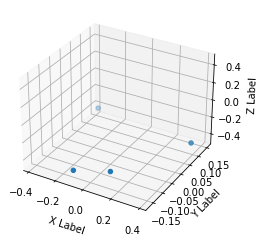

Time diff:  269.0
Footstep timestamp:  1654240.0
Height check index:  16875
Height check timestamp:  1654340.0

FL moving: 0.009347999999999967. FR moving: 0.07997699999999996
RL moving: 0.08226800000000001. RR moving: 0.010516000000000025

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.392752. FR later: -0.312775
RR moving: -0.387539. RL moving: -0.396887

Coord FR: [0.106, -0.124, -0.393]. Coord FL: [0.386, 0.1, -0.388]. Coord RR: [-0.101, -0.165, -0.396]. Coord RL: [-0.381, 0.15, -0.423]

FR step_size: 0.5614790000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.5705403.


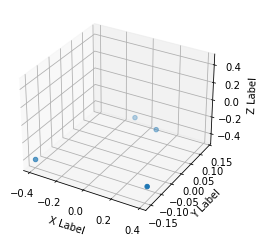

Time diff:  265.0
Footstep timestamp:  1654509.0
Height check index:  17009
Height check timestamp:  1654609.0

FL moving: 0.08569300000000002. FR moving: 0.012126000000000026
RL moving: 0.009759000000000018. RR moving: 0.08562200000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385526. FR later: -0.397652
RR moving: -0.398878. RL moving: -0.313185

Coord FR: [0.387, -0.13, -0.386]. Coord FL: [0.105, 0.107, -0.399]. Coord RR: [-0.39, -0.153, -0.411]. Coord RL: [-0.1, 0.136, -0.41]

FR step_size: 0.559405. FL step_size: 0. RR step size: 0. RL step_size: 0.5669460000000001.


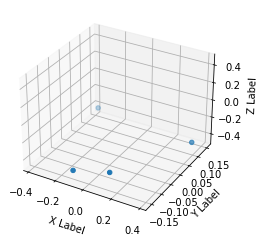

Time diff:  267.0
Footstep timestamp:  1654774.0
Height check index:  17141
Height check timestamp:  1654874.0

FL moving: 0.008002000000000009. FR moving: 0.08197700000000002
RL moving: 0.08387099999999997. RR moving: 0.010361000000000009

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394162. FR later: -0.312185
RR moving: -0.388773. RL moving: -0.396775

Coord FR: [0.106, -0.121, -0.394]. Coord FL: [0.384, 0.106, -0.389]. Coord RR: [-0.103, -0.157, -0.398]. Coord RL: [-0.38, 0.151, -0.421]

FR step_size: 0.555084. FL step_size: 0. RR step size: 0. RL step_size: 0.5602910000000001.


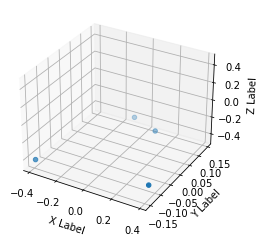

Time diff:  265.0
Footstep timestamp:  1655041.0
Height check index:  17273
Height check timestamp:  1655140.0

FL moving: 0.08105899999999999. FR moving: 0.011917000000000011
RL moving: 0.010774000000000006. RR moving: 0.08151400000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.386706. FR later: -0.398623
RR moving: -0.397746. RL moving: -0.316687

Coord FR: [0.384, -0.12, -0.387]. Coord FL: [0.107, 0.108, -0.398]. Coord RR: [-0.387, -0.151, -0.412]. Coord RL: [-0.103, 0.145, -0.408]

FR step_size: 0.5526030000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.560808.


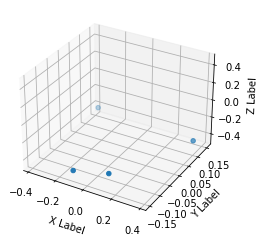

Time diff:  271.0
Footstep timestamp:  1655306.0
Height check index:  17405
Height check timestamp:  1655405.0

FL moving: 0.009021999999999974. FR moving: 0.08164500000000002
RL moving: 0.08255800000000002. RR moving: 0.008276000000000006

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394506. FR later: -0.312861
RR moving: -0.386894. RL moving: -0.395916

Coord FR: [0.106, -0.118, -0.395]. Coord FL: [0.382, 0.115, -0.387]. Coord RR: [-0.103, -0.148, -0.399]. Coord RL: [-0.38, 0.151, -0.418]

FR step_size: 0.5606231. FL step_size: 0. RR step size: 0. RL step_size: 0.564772.


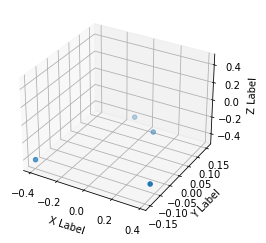

Time diff:  261.0
Footstep timestamp:  1655577.0
Height check index:  17540
Height check timestamp:  1655676.0

FL moving: 0.08379500000000001. FR moving: 0.011172999999999988
RL moving: 0.010792000000000024. RR moving: 0.08715499999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390916. FR later: -0.402089
RR moving: -0.397679. RL moving: -0.313884

Coord FR: [0.383, -0.111, -0.391]. Coord FL: [0.099, 0.108, -0.398]. Coord RR: [-0.395, -0.15, -0.413]. Coord RL: [-0.107, 0.153, -0.405]

FR step_size: 0.560121. FL step_size: 0. RR step size: 0. RL step_size: 0.567507.


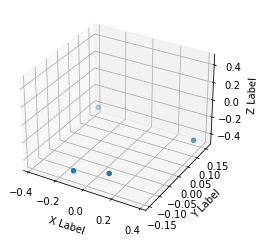

Time diff:  273.0
Footstep timestamp:  1655838.0
Height check index:  17670
Height check timestamp:  1655937.0

FL moving: 0.010099999999999998. FR moving: 0.077706
RL moving: 0.07740999999999998. RR moving: 0.009153000000000022

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397278. FR later: -0.319572
RR moving: -0.385661. RL moving: -0.395761

Coord FR: [0.106, -0.114, -0.397]. Coord FL: [0.382, 0.122, -0.386]. Coord RR: [-0.101, -0.146, -0.401]. Coord RL: [-0.381, 0.156, -0.414]

FR step_size: 0.552918. FL step_size: 0. RR step size: 0. RL step_size: 0.564863.


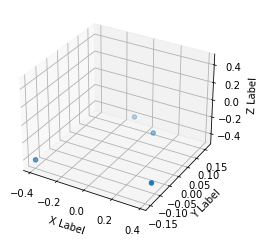

Time diff:  261.0
Footstep timestamp:  1656111.0
Height check index:  17806
Height check timestamp:  1656210.0

FL moving: 0.08604299999999998. FR moving: 0.009953000000000045
RL moving: 0.010950999999999989. RR moving: 0.08682699999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.393711. FR later: -0.403664
RR moving: -0.396928. RL moving: -0.310885

Coord FR: [0.382, -0.104, -0.394]. Coord FL: [0.105, 0.11, -0.397]. Coord RR: [-0.393, -0.151, -0.415]. Coord RL: [-0.108, 0.161, -0.404]

FR step_size: 0.551811. FL step_size: 0. RR step size: 0. RL step_size: 0.564908.


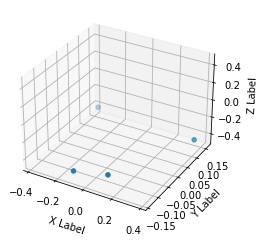

Time diff:  272.0
Footstep timestamp:  1656372.0
Height check index:  17936
Height check timestamp:  1656471.0

FL moving: 0.008282000000000012. FR moving: 0.08036700000000002
RL moving: 0.07940400000000003. RR moving: 0.008543000000000023

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.399212. FR later: -0.318845
RR moving: -0.386659. RL moving: -0.394941

Coord FR: [0.106, -0.114, -0.399]. Coord FL: [0.381, 0.126, -0.387]. Coord RR: [-0.101, -0.139, -0.403]. Coord RL: [-0.38, 0.156, -0.413]

FR step_size: 0.5533159999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.55684.


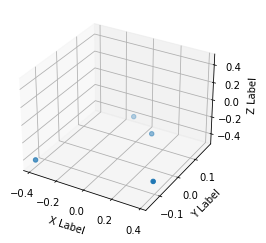

Time diff:  261.0
Footstep timestamp:  1656644.0
Height check index:  18072
Height check timestamp:  1656744.0

FL moving: 0.08704499999999998. FR moving: 0.009358000000000033
RL moving: 0.012670999999999988. RR moving: 0.08892099999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39574. FR later: -0.405098
RR moving: -0.396621. RL moving: -0.309576

Coord FR: [0.381, -0.093, -0.396]. Coord FL: [0.103, 0.111, -0.397]. Coord RR: [-0.387, -0.15, -0.416]. Coord RL: [-0.11, 0.169, -0.402]

FR step_size: 0.5510090000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.554529.


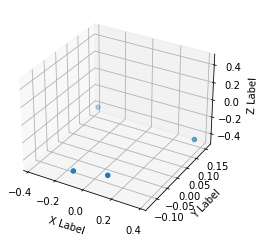

Time diff:  271.0
Footstep timestamp:  1656905.0
Height check index:  18202
Height check timestamp:  1657005.0

FL moving: 0.007482999999999962. FR moving: 0.08218000000000003
RL moving: 0.08014199999999999. RR moving: 0.009489000000000025

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.400376. FR later: -0.318196
RR moving: -0.386572. RL moving: -0.394055

Coord FR: [0.108, -0.109, -0.4]. Coord FL: [0.381, 0.129, -0.387]. Coord RR: [-0.101, -0.132, -0.404]. Coord RL: [-0.378, 0.157, -0.412]

FR step_size: 0.549343. FL step_size: 0. RR step size: 0. RL step_size: 0.552546.


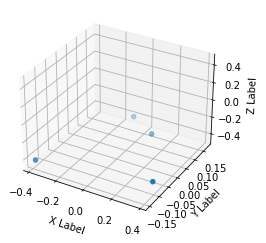

In [42]:
def visualize_absolute_foostep_sizes(dataset, footsteps):    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)
                    
        # 3D positions
        xs = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
        ys = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
        zs = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])    

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()
        
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
        
            print("Time diff: ", time_diff)

            if time_diff < 300:
                
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(motion_08_cmds[:, 0] - (motion_08_cmds[footstep, 0] + 100))
                idx_height_check = absolute_val_array.argmin()
                
                fr_moving = np.abs(motion_08_cmds[footstep, 34] - motion_08_cmds[idx_height_check, 34])
                fl_moving = np.abs(motion_08_cmds[footstep, 37] - motion_08_cmds[idx_height_check, 37])
                rr_moving = np.abs(motion_08_cmds[footstep, 40] - motion_08_cmds[idx_height_check, 40])
                rl_moving = np.abs(motion_08_cmds[footstep, 43] - motion_08_cmds[idx_height_check, 43])
                
                print("Footstep timestamp: ", motion_08_cmds[footstep, 0])
                print("Height check index: ", idx_height_check)
                print("Height check timestamp: ", motion_08_cmds[idx_height_check, 0])

                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                print(f'\nFL moving: {fl_moving > 0.06}. FR moving: {fr_moving > 0.06}')
                print(f'RL moving: {rl_moving > 0.06}. RR moving: {rr_moving > 0.06}')
                
                print(f'\nFR before: {motion_08_cmds[footstep, 34]}. FR later: {motion_08_cmds[idx_height_check, 34]}')
                print(f'RR moving: {motion_08_cmds[footstep, 37]}. RL moving: {motion_08_cmds[idx_height_check, 37]}')

                assert (fr_moving > 0.06) == (rl_moving > 0.06)
                assert (rr_moving > 0.06) == (fl_moving > 0.06)
                assert (fr_moving > 0.06) != (fl_moving > 0.06)
                
                # Compute front feet movements
                fr_movement = abs(abs(dataset[footstep, 32]) - abs(dataset[footsteps[idx+1], 32]))
                fl_movement = abs(abs(dataset[footstep, 35]) - abs(dataset[footsteps[idx+1], 35]))
                rr_movement = abs(abs(dataset[footstep, 38]) - abs(dataset[footsteps[idx+1], 38]))
                rl_movement = abs(abs(dataset[footstep, 41]) - abs(dataset[footsteps[idx+1], 41]))
                
                print(f'\nCoord FR: {[xs[0], ys[0], zs[0]]}. Coord FL: {[xs[1], ys[1], zs[1]]}. Coord RR: {[xs[2], ys[2], zs[2]]}. Coord RL: {[xs[3], ys[3], zs[3]]}')
                
                if fr_moving:
                    print(f'\nFR step_size: {fr_movement + fl_movement}. FL step_size: {0}. RR step size: {0}. RL step_size: {rl_movement + rr_movement}.')
                elif fl_moving:
                    print(f'\nFR step_size: {0}. FL step_size: {fl_movement + fr_movement}. RR step size: {rl_movement + rr_movement}. RL step_size: {0}.')
                else:
                    print("\nERROR")

cmds = get_specific_cmd(motion_08, velocity, 0, 0)
motion_08_cmds = motion_08[cmds]
visualize_absolute_foostep_sizes(motion_08_fwd, footsteps_08_fwd)

### Forward motion

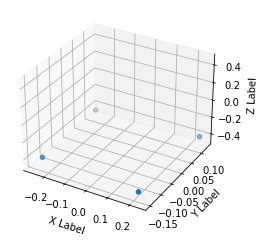

Command: [0.809811 0.       0.      ]. State: [0.45507   0.0401294 0.0356071]. Coord: [0.22, -0.149, -0.405].


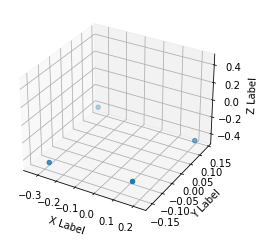

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [0.333282  0.0346714 0.0238892]. Coord: [0.142, -0.13, -0.399]. Step size: [-0.07800000000000001, 0.01899999999999999, 0.006000000000000005].


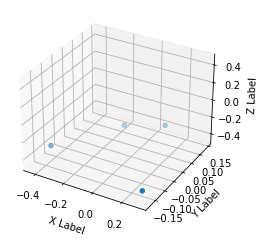

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [0.168006 0.056343 0.709919]. Coord: [0.304, -0.177, -0.379]. Step size: [0.162, -0.046999999999999986, 0.020000000000000018].


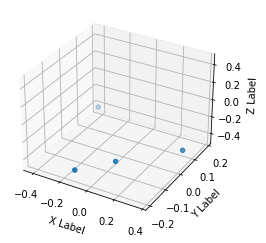

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.123509  0.25673  -0.378781]. Coord: [0.05, -0.091, -0.392]. Step size: [-0.254, 0.086, -0.013000000000000012].


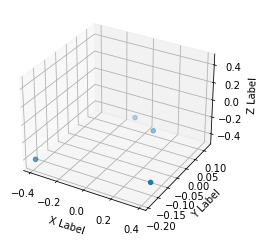

Diff: 275.0. Command: [0.809811 0.       0.      ]. State: [0.31908  0.116325 0.275292]. Coord: [0.389, -0.148, -0.378]. Step size: [0.339, -0.056999999999999995, 0.014000000000000012].


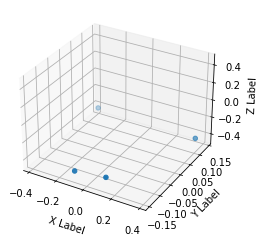

Diff: 259.0. Command: [0.809811 0.       0.      ]. State: [ 0.0988736 -0.0952468 -0.200882 ]. Coord: [0.114, -0.135, -0.393]. Step size: [-0.275, 0.012999999999999984, -0.015000000000000013].


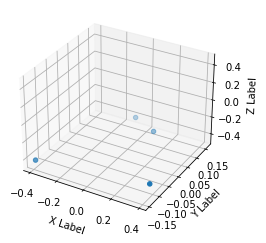

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 0.230486  -0.0195761  0.3701   ]. Coord: [0.389, -0.108, -0.385]. Step size: [0.275, 0.02700000000000001, 0.008000000000000007].


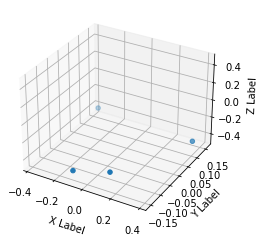

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.189107  -0.0235627 -0.23284  ]. Coord: [0.11, -0.115, -0.394]. Step size: [-0.279, -0.007000000000000006, -0.009000000000000008].


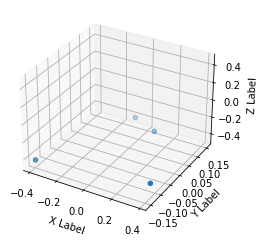

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.192938  0.0289949 0.32962  ]. Coord: [0.384, -0.113, -0.385]. Step size: [0.274, 0.0020000000000000018, 0.009000000000000008].


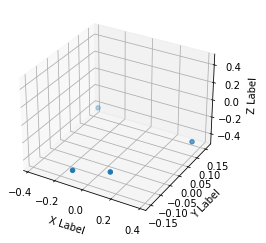

Diff: 266.0. Command: [0.809811 0.       0.      ]. State: [ 0.233088  -0.0578612 -0.248819 ]. Coord: [0.108, -0.114, -0.394]. Step size: [-0.276, -0.0010000000000000009, -0.009000000000000008].


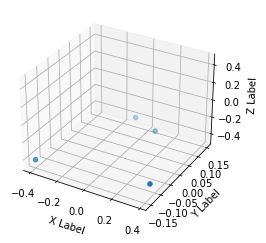

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.202405 0.027499 0.307249]. Coord: [0.384, -0.115, -0.388]. Step size: [0.276, -0.0010000000000000009, 0.006000000000000005].


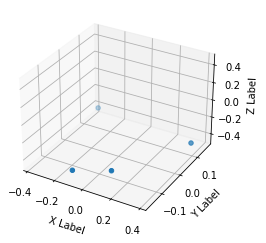

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.227746   0.0493304 -0.187033 ]. Coord: [0.107, -0.115, -0.395]. Step size: [-0.277, 0.0, -0.007000000000000006].


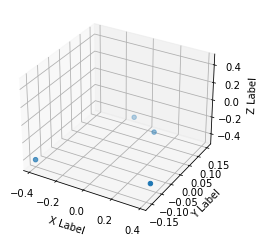

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.244262  0.0631667 0.252921 ]. Coord: [0.383, -0.117, -0.389]. Step size: [0.276, -0.0020000000000000018, 0.006000000000000005].


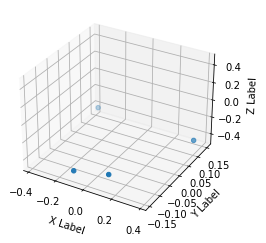

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.180906  -0.0950823 -0.223252 ]. Coord: [0.11, -0.121, -0.395]. Step size: [-0.273, -0.00399999999999999, -0.006000000000000005].


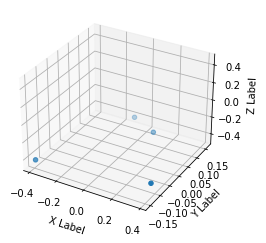

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.267811  0.0574474 0.336012 ]. Coord: [0.382, -0.107, -0.392]. Step size: [0.272, 0.013999999999999999, 0.0030000000000000027].


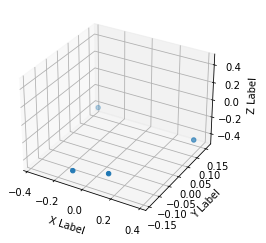

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.173796 -0.056187 -0.203012]. Coord: [0.109, -0.115, -0.396]. Step size: [-0.273, -0.008000000000000007, -0.0040000000000000036].


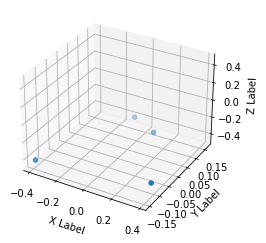

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.240252   0.00741874 0.356252  ]. Coord: [0.384, -0.102, -0.391]. Step size: [0.275, 0.013000000000000012, 0.0050000000000000044].


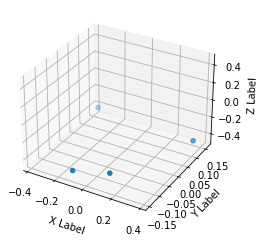

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.196864  -0.0855519 -0.211534 ]. Coord: [0.11, -0.112, -0.397]. Step size: [-0.274, -0.010000000000000009, -0.006000000000000005].


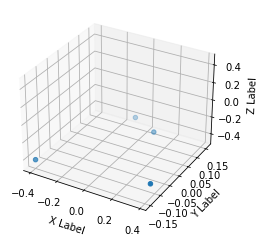

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.240962  0.0512604 0.375426 ]. Coord: [0.383, -0.11, -0.392]. Step size: [0.273, 0.0020000000000000018, 0.0050000000000000044].


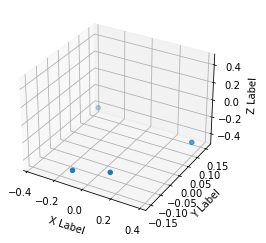

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.207618   -0.00543128 -0.199816  ]. Coord: [0.11, -0.115, -0.396]. Step size: [-0.273, -0.0050000000000000044, -0.0040000000000000036].


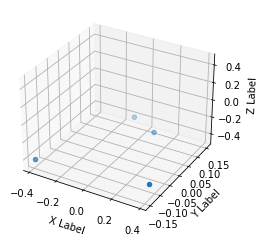

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.237227 0.065142 0.332816]. Coord: [0.383, -0.114, -0.39]. Step size: [0.273, 0.0010000000000000009, 0.006000000000000005].


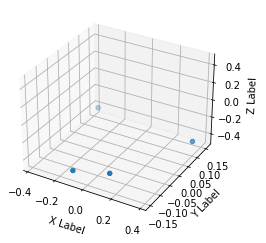

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.182495  -0.0153264 -0.19236  ]. Coord: [0.111, -0.118, -0.396]. Step size: [-0.272, -0.00399999999999999, -0.006000000000000005].


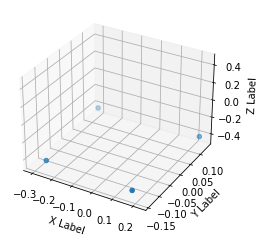

Diff: 7876.0. Command: [0.809811 0.       0.      ]. State: [0.191096  0.0252754 0.0782176]. Coord: [0.174, -0.141, -0.411]. Step size: [0.06299999999999999, -0.022999999999999993, -0.014999999999999958].


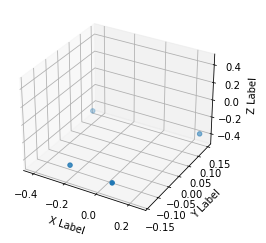

Diff: 257.0. Command: [0.809811 0.       0.      ]. State: [ 0.352982  0.14444  -0.405412]. Coord: [0.071, -0.137, -0.398]. Step size: [-0.103, 0.003999999999999976, 0.012999999999999956].


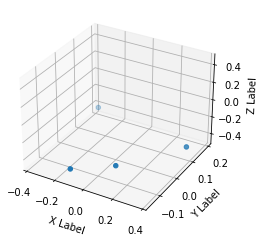

Diff: 539.0. Command: [0.809811 0.       0.      ]. State: [ 0.153485  -0.0535409 -0.13377  ]. Coord: [0.096, -0.078, -0.391]. Step size: [0.02500000000000001, 0.05900000000000001, 0.007000000000000006].


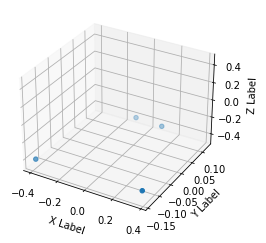

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [0.116256 0.134316 0.232681]. Coord: [0.377, -0.14, -0.378]. Step size: [0.281, -0.06200000000000001, 0.013000000000000012].


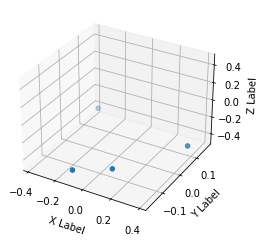

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 0.243896  -0.0400497 -0.201947 ]. Coord: [0.102, -0.111, -0.392]. Step size: [-0.275, 0.029000000000000012, -0.014000000000000012].


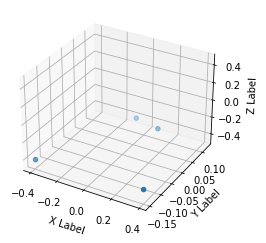

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.18053   0.0689681 0.32962  ]. Coord: [0.388, -0.142, -0.38]. Step size: [0.28600000000000003, -0.030999999999999986, 0.01200000000000001].


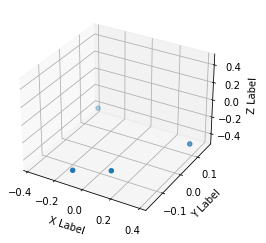

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.220404   -0.00940022 -0.17425   ]. Coord: [0.109, -0.12, -0.392]. Step size: [-0.279, 0.021999999999999992, -0.01200000000000001].


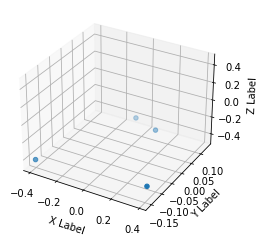

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.148022  0.0197999 0.217767 ]. Coord: [0.388, -0.133, -0.381]. Step size: [0.279, -0.013000000000000012, 0.01100000000000001].


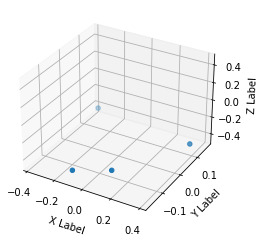

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.244569   0.0440135 -0.164663 ]. Coord: [0.109, -0.117, -0.393]. Step size: [-0.279, 0.016, -0.01200000000000001].


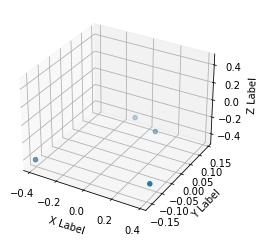

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.17617    0.00998352 0.257182  ]. Coord: [0.383, -0.122, -0.385]. Step size: [0.274, -0.0049999999999999906, 0.008000000000000007].


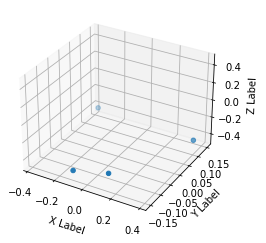

Diff: 264.0. Command: [0.809811 0.       0.      ]. State: [ 0.182719  -0.0430314 -0.259471 ]. Coord: [0.109, -0.122, -0.393]. Step size: [-0.274, 0.0, -0.008000000000000007].


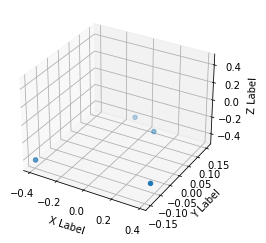

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.227171  0.0338105 0.385014 ]. Coord: [0.385, -0.11, -0.388]. Step size: [0.276, 0.011999999999999997, 0.0050000000000000044].


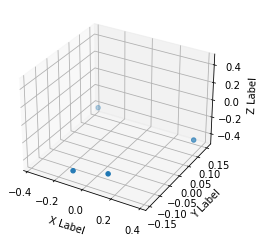

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.189112  -0.0726335 -0.233905 ]. Coord: [0.107, -0.119, -0.395]. Step size: [-0.278, -0.008999999999999994, -0.007000000000000006].


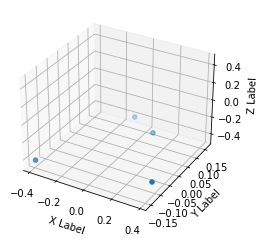

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 1.92585e-01 -2.51934e-04  3.44534e-01]. Coord: [0.383, -0.103, -0.389]. Step size: [0.276, 0.016, 0.006000000000000005].


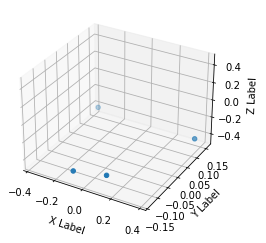

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.141538  -0.0629514 -0.190229 ]. Coord: [0.107, -0.115, -0.398]. Step size: [-0.276, -0.01200000000000001, -0.009000000000000008].


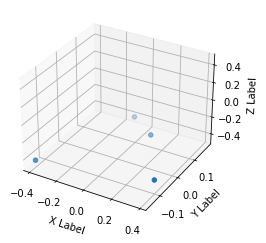

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [ 0.240718  -0.0971038  0.378622 ]. Coord: [0.383, -0.088, -0.393]. Step size: [0.276, 0.02700000000000001, 0.0050000000000000044].


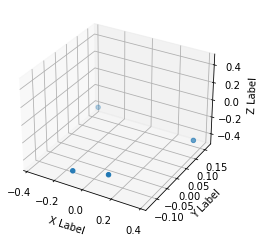

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.159794  -0.0821835 -0.102877 ]. Coord: [0.111, -0.106, -0.399]. Step size: [-0.272, -0.018000000000000002, -0.006000000000000005].


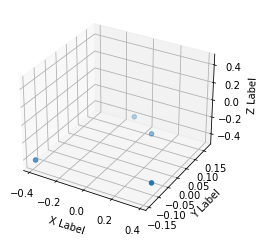

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [0.271951 0.039922 0.398862]. Coord: [0.382, -0.096, -0.394]. Step size: [0.271, 0.009999999999999995, 0.0050000000000000044].


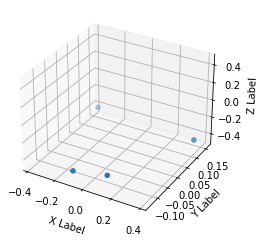

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.171223  -0.0587885 -0.168924 ]. Coord: [0.108, -0.113, -0.399]. Step size: [-0.274, -0.017, -0.0050000000000000044].


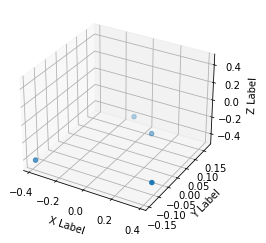

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.27062   0.0198929 0.348795 ]. Coord: [0.382, -0.095, -0.394]. Step size: [0.274, 0.018000000000000002, 0.0050000000000000044].


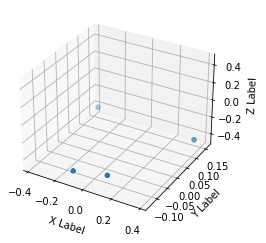

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.174034  -0.0658791 -0.179576 ]. Coord: [0.107, -0.11, -0.399]. Step size: [-0.275, -0.015, -0.0050000000000000044].


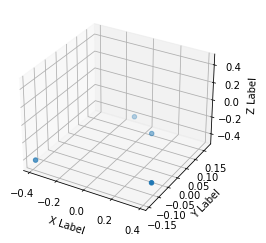

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.259487  0.0173163 0.361578 ]. Coord: [0.383, -0.096, -0.393]. Step size: [0.276, 0.013999999999999999, 0.006000000000000005].


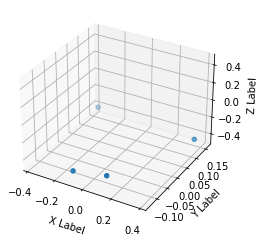

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.143699  -0.0705269 -0.141227 ]. Coord: [0.108, -0.112, -0.399]. Step size: [-0.275, -0.016, -0.006000000000000005].


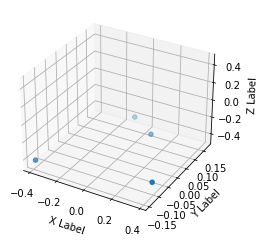

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [ 0.24843   -0.0186269  0.366904 ]. Coord: [0.383, -0.094, -0.394]. Step size: [0.275, 0.018000000000000002, 0.0050000000000000044].


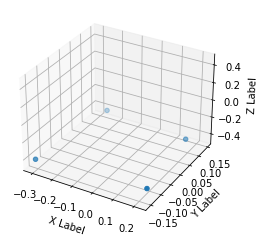

Diff: 47492.0. Command: [0.809811 0.       0.      ]. State: [0.492772  0.0586698 0.0952619]. Coord: [0.217, -0.13, -0.407]. Step size: [-0.166, -0.036000000000000004, -0.012999999999999956].


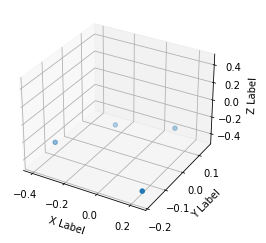

Diff: 259.0. Command: [0.809811 0.       0.      ]. State: [0.422101  0.0531586 0.663048 ]. Coord: [0.243, -0.184, -0.382]. Step size: [0.025999999999999995, -0.05399999999999999, 0.024999999999999967].


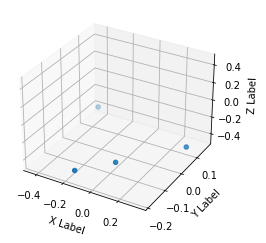

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.0902246  0.240934  -0.59716  ]. Coord: [0.028, -0.092, -0.392]. Step size: [-0.215, 0.092, -0.010000000000000009].


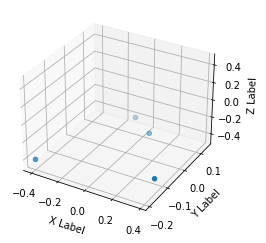

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [0.251278 0.105526 0.285944]. Coord: [0.38, -0.129, -0.381]. Step size: [0.352, -0.037000000000000005, 0.01100000000000001].


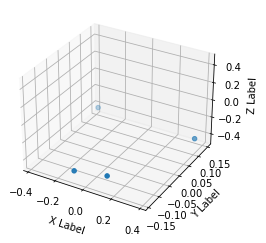

Diff: 257.0. Command: [0.809811 0.       0.      ]. State: [ 0.0462639 -0.117793  -0.0900941]. Coord: [0.112, -0.124, -0.394]. Step size: [-0.268, 0.0050000000000000044, -0.013000000000000012].


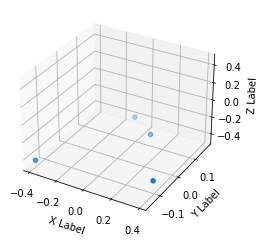

Diff: 274.0. Command: [0.809811 0.       0.      ]. State: [ 0.213977  -0.0283733  0.339207 ]. Coord: [0.386, -0.095, -0.388]. Step size: [0.274, 0.028999999999999998, 0.006000000000000005].


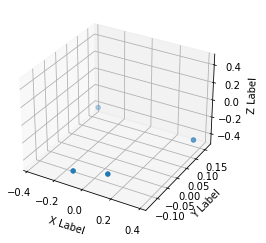

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.159784 -0.092651 -0.140162]. Coord: [0.107, -0.108, -0.396]. Step size: [-0.279, -0.012999999999999998, -0.008000000000000007].


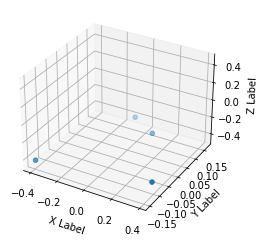

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [ 0.262867 -0.013316  0.323228]. Coord: [0.386, -0.098, -0.39]. Step size: [0.279, 0.009999999999999995, 0.006000000000000005].


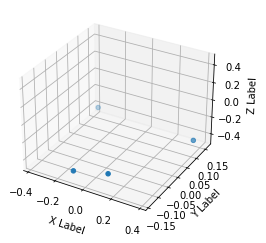

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.220271 -0.104019 -0.216861]. Coord: [0.104, -0.111, -0.397]. Step size: [-0.28200000000000003, -0.012999999999999998, -0.007000000000000006].


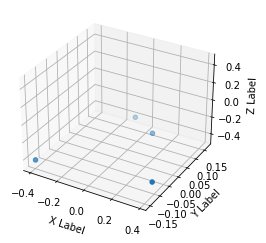

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 0.205825  -0.0584697  0.322163 ]. Coord: [0.384, -0.099, -0.391]. Step size: [0.28, 0.011999999999999997, 0.006000000000000005].


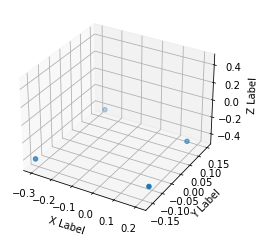

Diff: 28019.0. Command: [0.809811 0.       0.      ]. State: [0.372153  0.0104268 0.0910008]. Coord: [0.21, -0.128, -0.406]. Step size: [-0.17400000000000002, -0.028999999999999998, -0.015000000000000013].


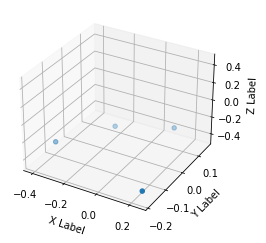

Diff: 259.0. Command: [0.809811 0.       0.      ]. State: [0.406293  0.0754944 0.670505 ]. Coord: [0.249, -0.187, -0.382]. Step size: [0.03900000000000001, -0.059, 0.02400000000000002].


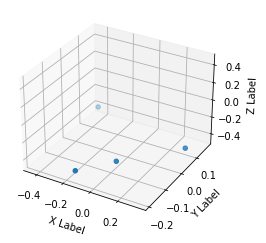

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 0.134278  0.181588 -0.645097]. Coord: [0.026, -0.089, -0.393]. Step size: [-0.223, 0.098, -0.01100000000000001].


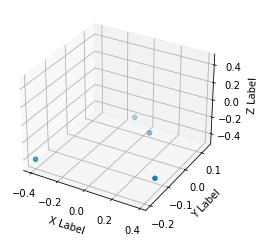

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.294096  0.0749081 0.193266 ]. Coord: [0.383, -0.131, -0.38]. Step size: [0.357, -0.04200000000000001, 0.013000000000000012].


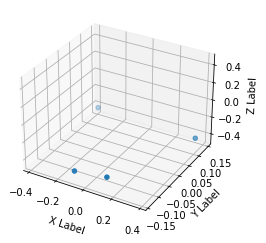

Diff: 259.0. Command: [0.809811 0.       0.      ]. State: [ 0.0741583 -0.121181  -0.0794415]. Coord: [0.116, -0.126, -0.394]. Step size: [-0.267, 0.0050000000000000044, -0.014000000000000012].


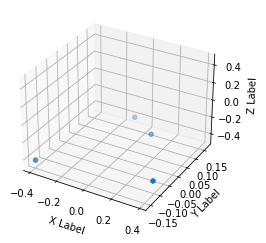

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [ 0.285744  -0.0394691  0.219898 ]. Coord: [0.386, -0.096, -0.389]. Step size: [0.27, 0.03, 0.0050000000000000044].


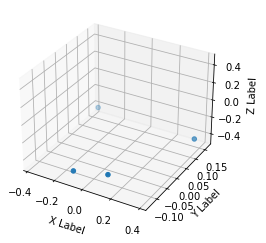

Diff: 259.0. Command: [0.809811 0.       0.      ]. State: [ 0.134071  -0.0764273 -0.1359   ]. Coord: [0.111, -0.107, -0.397]. Step size: [-0.275, -0.010999999999999996, -0.008000000000000007].


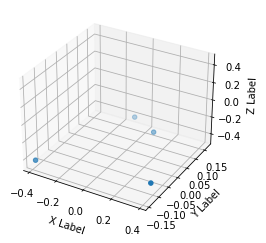

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [ 0.205243  -0.0124698  0.373296 ]. Coord: [0.385, -0.1, -0.388]. Step size: [0.274, 0.006999999999999992, 0.009000000000000008].


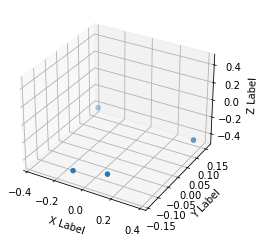

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.159757  -0.0796418 -0.222187 ]. Coord: [0.105, -0.113, -0.395]. Step size: [-0.28, -0.012999999999999998, -0.007000000000000006].


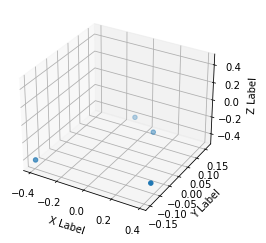

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [0.293191  0.0206808 0.2689   ]. Coord: [0.386, -0.106, -0.388]. Step size: [0.281, 0.007000000000000006, 0.007000000000000006].


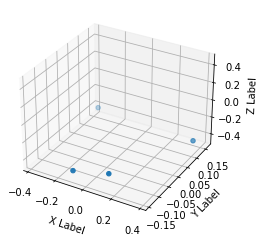

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.183647 -0.061797 -0.222187]. Coord: [0.108, -0.113, -0.396]. Step size: [-0.278, -0.007000000000000006, -0.008000000000000007].


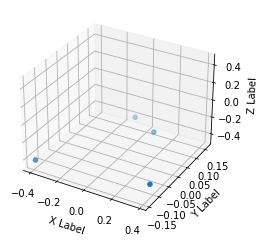

Diff: 270.0. Command: [0.809811 0.       0.      ]. State: [0.268246 0.037617 0.334946]. Coord: [0.385, -0.106, -0.391]. Step size: [0.277, 0.007000000000000006, 0.0050000000000000044].


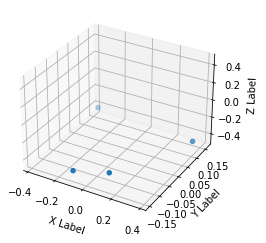

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.181435  -0.0736998 -0.23497  ]. Coord: [0.105, -0.112, -0.397]. Step size: [-0.28, -0.006000000000000005, -0.006000000000000005].


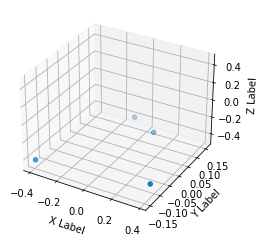

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.294096  0.0546607 0.277422 ]. Coord: [0.384, -0.11, -0.392]. Step size: [0.279, 0.0020000000000000018, 0.0050000000000000044].


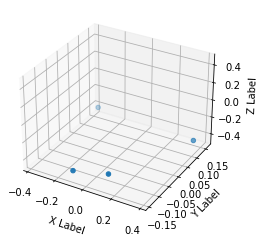

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.164686  -0.0604319 -0.183837 ]. Coord: [0.107, -0.115, -0.398]. Step size: [-0.277, -0.0050000000000000044, -0.006000000000000005].


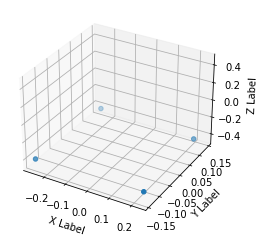

Diff: 9763.0. Command: [0.809811 0.       0.      ]. State: [ 0.400736  -0.0238484  0.158112 ]. Coord: [0.227, -0.135, -0.407]. Step size: [0.12000000000000001, -0.020000000000000004, -0.008999999999999952].


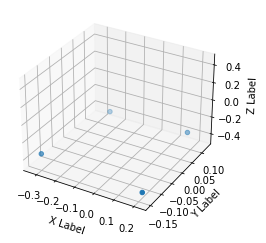

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.305307   0.00397354 0.177287  ]. Coord: [0.218, -0.151, -0.398]. Step size: [-0.009000000000000008, -0.015999999999999986, 0.008999999999999952].


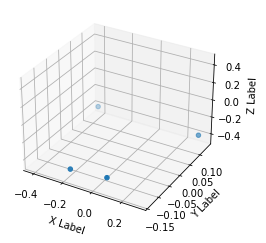

Diff: 255.0. Command: [0.809811 0.       0.      ]. State: [ 0.103133   0.0759628 -0.470394 ]. Coord: [0.058, -0.127, -0.391]. Step size: [-0.16, 0.023999999999999994, 0.007000000000000006].


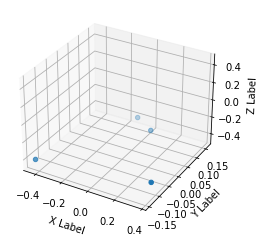

Diff: 275.0. Command: [0.809811 0.       0.      ]. State: [ 0.198547  -0.0474424  0.55013  ]. Coord: [0.369, -0.101, -0.385]. Step size: [0.311, 0.025999999999999995, 0.006000000000000005].


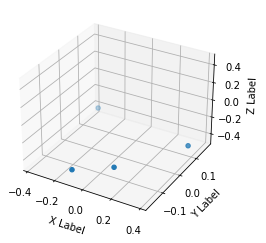

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.219655  -0.0254299 -0.152945 ]. Coord: [0.101, -0.103, -0.392]. Step size: [-0.268, -0.001999999999999988, -0.007000000000000006].


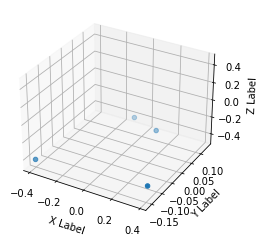

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.261423  0.0580828 0.245464 ]. Coord: [0.383, -0.132, -0.384]. Step size: [0.28200000000000003, -0.029000000000000012, 0.008000000000000007].


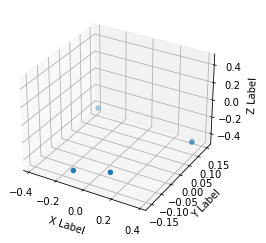

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.207348  -0.0194115 -0.211534 ]. Coord: [0.107, -0.12, -0.393]. Step size: [-0.276, 0.01200000000000001, -0.009000000000000008].


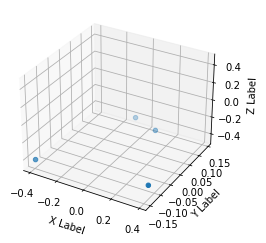

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.218218  0.0258623 0.32962  ]. Coord: [0.388, -0.121, -0.385]. Step size: [0.281, -0.0010000000000000009, 0.008000000000000007].


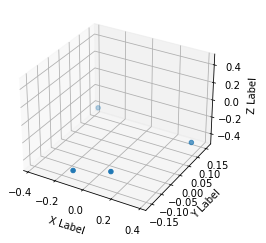

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.198701  -0.0123161 -0.187033 ]. Coord: [0.107, -0.116, -0.395]. Step size: [-0.281, 0.0049999999999999906, -0.010000000000000009].


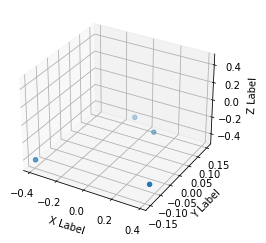

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.253967  0.0843601 0.285944 ]. Coord: [0.383, -0.115, -0.388]. Step size: [0.276, 0.0010000000000000009, 0.007000000000000006].


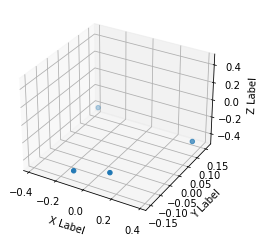

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.188156   -0.00324451 -0.241362  ]. Coord: [0.106, -0.116, -0.395]. Step size: [-0.277, -0.0010000000000000009, -0.007000000000000006].


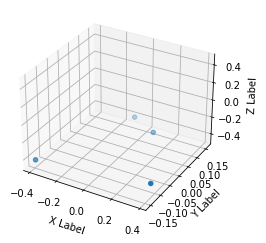

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [0.289578  0.0419974 0.263574 ]. Coord: [0.384, -0.109, -0.392]. Step size: [0.278, 0.007000000000000006, 0.0030000000000000027].


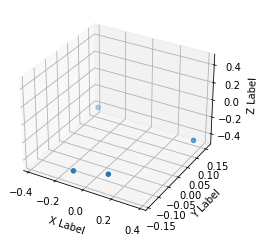

Diff: 262.0. Command: [0.809811 0.       0.      ]. State: [ 0.18579   -0.0929586 -0.249884 ]. Coord: [0.106, -0.113, -0.398]. Step size: [-0.278, -0.0040000000000000036, -0.006000000000000005].


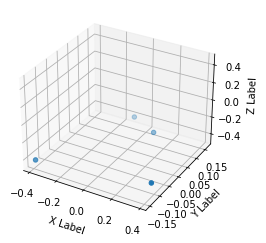

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.264029  0.0248544 0.341338 ]. Coord: [0.383, -0.102, -0.393]. Step size: [0.277, 0.01100000000000001, 0.0050000000000000044].


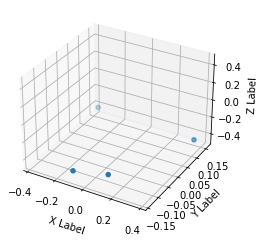

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.158121 -0.090784 -0.162532]. Coord: [0.109, -0.113, -0.398]. Step size: [-0.274, -0.01100000000000001, -0.0050000000000000044].


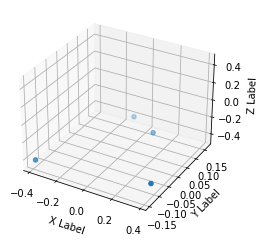

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [0.310323  0.0510865 0.284879 ]. Coord: [0.381, -0.102, -0.395]. Step size: [0.272, 0.01100000000000001, 0.0030000000000000027].


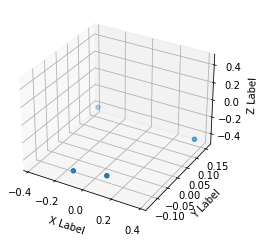

Diff: 259.0. Command: [0.809811 0.       0.      ]. State: [ 0.15358  -0.049935 -0.160402]. Coord: [0.107, -0.114, -0.399]. Step size: [-0.274, -0.01200000000000001, -0.0040000000000000036].


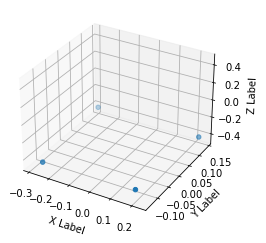

Diff: 18272.0. Command: [0.809811 0.       0.      ]. State: [ 0.638265  -0.0051728  0.0451944]. Coord: [0.188, -0.126, -0.414]. Step size: [0.081, -0.011999999999999997, -0.014999999999999958].


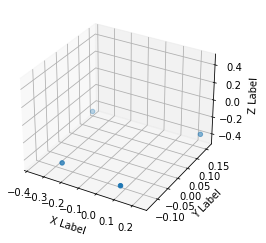

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.372863   0.0870472 -0.229644 ]. Coord: [0.11, -0.131, -0.403]. Step size: [-0.078, -0.0050000000000000044, 0.010999999999999954].


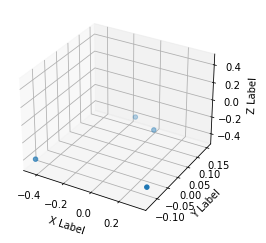

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 0.140191 -0.12609   0.677962]. Coord: [0.33, -0.111, -0.389]. Step size: [0.22000000000000003, 0.020000000000000004, 0.014000000000000012].


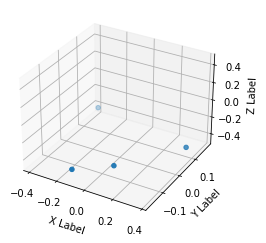

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.168914   0.0247123 -0.222187 ]. Coord: [0.081, -0.098, -0.39]. Step size: [-0.249, 0.012999999999999998, -0.0010000000000000009].


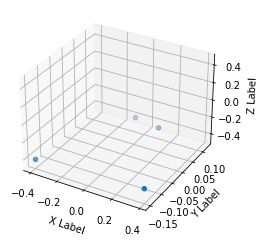

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.195148 0.100986 0.340273]. Coord: [0.385, -0.141, -0.378]. Step size: [0.304, -0.04299999999999998, 0.01200000000000001].


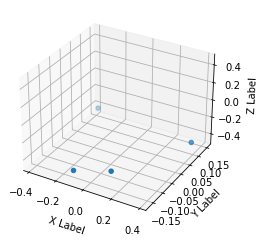

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.197544  -0.0290764 -0.266928 ]. Coord: [0.107, -0.122, -0.392]. Step size: [-0.278, 0.01899999999999999, -0.014000000000000012].


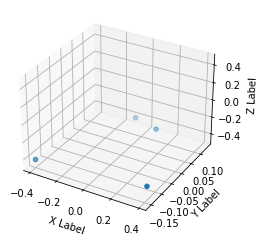

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.211901   -0.00233815  0.316837  ]. Coord: [0.39, -0.132, -0.381]. Step size: [0.28300000000000003, -0.010000000000000009, 0.01100000000000001].


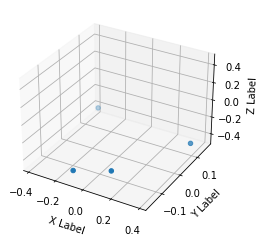

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.229432  -0.0306737 -0.177446 ]. Coord: [0.106, -0.116, -0.395]. Step size: [-0.28400000000000003, 0.016, -0.014000000000000012].


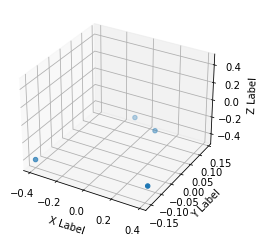

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.28036   0.0415263 0.231616 ]. Coord: [0.386, -0.128, -0.386]. Step size: [0.28, -0.011999999999999997, 0.009000000000000008].


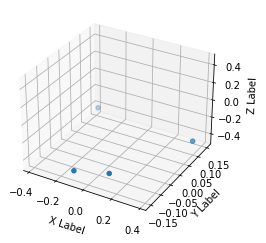

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.198129  -0.0241393 -0.259471 ]. Coord: [0.107, -0.122, -0.394]. Step size: [-0.279, 0.006000000000000005, -0.008000000000000007].


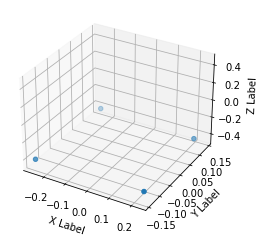

Diff: 17935.0. Command: [0.809811 0.       0.      ]. State: [ 0.402096  -0.0106658  0.145329 ]. Coord: [0.227, -0.135, -0.407]. Step size: [0.12000000000000001, -0.013000000000000012, -0.012999999999999956].


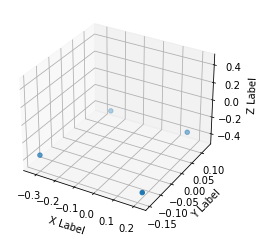

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [0.308451  0.0115851 0.087805 ]. Coord: [0.219, -0.147, -0.399]. Step size: [-0.008000000000000007, -0.011999999999999983, 0.007999999999999952].


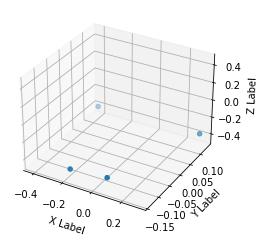

Diff: 255.0. Command: [0.809811 0.       0.      ]. State: [ 0.0966898  0.0850213 -0.465067 ]. Coord: [0.06, -0.127, -0.391]. Step size: [-0.159, 0.01999999999999999, 0.008000000000000007].


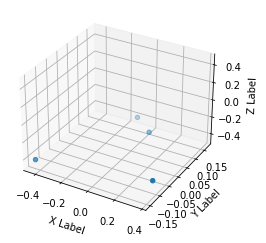

Diff: 275.0. Command: [0.809811 0.       0.      ]. State: [ 0.1696    -0.0995754  0.462778 ]. Coord: [0.369, -0.096, -0.383]. Step size: [0.309, 0.031, 0.008000000000000007].


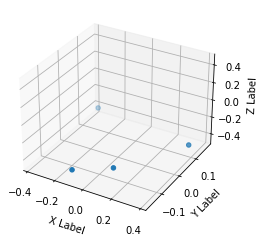

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.229817 -0.038632 -0.207273]. Coord: [0.101, -0.101, -0.391]. Step size: [-0.268, -0.0050000000000000044, -0.008000000000000007].


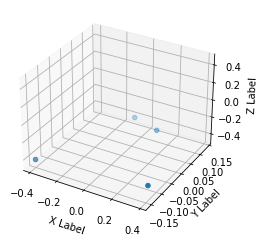

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.233235  0.0601363 0.249725 ]. Coord: [0.382, -0.128, -0.384]. Step size: [0.281, -0.026999999999999996, 0.007000000000000006].


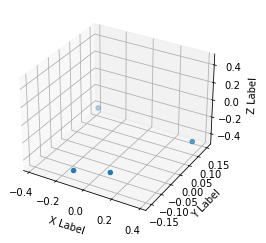

Diff: 263.0. Command: [0.809811 0.       0.      ]. State: [ 0.204297  -0.0317612 -0.272254 ]. Coord: [0.107, -0.12, -0.393]. Step size: [-0.275, 0.008000000000000007, -0.009000000000000008].


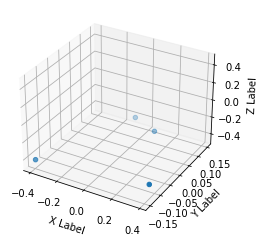

Diff: 268.0. Command: [0.809811 0.       0.      ]. State: [0.249874  0.0204434 0.318967 ]. Coord: [0.385, -0.116, -0.386]. Step size: [0.278, 0.00399999999999999, 0.007000000000000006].


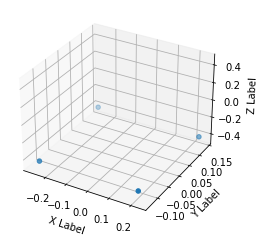

Diff: 18369.0. Command: [0.809811 0.       0.      ]. State: [0.473195  0.0295355 0.0558471]. Coord: [0.206, -0.127, -0.416]. Step size: [-0.17900000000000002, -0.010999999999999996, -0.02999999999999997].


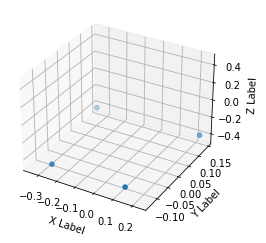

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.351793   0.0223082 -0.041092 ]. Coord: [0.137, -0.129, -0.405]. Step size: [-0.06899999999999998, -0.0020000000000000018, 0.010999999999999954].


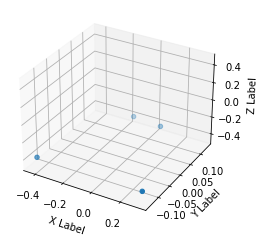

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.155575 -0.153257  0.517107]. Coord: [0.317, -0.136, -0.385]. Step size: [0.18, -0.007000000000000006, 0.020000000000000018].


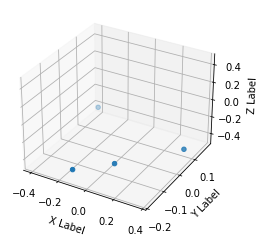

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.187537  0.137575 -0.261602]. Coord: [0.065, -0.093, -0.392]. Step size: [-0.252, 0.04300000000000001, -0.007000000000000006].


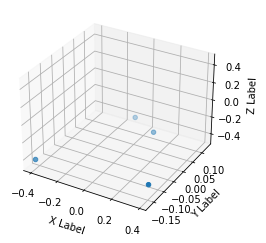

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.250045 0.152607 0.252921]. Coord: [0.386, -0.137, -0.38]. Step size: [0.321, -0.04400000000000001, 0.01200000000000001].


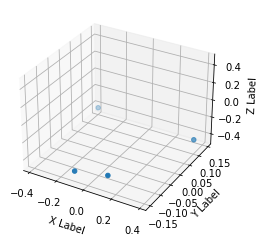

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.0951916 -0.064039  -0.172119 ]. Coord: [0.111, -0.129, -0.394]. Step size: [-0.275, 0.008000000000000007, -0.014000000000000012].


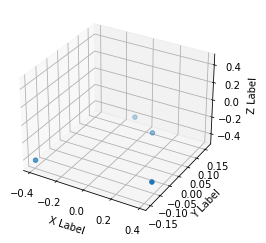

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.253171   0.00816244 0.232681  ]. Coord: [0.387, -0.102, -0.388]. Step size: [0.276, 0.02700000000000001, 0.006000000000000005].


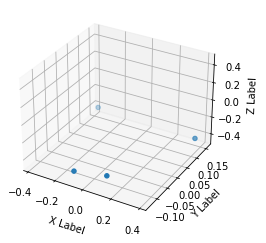

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.117028  -0.0553114 -0.143357 ]. Coord: [0.11, -0.113, -0.397]. Step size: [-0.277, -0.01100000000000001, -0.009000000000000008].


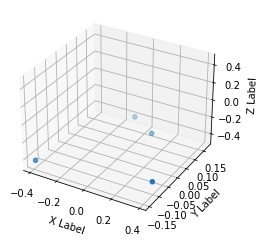

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [ 0.28188   -0.0178507  0.273161 ]. Coord: [0.387, -0.094, -0.39]. Step size: [0.277, 0.019000000000000003, 0.007000000000000006].


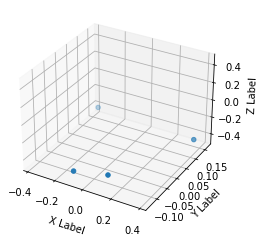

Diff: 260.0. Command: [0.809811 0.       0.      ]. State: [ 0.118051  -0.0776723 -0.102877 ]. Coord: [0.111, -0.108, -0.398]. Step size: [-0.276, -0.013999999999999999, -0.008000000000000007].


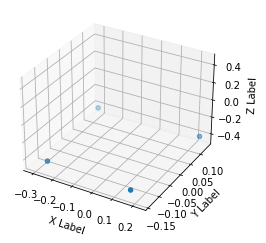

Diff: 22974.0. Command: [0.809811 0.       0.      ]. State: [0.452153  0.0154693 0.0558471]. Coord: [0.168, -0.14, -0.412]. Step size: [0.05700000000000001, -0.032000000000000015, -0.013999999999999957].


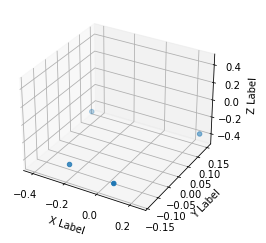

Diff: 255.0. Command: [0.809811 0.       0.      ]. State: [ 0.364092  0.143965 -0.420326]. Coord: [0.077, -0.137, -0.399]. Step size: [-0.09100000000000001, 0.0030000000000000027, 0.012999999999999956].


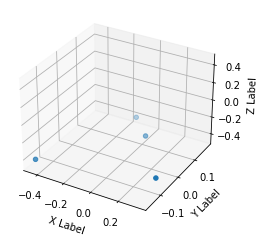

Diff: 277.0. Command: [0.809811 0.       0.      ]. State: [ 0.224558 -0.198072  0.556521]. Coord: [0.337, -0.082, -0.388]. Step size: [0.26, 0.05500000000000001, 0.01100000000000001].


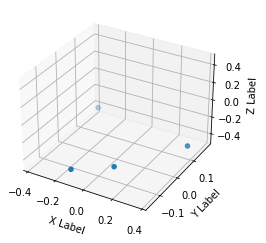

Diff: 262.0. Command: [0.809811 0.       0.      ]. State: [ 0.166872 -0.04671  -0.169989]. Coord: [0.092, -0.086, -0.391]. Step size: [-0.24500000000000002, -0.00399999999999999, -0.0030000000000000027].


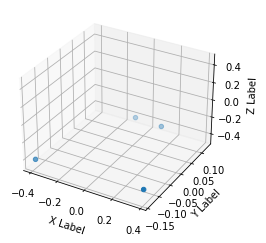

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [0.162291  0.0906185 0.310445 ]. Coord: [0.38, -0.133, -0.38]. Step size: [0.28800000000000003, -0.047000000000000014, 0.01100000000000001].


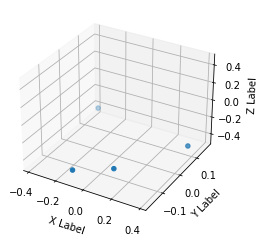

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [ 0.271771 -0.037451 -0.182772]. Coord: [0.105, -0.108, -0.393]. Step size: [-0.275, 0.02500000000000001, -0.013000000000000012].


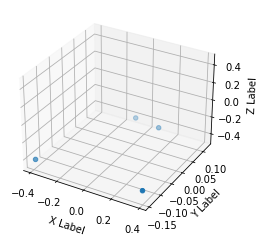

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [0.213738  0.0494362 0.328555 ]. Coord: [0.388, -0.144, -0.38]. Step size: [0.28300000000000003, -0.03599999999999999, 0.013000000000000012].


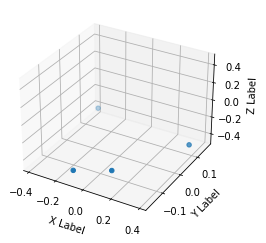

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [ 0.234447 -0.043157 -0.185968]. Coord: [0.107, -0.118, -0.393]. Step size: [-0.281, 0.025999999999999995, -0.013000000000000012].


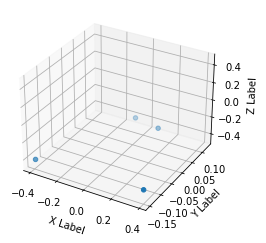

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.240199  0.0849323 0.306184 ]. Coord: [0.388, -0.142, -0.383]. Step size: [0.281, -0.023999999999999994, 0.010000000000000009].


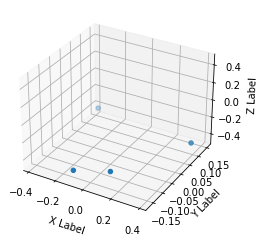

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.227886 -0.048382 -0.241362]. Coord: [0.106, -0.124, -0.393]. Step size: [-0.28200000000000003, 0.017999999999999988, -0.010000000000000009].


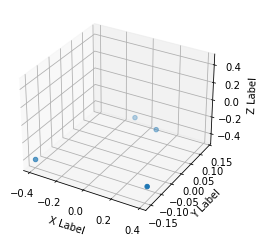

Diff: 269.0. Command: [0.809811 0.       0.      ]. State: [0.25418   0.0269727 0.273161 ]. Coord: [0.387, -0.13, -0.386]. Step size: [0.281, -0.006000000000000005, 0.007000000000000006].


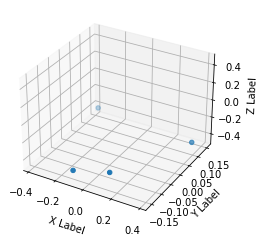

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.242008  -0.0554506 -0.227513 ]. Coord: [0.106, -0.121, -0.394]. Step size: [-0.281, 0.009000000000000008, -0.008000000000000007].


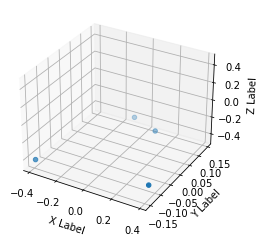

Diff: 267.0. Command: [0.809811 0.       0.      ]. State: [0.237649  0.0301513 0.288075 ]. Coord: [0.384, -0.12, -0.387]. Step size: [0.278, 0.0010000000000000009, 0.007000000000000006].


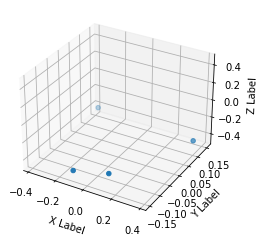

Diff: 265.0. Command: [0.809811 0.       0.      ]. State: [ 0.200547  -0.0609274 -0.222187 ]. Coord: [0.106, -0.118, -0.395]. Step size: [-0.278, 0.0020000000000000018, -0.008000000000000007].


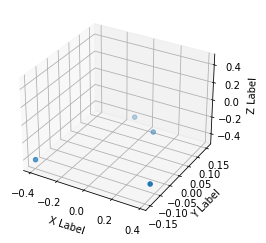

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [0.328302  0.0673107 0.332816 ]. Coord: [0.383, -0.111, -0.391]. Step size: [0.277, 0.006999999999999992, 0.0040000000000000036].


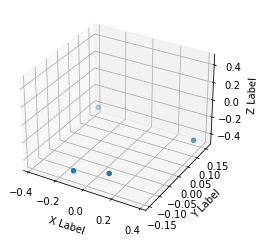

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.17343   -0.0423139 -0.179576 ]. Coord: [0.106, -0.114, -0.397]. Step size: [-0.277, -0.0030000000000000027, -0.006000000000000005].


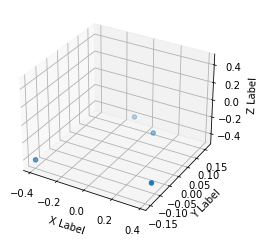

Diff: 273.0. Command: [0.809811 0.       0.      ]. State: [0.316827  0.0486298 0.331751 ]. Coord: [0.382, -0.104, -0.394]. Step size: [0.276, 0.010000000000000009, 0.0030000000000000027].


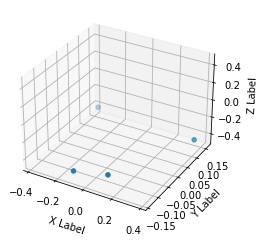

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.188435  -0.0816668 -0.179576 ]. Coord: [0.106, -0.114, -0.399]. Step size: [-0.276, -0.010000000000000009, -0.0050000000000000044].


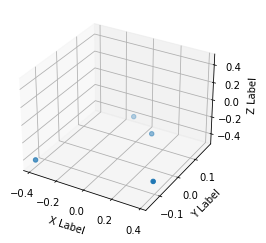

Diff: 272.0. Command: [0.809811 0.       0.      ]. State: [ 0.321459  -0.0298625  0.28914  ]. Coord: [0.381, -0.093, -0.396]. Step size: [0.275, 0.021000000000000005, 0.0030000000000000027].


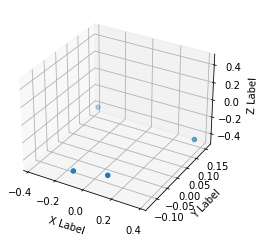

Diff: 261.0. Command: [0.809811 0.       0.      ]. State: [ 0.181484  -0.0921933 -0.142292 ]. Coord: [0.108, -0.109, -0.4]. Step size: [-0.273, -0.016, -0.0040000000000000036].


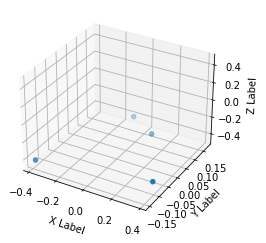

Diff: 271.0. Command: [0.809811 0.       0.      ]. State: [ 0.293021  -0.0177596  0.257182 ]. Coord: [0.382, -0.092, -0.395]. Step size: [0.274, 0.017, 0.0050000000000000044].


In [43]:
visualize_static_foosteps(motion_08_fwd, footsteps_08_fwd)

RuntimeError: Requested MovieWriter (ffmpeg) not available

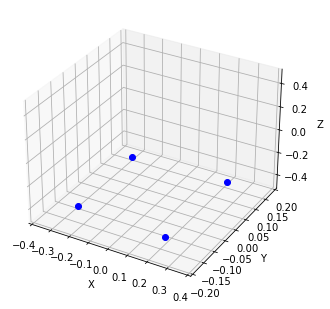

In [44]:
anim = visualize_animated_footsteps(motion_08_fwd, footsteps_08_fwd, "bo")
HTML(anim.to_html5_video())

### Backward motion

In [ ]:
anim = visualize_animated_footsteps(motion_08_bwd, footsteps_08_bwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

In [ ]:
anim = visualize_animated_footsteps(motion_08_side_right, footsteps_08_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

In [ ]:
anim = visualize_animated_footsteps(motion_08_side_left, footsteps_08_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

In [ ]:
anim = visualize_animated_footsteps(motion_08_clock, footsteps_08_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

In [ ]:
anim = visualize_animated_footsteps(motion_08_count, footsteps_08_count, "bo")
HTML(anim.to_html5_video())

# Multivariate Linear Regression (FR foot prediction)

The input will use initially only:

- **HighCmd: fwd, side, rot speeds**
- **HighState: fwd, side, rot speeds, footPosition2Body (FR)**

and as output we seek to predict the following:

- **footPosition2Body (FR)**

In [45]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [46]:
def plot_target_and_predictions(title: str, predictions, target):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(range(predictions.shape[0]), predictions, 'b-')
    ax1.set_ylabel('Predictions')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(range(predictions.shape[0]), target, 'g-')
    ax2.set_ylabel('Target', color='g')

    for tl in ax2.get_yticklabels():
        tl.set_color('g')
    
    fig.tight_layout()
    plt.show()

In [47]:
def create_timestamp_consistent_dataset(dataset, footsteps):
    # Footsteps sizes
    inputs = []
    labels = []
        
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 300:
                inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + dataset[footsteps[idx-1], 32:44].tolist())
                labels.append(dataset[footsteps[idx], 32:44])
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_08_fwd_3D, Y_motion_08_fwd_3D = create_timestamp_consistent_dataset(motion_08_fwd, footsteps_08_fwd)
X_motion_08_bwd_3D, Y_motion_08_bwd_3D = create_timestamp_consistent_dataset(motion_08_bwd, footsteps_08_bwd)
X_motion_08_clock_3D, Y_motion_08_clock_3D = create_timestamp_consistent_dataset(motion_08_clock, footsteps_08_clock)
X_motion_08_count_3D, Y_motion_08_count_3D = create_timestamp_consistent_dataset(motion_08_count, footsteps_08_count)
X_motion_08_side_left_3D, Y_motion_08_side_left_3D = create_timestamp_consistent_dataset(motion_08_side_left, footsteps_08_side_left)
X_motion_08_side_right_3D, Y_motion_08_side_right_3D = create_timestamp_consistent_dataset(motion_08_side_right, footsteps_08_side_right)

# Stack datasets
X_motion_08_3D = np.concatenate((X_motion_08_fwd_3D, X_motion_08_bwd_3D, X_motion_08_side_right_3D, X_motion_08_side_left_3D, X_motion_08_clock_3D, X_motion_08_count_3D))
Y_motion_08_3D = np.concatenate((Y_motion_08_fwd_3D, Y_motion_08_bwd_3D, Y_motion_08_side_right_3D, Y_motion_08_side_left_3D, Y_motion_08_clock_3D, Y_motion_08_count_3D))

In [51]:
%store X_motion_08_3D
%store Y_motion_08_3D

Stored 'X_motion_08_3D' (ndarray)
Stored 'Y_motion_08_3D' (ndarray)


In [48]:
def create_timestamp_consistent_dataset_with_step_size_labels(dataset, footsteps, threshold=0.04):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 300:
                # Input (command, state, x/y/z position for each foot)
                #inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + dataset[footsteps[idx-1], 32:44].tolist())
                
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 100))
                idx_height_check = absolute_val_array.argmin()
                
                fr_moving = np.abs(dataset[footstep, 34] - dataset[idx_height_check, 34]) > threshold
                fl_moving = np.abs(dataset[footstep, 37] - dataset[idx_height_check, 37]) > threshold
                rr_moving = np.abs(dataset[footstep, 40] - dataset[idx_height_check, 40]) > threshold
                rl_moving = np.abs(dataset[footstep, 43] - dataset[idx_height_check, 43]) > threshold

                assert fr_moving == rl_moving
                assert rr_moving == fl_moving
                assert fr_moving != fl_moving
                
                # Compute FR movement
                fr_movement_x = abs(abs(dataset[footstep, 32]) - abs(dataset[footsteps[idx+1], 32]))
                fr_movement_y = abs(abs(dataset[footstep, 33]) - abs(dataset[footsteps[idx+1], 33]))
                
                # Compute FL movement
                fl_movement_x = abs(abs(dataset[footstep, 35]) - abs(dataset[footsteps[idx+1], 35]))
                fl_movement_y = abs(abs(dataset[footstep, 36]) - abs(dataset[footsteps[idx+1], 36]))
                
                # Compute RR movement
                rr_movement_x = abs(abs(dataset[footstep, 38]) - abs(dataset[footsteps[idx+1], 38]))
                rr_movement_y = abs(abs(dataset[footstep, 39]) - abs(dataset[footsteps[idx+1], 39]))
                
                # Compute RL movement
                rl_movement_x = abs(abs(dataset[footstep, 41]) - abs(dataset[footsteps[idx+1], 41]))
                rl_movement_y = abs(abs(dataset[footstep, 42]) - abs(dataset[footsteps[idx+1], 42]))
                
                label = []
                                
                if fr_moving:
                    label.append([fr_movement_x + fl_movement_x, fr_movement_y + fl_movement_y, 0, 0, 0, 0, rr_movement_x + rl_movement_x, rr_movement_y + rl_movement_y])
                elif fl_moving:
                    label.append([0, 0, fr_movement_x + fl_movement_x, fr_movement_y + fl_movement_y, rr_movement_x + rl_movement_x, rr_movement_y + rl_movement_y, 0, 0])
                else:
                    print("\nERROR")
                    
                labels.append(label)
                inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + [int(fr_moving), int(fl_moving), int(rr_moving), int(rl_moving)])
                
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy.reshape(labels_numpy.shape[0], labels_numpy.shape[2])

X_motion_08_fwd_step, Y_motion_08_fwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_08_fwd, footsteps_08_fwd)
X_motion_08_bwd_step, Y_motion_08_bwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_08_bwd, footsteps_08_bwd)
X_motion_08_clock_step, Y_motion_08_clock_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_08_clock, footsteps_08_clock)
X_motion_08_count_step, Y_motion_08_count_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_08_count, footsteps_08_count)
X_motion_08_side_left_step, Y_motion_08_side_left_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_08_side_left, footsteps_08_side_left)
X_motion_08_side_right_step, Y_motion_08_side_right_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_08_side_right, footsteps_08_side_right)

# Stack datasets
X_motion_08_step = np.concatenate((X_motion_08_fwd_step, X_motion_08_bwd_step, X_motion_08_side_right_step, X_motion_08_side_left_step, X_motion_08_clock_step, X_motion_08_count_step))
Y_motion_08_step = np.concatenate((Y_motion_08_fwd_step, Y_motion_08_bwd_step, Y_motion_08_side_right_step, Y_motion_08_side_left_step, Y_motion_08_clock_step, Y_motion_08_count_step))

In [49]:
%store X_motion_08_step
%store Y_motion_08_step

Stored 'X_motion_08_step' (ndarray)
Stored 'Y_motion_08_step' (ndarray)


In [50]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} motion\n')
    
    # Find all positive movements in x and y for FR
    fr_steps_x = np.where(dataset[:, 0] > 0)[0]
    fr_steps_y = np.where(dataset[:, 1] > 0)[0]
    
    # Find all positive movements in x and y for FR
    fl_steps_x = np.where(dataset[:, 2] > 0)[0]
    fl_steps_y = np.where(dataset[:, 3] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rr_steps_x = np.where(dataset[:, 4] > 0)[0]
    rr_steps_y = np.where(dataset[:, 5] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rl_steps_x = np.where(dataset[:, 6] > 0)[0]
    rl_steps_y = np.where(dataset[:, 7] > 0)[0]
    
    # Compute stats for FR foot
    print(f'FR mean x step: {np.mean(dataset[fr_steps_x, 0])}. FR std x step: {np.std(dataset[fr_steps_x, 0])}. FR mean y step: {np.mean(dataset[fr_steps_y, 1])}. FR std y step: {np.mean(dataset[fr_steps_y, 1])}')
 
    # Compute stats for FL foot
    print(f'FL mean x step: {np.mean(dataset[fl_steps_x, 2])}. FL std x step: {np.std(dataset[fl_steps_x, 2])}. FL mean y step: {np.mean(dataset[fl_steps_y, 3])}. FL std y step: {np.mean(dataset[fl_steps_y, 3])}')
    
    # Compute stats for RR foot
    print(f'RR mean x step: {np.mean(dataset[rr_steps_x, 4])}. RR std x step: {np.std(dataset[rr_steps_x, 4])}. RR mean y step: {np.mean(dataset[rr_steps_y, 5])}. RR std y step: {np.mean(dataset[rr_steps_y, 5])}')
    
    # Compute stats for RL foot
    print(f'RL mean x step: {np.mean(dataset[rl_steps_x, 6])}. RL std x step: {np.std(dataset[rl_steps_x, 6])}. RL mean y step: {np.mean(dataset[rl_steps_y, 7])}. RL std y step: {np.mean(dataset[rl_steps_y, 7])}\n')
    
labels_stats(Y_motion_08_fwd_step, "forward")
labels_stats(Y_motion_08_bwd_step, "backward")
labels_stats(Y_motion_08_clock_step, "clockwise")
labels_stats(Y_motion_08_count_step, "counter clockwise")
labels_stats(Y_motion_08_side_left_step, "left step")
labels_stats(Y_motion_08_side_right_step, "right step")

Statistics for forward motion

FR mean x step: 0.519079365079365. FR std x step: 0.11955503502402934. FR mean y step: 0.03168253968253968. FR std y step: 0.03168253968253968
FL mean x step: 0.51209375. FL std x step: 0.12881208682005546. FL mean y step: 0.031328125. FL std y step: 0.031328125
RR mean x step: 0.520703125. RR std x step: 0.12850421681888255. RR mean y step: 0.033593750000000006. RR std y step: 0.033593750000000006
RL mean x step: 0.527. RL std x step: 0.11630297052260082. RL mean y step: 0.033338709677419344. RL std y step: 0.033338709677419344

Statistics for backward motion

FR mean x step: 0.2337042093023256. FR std x step: 0.061415468454733224. FR mean y step: 0.040220162790697685. FR std y step: 0.040220162790697685
FL mean x step: 0.2419769. FL std x step: 0.03843378918399799. FL mean y step: 0.041011925000000005. FL std y step: 0.041011925000000005
RR mean x step: 0.24569305000000002. RR std x step: 0.040062791849763794. RR mean y step: 0.027972474999999997. RR st